# Projet Machine Learning - Groupe 1 - Notebook R

---

# >>> LE CODE A ETE RELU JUSQU'A 2.8 INCLUS (Boosting)
# >>> Partie 2.11.2 en cours
# >>> Réseaux de neuronnes à recheck 
# Sélim 11/05

---

Promotion 58 - 4GMM, Année universitaire 2023-2024\
Julia Manon (B), Piot Damien (A), Dumas Thomas (B), Ben Abdallah Selim (A)

---
Les données sont issues du site du concours KAGGLE; il s’agit du jeu de données " Global Data on Sustainable Energy" (2000-2020) disponible ici: https://www.kaggle.com/datasets/anshtanwar/global-data-on-sustainable-energy.

Le jeu de données comprend 3649 observations et 21 variables, qui représentent diverses caractéristiques liées à
la consommation énergétique et à la géographie de 176 pays du monde au cours des années 2000 à 2020.

---

Les variables sont les suivantes:\
• **Entity** : Nom du pays ou de la région pour lequel les données sont rapportées.\
• **Year** : Année pour laquelle les données sont communiquées, entre 2000 et 2020.\
• **Access to electricity (% of population)** : Pourcentage de la population ayant accès à l’électricité.\
• **Access to clean fuels for cooking (% of population)** : Pourcentage de la population qui utilise principalement des combustibles propres.\
• **Renewable-electricity-generating-capacity-per-capita** : Capacité installée d’énergie renouvelable par personne.\
• **Financial flows to developing countries (US Dollars)** : Aide et assistance des pays développés pour les projets d’énergie propre.\
• **Renewable energy share in total final energy consumption (%)** : Pourcentage d’énergie renouve- lable dans la consommation d’énergie finale.\
• **Electricity from fossil fuels (TWh)** : Électricité produite à partir de combustibles fossiles (charbon, pétrole, gaz) en térawattheures.\
• **Electricity from nuclear (TWh)** : Électricité produite à partir de l’énergie nucléaire en térawattheures.\
• **Electricity from renewables (TWh)** : Électricité produite à partir de sources renouvelables (hydroélec-
tricité, énergie solaire, énergie éolienne, etc.) en térawattheures.\
• **Low-carbon electricity (% electricity)** : Pourcentage d’électricité provenant de sources à faible teneur en carbone (nucléaire et énergies renouvelables).\
• **Primary energy consumption per capita (kWh/person)** : Consommation d’énergie par personne en kilowattheures.
• **Energy intensity level of primary energy (MJ/2011 PPP GDP)** : Consommation d’énergie par unité de PIB à parité de pouvoir d’achat.\
• **Value-co2-emissions (metric tons per capita)** : Émissions de dioxyde de carbone par personne en tonnes métriques.\
• **Renewables (% equivalent primary energy)** : Équivalent énergie primaire provenant de sources re- nouvelables.\
• **GDP growth (annual %)** : Taux de croissance annuel du PIB en monnaie locale constante.\
• **GDP per capita** : Produit intérieur brut (PIB) par personne.\
• **Density (P/Km2)** : Densité de population en personnes par kilomètre carré.\
• **Land Area (Km2)** : Surface terrestre totale en kilomètres carrés.\
• **Latitude** : Latitude du centroïde du pays en degrés décimaux.\
• **Longitude** : Longitude du centroïde du pays en degrés décimaux.

Il est à noter que dans la documentation, la variable Value-co2-emissions (metric tons per capita) représnte les émissions de dioxyde de carbone par personne en kilo-tonnes métriques. Cependant, lorsque nous regardons les valeurs, il semble plus probable est cohérent que cette valeur soit donnée à l'échelle nationale. En reportant cette valeur par habitant en utilisant la superficie des pays et la densité, les valeurs calculées sont plus cohérentes en émissions par personnes.

---

L’objectif est de prédire la variable Value-co2-emissions à partir des autres variables. Attention : Le jeu de données comporte beaucoup de valeurs manquantes, une étude exploratoire préalable est plus que jamais nécessaire pour se familiariser avec les données et les préparer à la phase de modélisation.

Pour ce faire, nous allons commencer par prendre en main les données et réaliser une analyse exploiratoire de celles-ci. Plus précisément, nous prendrons nos données en mains, nous réaliserons des analyses unidimensionnelles et multidimensionnelles, une étude des corrélation et une ACP.

**COMPLETER AVEC LA SUITE**

---

# 1 - Prise en main des données et analyse exploratoire

## 1.1 - Prise en main du jeu de données

### 1.1.1 - Ouverture du jeu de données

In [1]:
file_path <- "global-data-on-sustainable-energy .csv"
data <- read.csv(file_path)

head(data)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


In [2]:
summary(data)

    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

Interprétation :

Les noms des colonnes sont assez compliqués, ils sont longs et contiennent des espaces. Nous allons les renommer par la suite pour simplifier le code et les appels aux colonnes. De plus, en observant un apperçu de notre dataframe, nous constatons que certaines données sont manquantes. Cela est visible par les valeurs marquées comme NaN. Pour palier cela, nous pouvons réaliser 2 traitements possibles : supprimer les données manquantes ou les estimer. Nous traiterons ces deux possibilités ultérieurement.

Nous commençons par renommer nos colonnes pour simplifier notre dataframe.

In [3]:
# Transformation de la partie 1.1.2 faite à ce niveau pour une raison pratique
data$Entity = as.factor(data$Entity) #On convertir Entity en variable qualitative
data$Year = as.factor(data$Year) #On convertit Year en variable qualitative
data$Density.n.P.Km2. = as.numeric(gsub(",","",data$Density.n.P.Km2.)) #On convertit Density(P/Km2) en une variable quantitative

In [4]:
# Nous allons renommer les colonnes pour simplifier notre dataframe
names(data)[3] <- "Elec_access"
names(data)[4] <- "Clean_access"
names(data)[5] <- "Renewable_per_capita" #
names(data)[6] <- "Financial_flows" #
names(data)[7] <- "Renewable_share"
names(data)[8] <- "Fossil_elec"
names(data)[9] <- "Nuclear_elec"
names(data)[10] <- "Renewable_elec"
names(data)[11] <- "Low_carb_elec"
names(data)[12] <- "Energy_per_capita"
names(data)[13] <- "PEnergy_intensity"
names(data)[14] <- "CO2"
names(data)[15] <- "Renewables" #
names(data)[16] <- "Growth"
names(data)[17] <- "GDP_per_capita"
names(data)[18] <- "Density"
names(data)[19] <- "Area"
      
#print(colnames(data))
head(data)

,Entity,Year,Elec_access,Clean_access,Renewable_per_capita,Financial_flows,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,⋯,Energy_per_capita,PEnergy_intensity,CO2,Renewables,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


Nous affichons notre dataframe comme dans la cellule de code précédente. Nous constatons que les noms des colonnes sont plus simples, comme attendu.

### 1.1.2 - Etude et modification du type des colonnes

Nous allons maintenant étudier la nature des variables et leur encodage. L'idée est d'avoir un apperçu sur les variables qualitatives et celles quantitatives.

* Nous allons convertir la variable 'Year' en variable qualitative. En effet, nous souhaitons que les années de nos données soient assimilées à des modalités ou catégories. C'est pour cela que la nature qualitative est à privilégier.
* De plus, on observe que la densité est présentée comme une variable qualitative alors que les données de cette colonne sont numériques et expriment une quantité.
* Nous allons modifier la nature de la variable 'Density' pour la convertir en variable quantitative.

In [5]:
# Transformation faite dans la partie précédente pour une raison pratique

In [6]:
sapply(data,class)

Entity                 Year          Elec_access 
            "factor"             "factor"            "numeric" 
        Clean_access Renewable_per_capita      Financial_flows 
           "numeric"            "numeric"            "numeric" 
     Renewable_share          Fossil_elec         Nuclear_elec 
           "numeric"            "numeric"            "numeric" 
      Renewable_elec        Low_carb_elec    Energy_per_capita 
           "numeric"            "numeric"            "numeric" 
   PEnergy_intensity                  CO2           Renewables 
           "numeric"            "numeric"            "numeric" 
              Growth       GDP_per_capita              Density 
           "numeric"            "numeric"            "numeric" 
                Area             Latitude            Longitude 
           "integer"            "numeric"            "numeric"

On obtient bien que l'entité et l'année sont des variables qualitatives et la densité est bien une variable qualitative. Cela est visible dans l'apperçu du dataframe au niveau de la densité avec une conversion des valeurs en float.

In [7]:
print(colnames(data))
head(data)

 [1] "Entity"               "Year"                 "Elec_access"         
 [4] "Clean_access"         "Renewable_per_capita" "Financial_flows"     
 [7] "Renewable_share"      "Fossil_elec"          "Nuclear_elec"        
[10] "Renewable_elec"       "Low_carb_elec"        "Energy_per_capita"   
[13] "PEnergy_intensity"    "CO2"                  "Renewables"          
[16] "Growth"               "GDP_per_capita"       "Density"             
[19] "Area"                 "Latitude"             "Longitude"           


,Entity,Year,Elec_access,Clean_access,Renewable_per_capita,Financial_flows,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,⋯,Energy_per_capita,PEnergy_intensity,CO2,Renewables,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


### 1.1.3 - Etude des valeurs manquantes

Dans la partie d'ouverture du jeu de données, nous avons pu constater que certaines valeurs étaient manquantes. Nous allons donc étudier le taux de valeurs manquantes pour chaque variable.

In [8]:
missing_rates <- sapply(data, function(x) mean(is.na(x)))
missing <-  missing_rates * 100
missing_sorted <- sort(missing, decreasing = TRUE)
print(missing_sorted)

          Renewables      Financial_flows Renewable_per_capita 
         58.56399013          57.24856125          25.51383941 
                 CO2               Growth       GDP_per_capita 
         11.72924089           8.68731159           7.72814470 
   PEnergy_intensity      Renewable_share         Clean_access 
          5.67278706           5.31652508           4.63140586 
        Nuclear_elec        Low_carb_elec          Fossil_elec 
          3.45300082           1.15100027           0.57550014 
      Renewable_elec          Elec_access              Density 
          0.57550014           0.27404768           0.02740477 
                Area             Latitude            Longitude 
          0.02740477           0.02740477           0.02740477 
              Entity                 Year    Energy_per_capita 
          0.00000000           0.00000000           0.00000000 


Ce mode d'affichage permet de visualiser les variables comptant la plus grande proportion de valeurs manqantes. On constante que pour les colonnes 'Renewables' et 'Financial_flows', il manque plus de la moitié des donneés. Pour la colonne 'Renewable_per_capita', il manque une donnée sur 4.

En accord avec le sujet du projet, nous décidons de supprimer ces colonnes.

In [9]:
# Copie des données avant suppression des valeurs manquantes
data_mv <- data

# Supression des colonnes ayant un taux de données manquantes trop élevé
data$Financial_flows <- NULL
data$Renewables <- NULL
data$Renewable_per_capita <- NULL

In [10]:
head(data)
dim(data) # --> on trouve (3649,18)

,Entity,Year,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,44.99,0.16,0,0.31,65.95744,302.5948,1.64,760,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,45.60,0.09,0,0.50,84.74577,236.8919,1.74,730,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,37.83,0.13,0,0.56,81.15942,210.8622,1.40,1030,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995


[1] 3649   18

La nouvelle taille du dataframe nous confirme que nos colonnes ont bien été supprimées.

Pour la suite de l'étude, nous souhaitons travailler sur un jeu de données ne comprenant pas de valeurs manquantes. Pour ce faire, nous allons supprimer les lignes contenant des valeurs manquantes.

On veut maintenant supprimer les lignes qui contiennent des valeurs manquantes

In [11]:
nb_ind <- nrow(data)
print(paste("Nombre d'individus actuel : ", nb_ind)) #3649 individus
#head(data)
#write.csv(data, file = "test_dataframe.csv", row.names = FALSE)

[1] "Nombre d'individus actuel :  3649"


In [12]:
#Supression des individus pourlesquels on a des valeurs manquantes
data <- na.omit(data) 
new_nb_ind <- nrow(data)
print(paste("Nombre d'individus après supression des valeurs manquantes : ", new_nb_ind))

[1] "Nombre d'individus après supression des valeurs manquantes :  2868"


In [13]:
print("-- Taille du dataframe après traitement --")
dim(data)

[1] "-- Taille du dataframe après traitement --"


[1] 2868   18

Notre jeu de données contient 2868 observations définies par 18 caractéristiques. Le nombre d'observations est en adéquation avec les données du sujet.

## 1.2 - Analyse exploratoire des données

### 1.2.1 - Analyse unidimensionnelle des données

On s'intéresse dans un premier temps aux variables quantitatives. Nous allons toutes les représenter sous forme d'histogramme pour visualiser leur distribution.

In [14]:
#install.packages("rjson")
#install.packages("countrycode")

In [15]:
library(ggplot2)
library(reshape2)
library(gridExtra)
library(readr)
library(viridis)
library(dplyr)
library(rjson)
library(plotly)
library(countrycode)

Le chargement a nécessité le package : viridisLite


Attachement du package : ‘dplyr’


L'objet suivant est masqué depuis ‘package:gridExtra’:

    combine


Les objets suivants sont masqués depuis ‘package:stats’:

    filter, lag


Les objets suivants sont masqués depuis ‘package:base’:

    intersect, setdiff, setequal, union



Attachement du package : ‘plotly’


L'objet suivant est masqué depuis ‘package:ggplot2’:

    last_plot


L'objet suivant est masqué depuis ‘package:stats’:

    filter


L'objet suivant est masqué depuis ‘package:graphics’:

    layout




<span style='color:red'>
AFFICHAGE CI-DESSOUS OK, A DECOMMENTER AVANT DE RENDRE LE NOTEBOOK (PREND ENORMEMENT DE TEMPS A S'EXECUTER)
</span>

In [16]:
# # Sélectionner les colonnes numériques pour la visualisation
# numeric_columns <- sapply(data, is.double)
# data_numeric <- data[, numeric_columns]

# # Créer un graphique pour chaque variable numérique
# for (i in seq_along(data_numeric)) {
#  column <- names(data_numeric)[i]
#  p <- ggplot(data, aes_string(x = column)) +
#    geom_histogram(aes(y = ..count..), binwidth = 0.5, colour = "black", fill = "white") +
#    labs(title = paste("Distribution de", column), x = NULL, y = "Nombre") +
#    theme_minimal()
  
#  # Afficher chaque graphique individuellement
#  print(p)
# }

L'accès à l'électricité et aux combustibles propres : L'observation de distributions bimodales ou multimodales pour ces indicateurs met en avant des disparités dans l'accès aux ressources énergétiques propres à travers différents pays au fil du temps. Des concentrations marquées vers les valeurs élevées révèlent que de nombreux pays ont réussi à garantir un accès généralisé à l'électricité et aux combustibles propres pour leur population, tandis que des régions moins densément peuplées signalent des déficits significatifs dans cet accès.

Part des énergies renouvelables dans la consommation totale d'énergie : Cette variable présente une concentration de données vers le bas de l'échelle, soulignant que dans de nombreux pays, les énergies renouvelables représentent encore une fraction minime du mix énergétique. À l'opposé, une dispersion des données vers des valeurs plus élevées illustre l'ambition de certains pays d'accroître la part des énergies renouvelables.

Consommation d'énergie primaire par habitant : La distribution de cette variable, inclinée vers la droite et dotée d'une longue traîne, suggère que la majorité des pays ont une consommation d'énergie par individu relativement faible, tandis qu'un nombre restreint de nations, probablement plus industrialisées, affichent des niveaux de consommation nettement plus élevés.

Intensité énergétique et émissions de CO2 : Ces indicateurs, par leurs distributions, mettent en avant les variations en matière d'efficacité énergétique et de niveaux d'émissions de CO2 entre les pays. Une intensité énergétique élevée ou des émissions de CO2 importantes peuvent révéler une dépendance accrue aux combustibles fossiles ou une utilisation de l'énergie moins efficiente.

Croissance du PIB et PIB par habitant : L'examen de ces variables fournit des indications sur le développement économique et la répartition de la prospérité parmi les pays. Les asymétries dans ces distributions peuvent indiquer que certains pays jouissent d'une forte croissance économique et de standards de vie élevés, tandis que d'autres sont confrontés à une croissance plus modeste.

Ces analyses dévoilent des tendances, des anomalies et des domaines nécessitant une exploration plus approfondie. L'examen de la distribution de ces variables peut aussi guider les stratégies pour gérer les données manquantes, pour transformer les données, ou pour sélectionner des modèles de machine learning adaptés.

Cepandant, certains graphiques ne sont pas très visibles avec cet affichage sous forme de subplots, nous allons zoomer sur certains histogrammes

<span style='color:red'>
AFFICHAGE CI-DESSOUS OK, A DECOMMENTER AVANT DE RENDRE LE NOTEBOOK (PREND ENORMEMENT DE TEMPS A S'EXECUTER)
</span>

In [17]:
# Ajustement de la taille du graphique pour 'Fossil_elec'
#g1 <- ggplot(data, aes(x=Fossil_elec)) +
#  geom_histogram(aes(y=..density..), binwidth=1, fill="skyblue", color="black") +
#  geom_density(color="red") +
#  labs(title='Electricity from fossil fuels (TWh)', x='Fossil_elec', y='Count') +
#  xlim(min(data$Fossil_elec, na.rm = TRUE), quantile(data$Fossil_elec, 0.95, na.rm = TRUE))

# Afficher le graphique pour 'Fossil_elec'
#print(g1)

# Ajustement de la taille du graphique pour 'Renewable_elec'
#g2 <- ggplot(data, aes(x=Renewable_elec)) +
#  geom_histogram(aes(y=..density..), binwidth=1, fill="lightgreen", color="black") +
#  geom_density(color="blue") +
#  labs(title='Electricity from renewables (TWh)', x='Renewable_elec', y='Count') +
#  xlim(min(data$Renewable_elec, na.rm = TRUE), quantile(data$Renewable_elec, 0.95, na.rm = TRUE))

# Afficher le graphique pour 'Renewable_elec'
#print(g2)

# Ajustement de la taille du graphique pour 'CO2'
#g3 <- ggplot(data, aes(x=CO2)) +
#  geom_histogram(aes(y=..density..), binwidth=1, fill="grey", color="black") +
#  geom_density(color="green") +
#  labs(title='Distribution des émissions de CO2', x='CO2', y='Count') +
#  xlim(min(data$CO2, na.rm = TRUE), quantile(data$CO2, 0.95, na.rm = TRUE))

# Afficher le graphique pour 'CO2'
#print(g3)

Production d'électricité à partir de combustibles fossiles : Le graphique illustre comment la production d'électricité via les combustibles fossiles se répartit parmi différents pays et sur plusieurs années. Majoritairement, cette distribution révèle que, pour un grand nombre de cas, la production reste modeste, bien que certaines observations montrent des niveaux nettement plus importants.

Génération d'électricité via les énergies renouvelables : L'analyse de cette distribution souligne la diversité dans la production d'électricité issue des sources renouvelables. À l'image de la production basée sur les combustibles fossiles, une grande partie des données indique des productions faibles, ce qui peut témoigner des efforts de transition vers des sources d'énergie plus durables engagés par plusieurs pays.

Émissions de CO2 : La distribution des émissions de CO2 par pays montre que la majorité affiche des niveaux d'émissions relativement modestes. Toutefois, une distribution allongée vers la droite montre que quelques pays ont des émissions de CO2 sont considérablement plus importantes, donnant lieu à une distribution asymétrique.

Ces interprétations fournissent un aperçu de la répartition globale de la production énergétique et des émissions de CO2. Elles mettent en évidence à la fois les défis persistants liés à la dépendance aux combustibles fossiles et les progrès en matière d'adoption des énergies renouvelables, ainsi que l'importante disparité des niveaux d'émissions de CO2 entre les pays.

### 1.2.2 - Transformation des variables

Avec les observations réalisées dans la partie précédente, nous pouvons nous demander s'il serait judicieux de transformer nos données. Nous pouvons nous demader ce que nous pourrions modifier sur celles-ci et ce que ces modifications pourraient apporter.

* Réduction de l'asymétrie : Certaines de nos variables montrent une distribution asymétrique avec une queue à droite, ce qui indique une asymétrie positive. Une transformation logarithmique pourrait aider à réduire cette asymétrie, rendant la distribution plus proche d'une distribution normale. Cela est souvent une exigence ou une attente pour de nombreux modèles de régression et d'autres analyses statistiques.

* Gestion des valeurs extrêmes : Les valeurs extrêmes observées dans ces variables peuvent influencer de manière très importante les analyses statistiques et les modèles de prédiction. Les transformations peuvent réduire l'impact de ces valeurs extrêmes en les rapprochant du reste des données, améliorant ainsi la robustesse des modèles.

* Stabilisation de la variance : La variance des données peut augmenter avec l'augmentation des valeurs de la variable. Une transformation logarithmique peut aider à stabiliser la variance sur l'ensemble des données.

En résumé, pour notre projet, envisager des transformations pour ces variables quantitatives peut non seulement améliorer la qualité de nos analyses statistiques et de modélisation mais aussi aider à dériver des insights plus précis et fiables à partir de nos données. En particulier, une transformation logarithmique pourrait être une bonne piste d'amélioration.

Nous allons appliquer cette transformation logarithmique sur les colonnes suivantes : 'Fossil_elec', 'Renewable_elec', 'Energy_per_capita' et 'CO2'.

In [18]:
data_original <- data #copie de data

# Liste des colonnes à transformer
columns_to_transform <- c('Fossil_elec', 'Renewable_elec', 'Energy_per_capita', 'CO2')

# Appliquer la transformation logarithmique et ajouter les colonnes au DataFrame
for (col in columns_to_transform) {
  new_col <- paste0("log_", col)
  data[[new_col]] <- log(data[[col]] + 1)  # +1 pour gérer les valeurs nulles
}

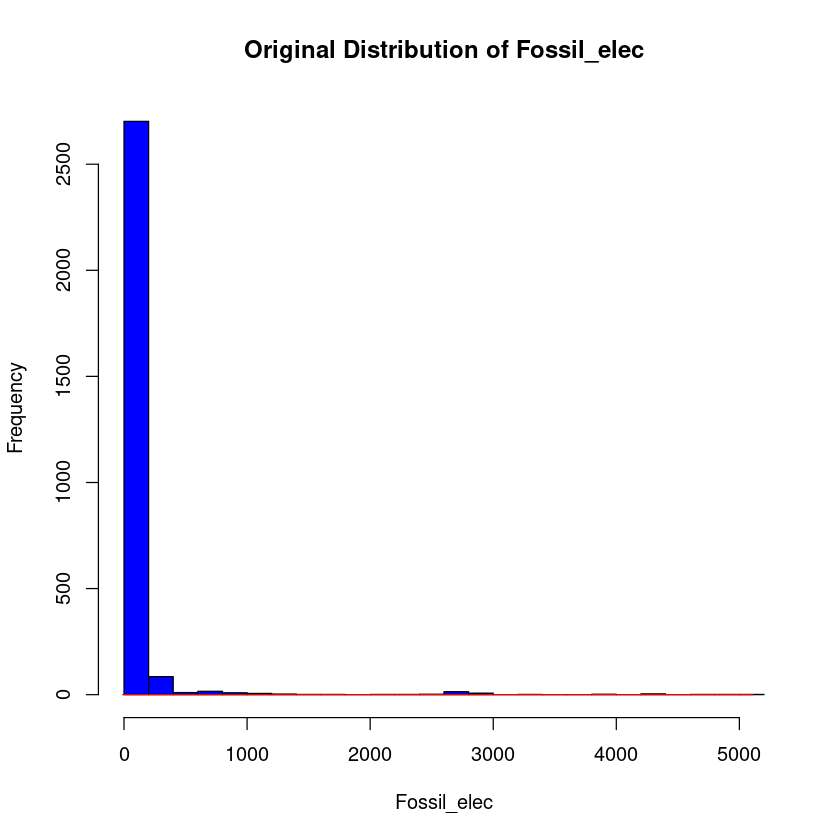

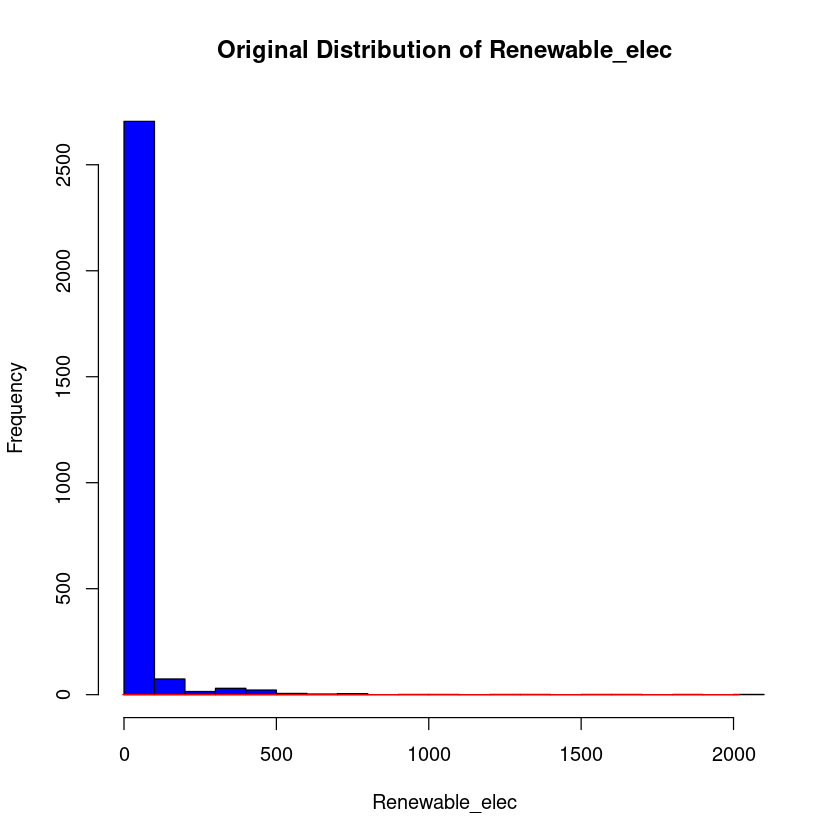

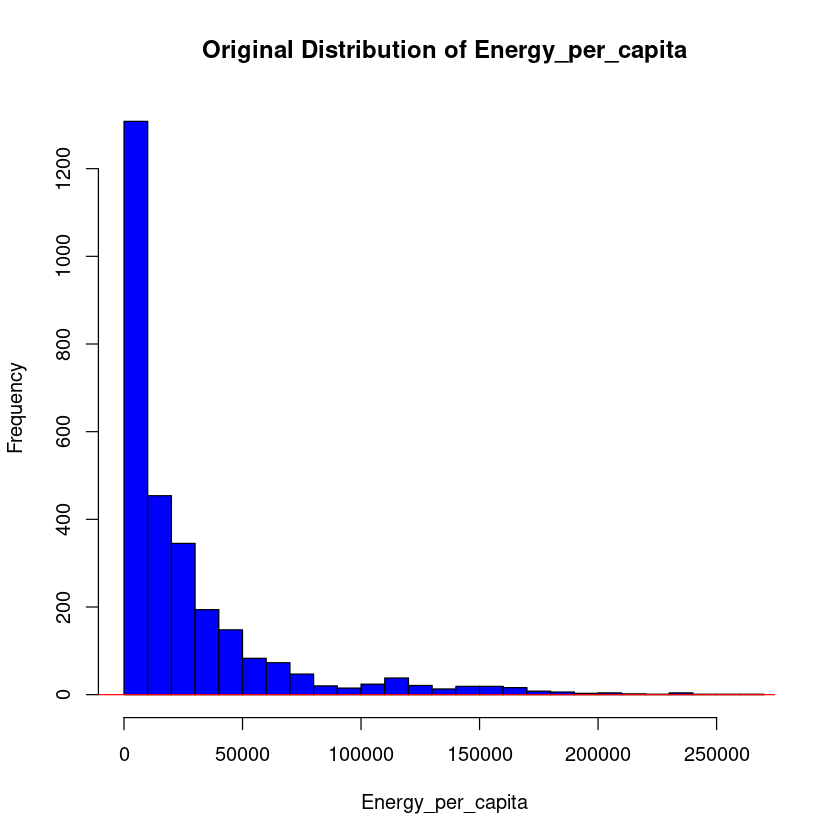

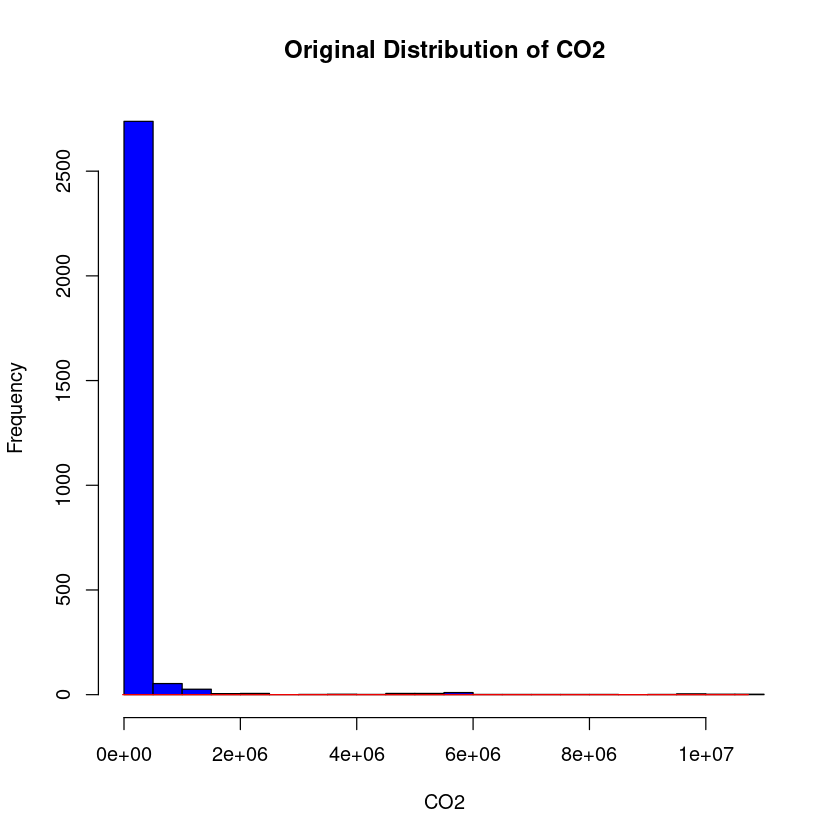

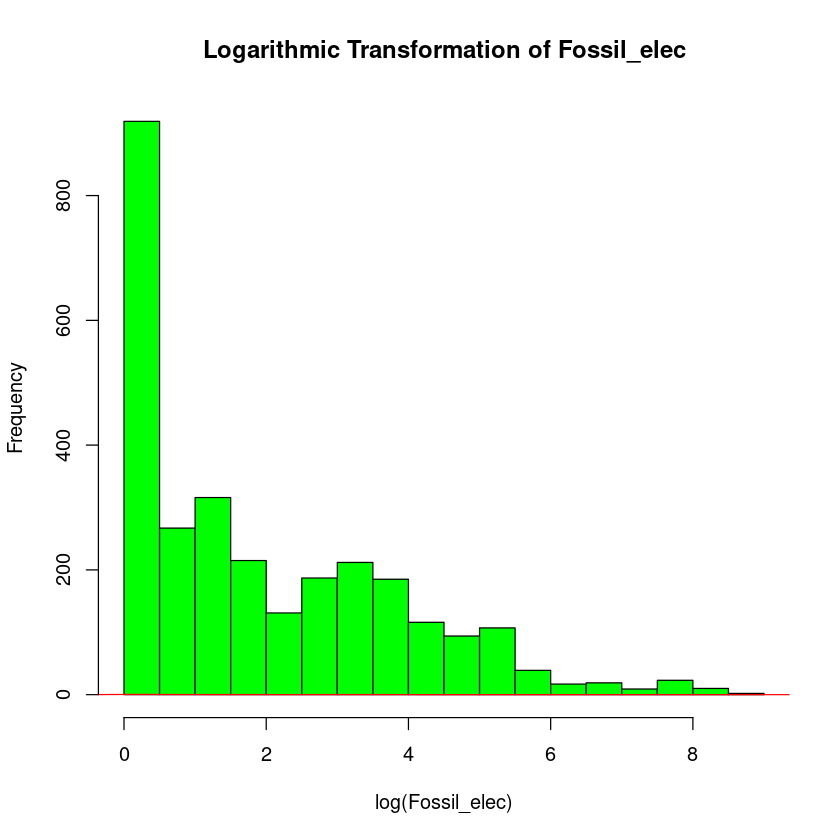

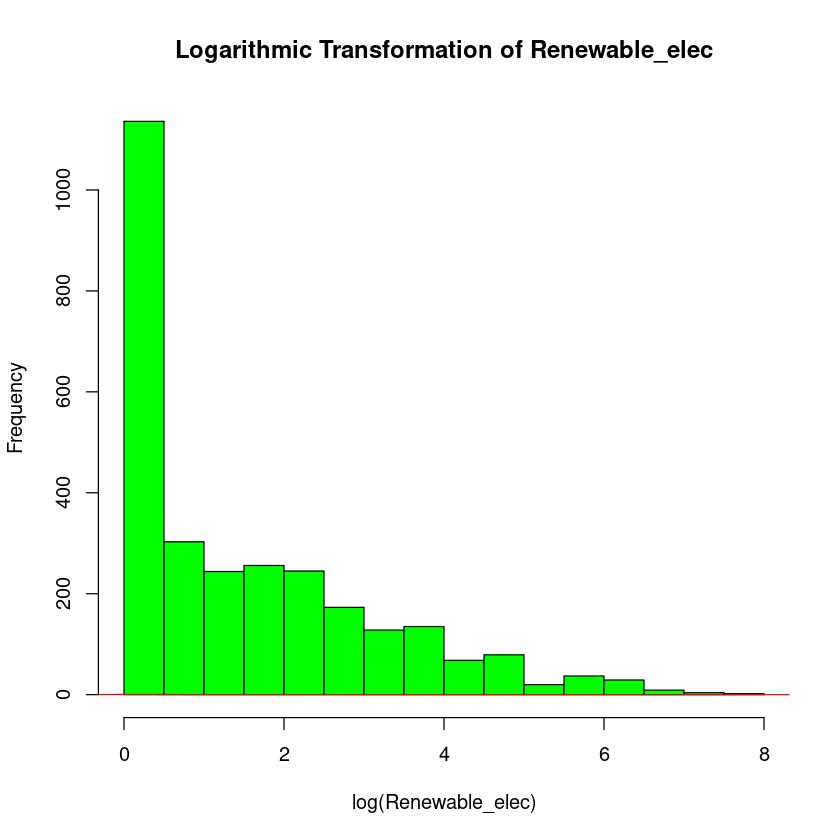

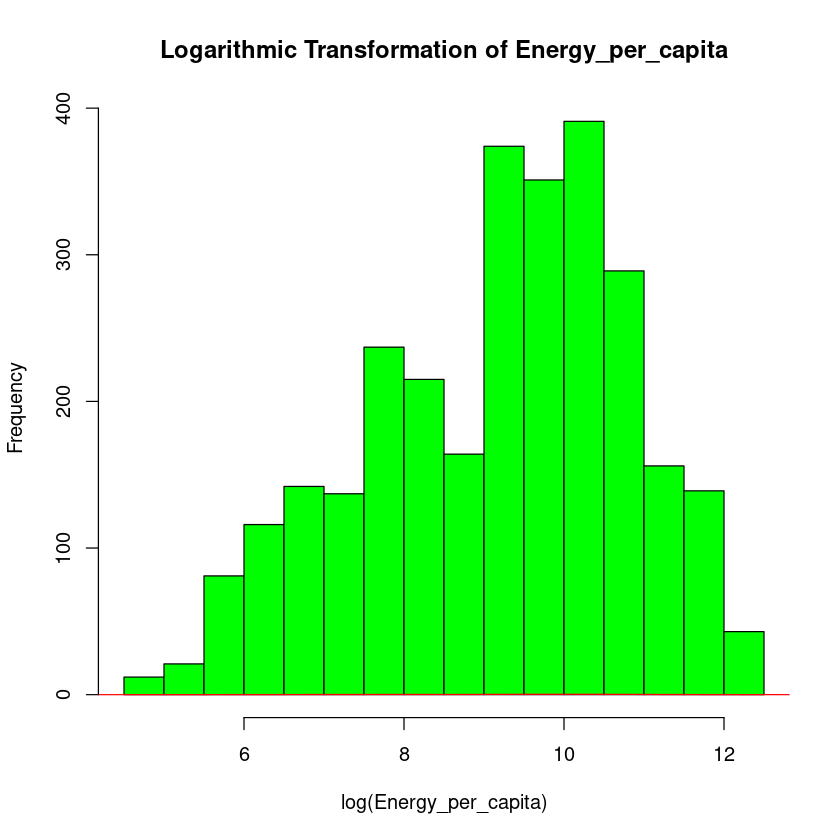

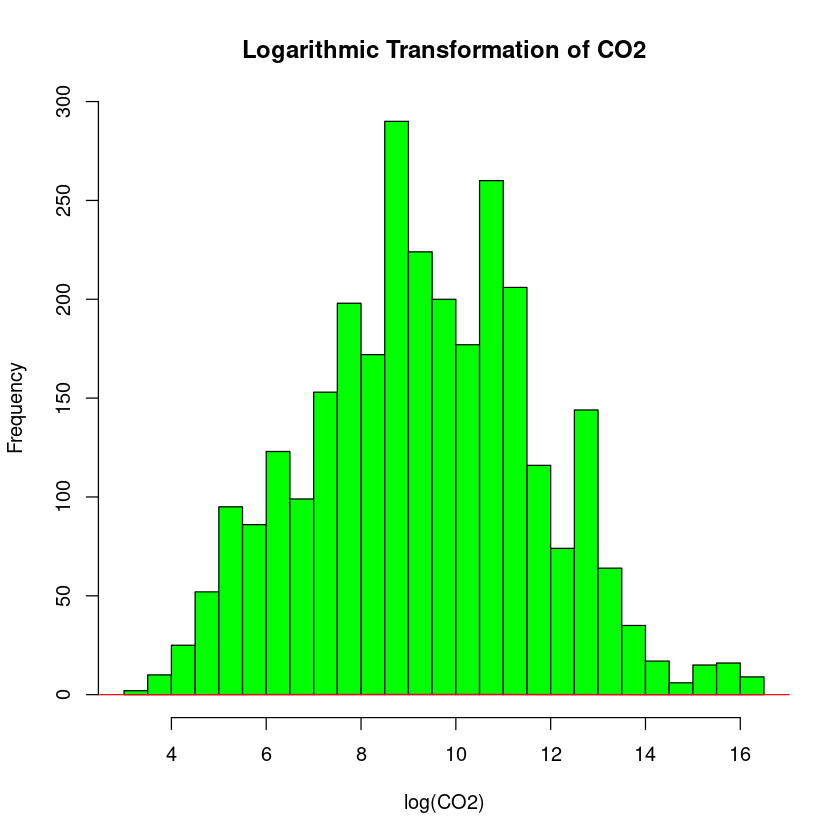

In [19]:
# Visualiser les distributions avant transformation (dans le DataFrame non modifié)
for (col in columns_to_transform) {
  hist(data_original[[col]], breaks = 20, col = "blue", border = "black", 
       main = paste("Original Distribution of", col), 
       xlab = col, ylab = "Frequency")
  lines(density(data_original[[col]]), col = "red")
}

# Visualiser les distributions après transformation (dans le DataFrame principal)
for (col in columns_to_transform) {
  new_col <- paste0("log_", col)
  hist(data[[new_col]], breaks = 20, col = "green", border = "black", 
       main = paste("Logarithmic Transformation of", col), 
       xlab = paste("log(", col, ")", sep = ""), ylab = "Frequency")
  lines(density(data[[new_col]]), col = "red")
}

Homogénéisation des distributions : Les distributions relatives à la production d'électricité issue des combustibles fossiles, à celle provenant des énergies renouvelables (exprimée en TWh), à la consommation d'énergie primaire par habitant, ainsi qu'aux émissions de CO2, se sont rapprochées d'une forme plus symétrique, s'alignant ainsi sur une distribution normale. Ce constat est cohérent à nos prévisions.

Atténuation des valeurs extrêmes : Grâce à la transformation logarithmique, l'impact des valeurs extrêmes sur les distributions a été modéré. Ceci a pour effet de rendre ces distributions moins biaisées, ce qui pourrait simplifier l'usage de méthodes statistiques et de modélisation présupposant une distribution normale des données.

Optimisation de la modélisation : Les ajustements apportés via ces transformations peuvent contribuer à améliorer l'efficacité des modèles de prévision. En effet, ils tendent à linéariser les relations entre variables et à homogénéiser la variance des résidus, deux conditions favorables à la robustesse des modèles statistiques.

Ces observations montrent l'utilité des transformations logarithmiques pour la préparation des données, notamment en vue de leur analyse statistique et de leur modélisation.

### 1.2.3 - Etude des émissions de CO2

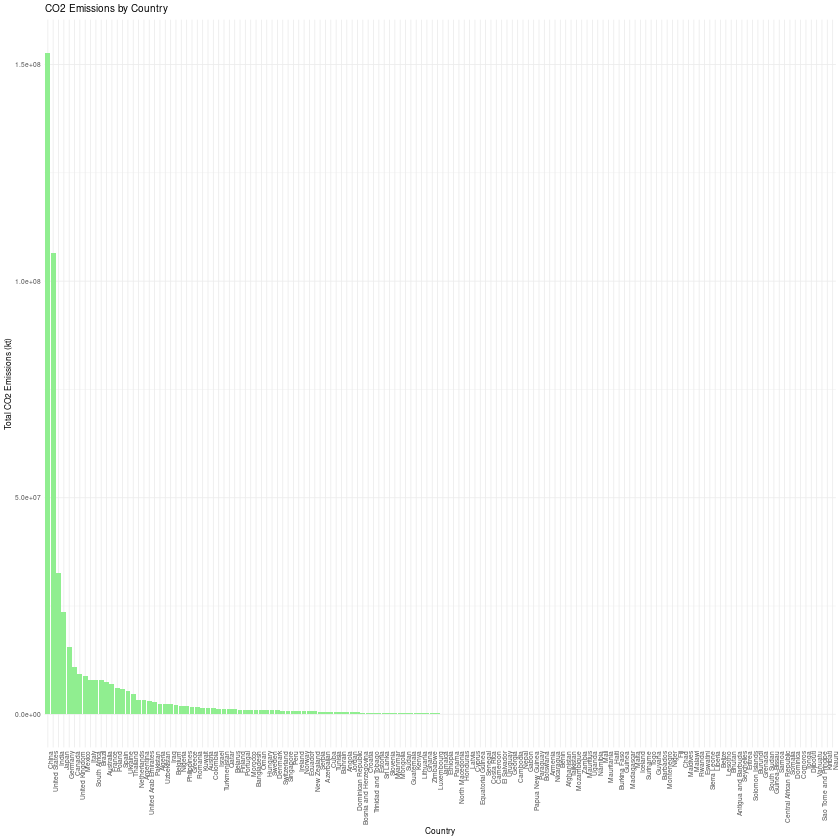

In [20]:
# Calculer les émissions de CO2 par pays
co2_emissions_by_country <- data %>%
  group_by(Entity) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE)) %>%
  arrange(desc(Total_CO2))

# Visualiser les émissions de CO2 par pays
ggplot(co2_emissions_by_country, aes(x = reorder(Entity, -Total_CO2), y = Total_CO2)) +
  geom_bar(stat = "identity", fill = "lightgreen") +
  theme_minimal(base_size = 5) +  # Pour une taille globale similaire
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "CO2 Emissions by Country",
       x = "Country",
       y = "Total CO2 Emissions (kt)")

Le graphique illustre clairement l'hétérogénéité des émissions de CO2 parmi les pays de notre jeu de données. On note une concentration très élevée des émissions parmi les premiers pays et une diminution significative à mesure que l'on avance vers les pays moins émetteurs. Cette distribution montre que quelques pays sont responsables d'une part disproportionnée des émissions globales de CO2, tandis que de nombreux autres pays contribuent relativement peu à ce total.

Aussi, on constante que certains pays ont une valeur d'émissions en CO2 nulle, pour pouvoir effectuer des calculs de ratio et autre, on distinguera pour la suite les 176 pays de notre jeu de données, parmis lesquels on compte 148 pays aux émissions non nulles.

In [21]:
# Filtrer les pays avec des émissions de CO2 supérieures à 0
co2_emissions_filtered <- co2_emissions_by_country %>%
  filter(Total_CO2 > 0)

# Trouver les émissions max et min parmi les pays restants
max_emissions <- max(co2_emissions_filtered$Total_CO2)
min_emissions <- min(co2_emissions_filtered$Total_CO2)

# Calculer le ratio
emissions_ratio <- max_emissions / min_emissions

print(paste("Ratio entre le pays le plus émetteur et le pays le moins émetteur :", emissions_ratio))


[1] "Ratio entre le pays le plus émetteur et le pays le moins émetteur : 288175.190683644"


Le ratio des émissions totales de CO2 entre le pays le plus émetteur (Chine) et le pays le moins émetteur (Kyrgyzstan) est d'environ 288 175, mettant en évidence une différence extrême dans les contributions aux émissions globales de CO2. Cela souligne la concentration très élevée des émissions parmi un petit nombre de pays.

Nous rappelons que pour ce calcul, nous avons sélectionné le pays avec la plus petite valeur d'émission de CO2, mais non nulle, parmis les 176 pays.

In [22]:
# Filtrer les pays avec des émissions de CO2 supérieures à 0 et trier par ordre croissant
sorted_emissions <- co2_emissions_by_country %>%
  filter(Total_CO2 > 0) %>%
  arrange(Total_CO2)

# Calculer la somme totale des émissions des pays aux émissions non nulles
total_co2_emissions <- sum(sorted_emissions$Total_CO2)

# Initialiser la somme cumulée des émissions et le compteur de pays
cumulative_emissions <- 0
countries_count <- 0

# Itérer sur les émissions de CO2 des pays pour calculer la somme cumulée
for (emissions in sorted_emissions$Total_CO2) {
  cumulative_emissions <- cumulative_emissions + emissions
  countries_count <- countries_count + 1
  if (cumulative_emissions / total_co2_emissions > 0.1) {
    countries_count <- countries_count - 1  # Ajuster pour ne pas compter le pays qui dépasse le seuil
    break
  }
}

# Calculer le nombre total de pays aux émissions non nulles
nbr_country <- nrow(sorted_emissions)

cat("Nombre total de pays aux émissions non nulles :", nbr_country, "\n\n")
cat("En classant les pays du moins émetteur au plus émetteur\n")
cat("Nombre de pays dont la somme des émissions représente moins de 10% des émissions totales :", countries_count)

Nombre total de pays aux émissions non nulles : 148 

En classant les pays du moins émetteur au plus émetteur
Nombre de pays dont la somme des émissions représente moins de 10% des émissions totales : 125

Nous rappelons que sur la liste des 176 pays de notre jeu de données, 148 pays ont des émissions de CO2 non nulles. Ce sont ces 148 pays que nous étudions dans cette partie.

Interprétation :

On classe les 148 pays du moins émetteur en CO2 au plus émetteur. Si on somme les émissions des 125 pays les moins émetteurs de CO2, ces émissions ne dépassent pas 10% de la valeur totale à l'échelle mondiale. On en déduite que 90% des émissions en CO2 proviennent des 23 pays les plus émetteurs d'émissions à l'échelle mondiale.

Si on ramène cela à l'ensemble des pays de notre jeu de données, on obtient que les 147 pays les moins polluants rejettent 10% des émissions de CO2 mondiales.

Nous allons maintenant étudier les 5 pays les plus émetteurs.

# A tibble: 5 × 2
  Entity         Total_CO2
  <fct>              <dbl>
1 China         152732849.
2 United States 106590771.
3 India          32679580.
4 Japan          23674690.
5 Germany        15472890.


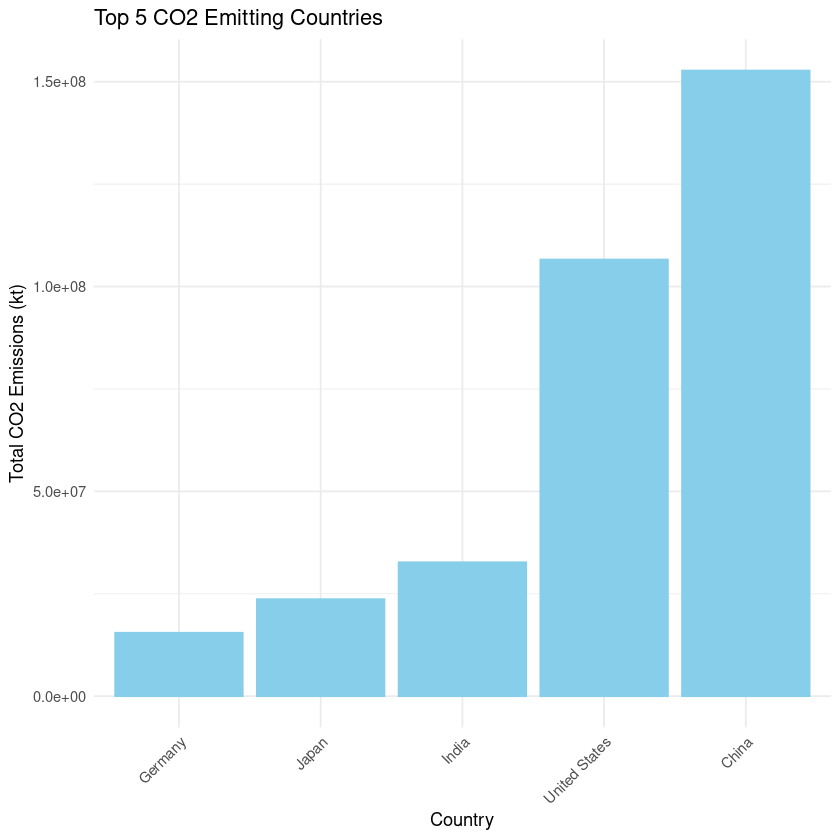

In [23]:
# Grouper les données par pays et calculer la somme totale des émissions de CO2 pour chaque pays
co2_emissions_by_country <- data %>%
  group_by(Entity) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE)) %>%
  arrange(desc(Total_CO2))

# Sélectionner les 5 pays les plus émetteurs de CO2
top_5_co2_emitters <- head(co2_emissions_by_country, 5)

# Visualisation des 5 plus grands émetteurs de CO2
ggplot(top_5_co2_emitters, aes(x = reorder(Entity, Total_CO2), y = Total_CO2, fill = Entity)) +
  geom_bar(stat = "identity", color = "skyblue", fill = "skyblue") +
  theme_minimal() +
  labs(title = "Top 5 CO2 Emitting Countries", x = "Country", y = "Total CO2 Emissions (kt)") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Afficher les noms et les valeurs des 5 plus grands émetteurs de CO2
print(top_5_co2_emitters)

In [24]:
# Calculer la somme des émissions des 5 pays les plus émetteurs
sum_top_5_co2_emitters <- sum(top_5_co2_emitters$Total_CO2)

cat("Somme des émissions des 5 pays les plus émetteurs :", sum_top_5_co2_emitters, "\n\n")

# Calculer le pourcentage que représente la somme des émissions des 5 pays les plus émetteurs par rapport aux émissions totales
total_co2_emissions <- sum(co2_emissions_by_country$Total_CO2)
percentage_top_5_co2_emitters <- (sum_top_5_co2_emitters / total_co2_emissions) * 100

cat("Pourcentage des émissions des 5 pays les plus polluants :", percentage_top_5_co2_emitters, "%")

Somme des émissions des 5 pays les plus émetteurs : 331150780 

Pourcentage des émissions des 5 pays les plus polluants : 68.39547 %

La visualisation montre clairement l'hétérogénéité des émissions de CO2 entre les pays, avec les 5 pays les plus émetteurs de CO2 étant :

* Chine avec environ 152 732 800 kt de CO2 émis.
* États-Unis avec environ 106 590 800 kt de CO2 émis.
* Inde avec environ 32 679 580 kt de CO2 émis.
* Japon avec environ 23 674 690 kt de CO2 émis.
* Allemagne avec environ 15 472 890 kt de CO2 émis.

Ces résultats mettent en évidence la grande disparité des contributions aux émissions de CO2 à l'échelle mondiale, avec la Chine et les États-Unis se distinguant nettement comme les plus grands émetteurs. Au total, les émissions des 5 pays les plus polluants représentent 331 150 779 kt de CO2 émis, c'est à dire 68% des émissions totales.

In [25]:
# Carte des émissions de CO2 par pays
co2_emissions_by_country <- data %>%
  group_by(Entity, Area, Density) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE), .groups = "drop") %>%
  arrange(Entity)

# Tracé de la carte avec Plotly
fig <- plot_ly(data = co2_emissions_by_country, type = "choropleth", locations = ~Entity, locationmode = "country names", z = ~Total_CO2,
               text = ~paste("Pays: ", Entity, "<br>CO2 émis: ", Total_CO2),
               colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Carte des émissions de CO2 par pays", geo = list(showcountries = TRUE, countrycolor = "rgb(255, 255, 255)"))

fig

HTML widgets cannot be represented in plain text (need html)

On veut maintenant ramener ces chiffres par rapport à la surface et à la densité de population par pays


In [26]:
# Filtrer les données pour chaque pays

df_chn <- filter(data, Entity == 'China')
df_usa <- filter(data, Entity == 'United States')
df_ind <- filter(data, Entity == 'India')
df_jpn <- filter(data, Entity == 'Japan')
df_ger <- filter(data, Entity == 'Germany')

# Chine
df_chn$Density <- as.numeric(as.character(df_chn$Density))
df_chn$Area <- as.numeric(as.character(df_chn$Area))

# États-Unis
df_usa$Density <- as.numeric(as.character(df_usa$Density))
df_usa$Area <- as.numeric(as.character(df_usa$Area))

# Inde
df_ind$Density <- as.numeric(as.character(df_ind$Density))
df_ind$Area <- as.numeric(as.character(df_ind$Area))

# Japon
df_jpn$Density <- as.numeric(as.character(df_jpn$Density))
df_jpn$Area <- as.numeric(as.character(df_jpn$Area))

# Allemagne
df_ger$Density <- as.numeric(as.character(df_ger$Density))
df_ger$Area <- as.numeric(as.character(df_ger$Area))

# Extraire les émissions de CO2 pour chaque pays en utilisant le filtrage
co2_chn <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'China']/(df_chn$Density[1]*df_chn$Area[1])
co2_usa <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'United States']/(df_usa$Density[1]*df_usa$Area[1])
co2_ind <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'India']/(df_ind$Density[1]*df_ind$Area[1])
co2_jpn <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'Japan']/(df_jpn$Density[1]*df_jpn$Area[1])
co2_ger <- top_5_co2_emitters$Total_CO2[top_5_co2_emitters$Entity == 'Germany']/(df_ger$Density[1]*df_ger$Area[1])

# Affichage des résultats
cat("Emissions par habitant en Chine :", co2_chn, "\n")
cat("Emissions par habitant aux Etats-Unis :", co2_usa, "\n")
cat("Emissions par habitant en Inde :", co2_ind, "\n")
cat("Emissions par habitant au Japon :", co2_jpn, "\n")
cat("Emissions par habitant en Allemagne :", co2_ger, "\n")

Emissions par habitant en Chine : 0.1040177 
Emissions par habitant aux Etats-Unis : 0.3010982 
Emissions par habitant en Inde : 0.02142516 
Emissions par habitant au Japon : 0.1805208 
Emissions par habitant en Allemagne : 0.1805782 


In [27]:
co2_emissions_by_country <- data %>%
  group_by(Entity, Area, Density) %>%
  summarise(Total_CO2 = sum(CO2, na.rm = TRUE), .groups = "drop") %>%
  arrange(Entity)

# Tracé de la carte avec Plotly
fig <- plot_ly(data = co2_emissions_by_country, type = "choropleth", locations = ~Entity, locationmode = "country names", z = ~Total_CO2/(Area*Density),
               text = ~paste("Pays: ", Entity, "<br>CO2 émis: ", Total_CO2),
               colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Carte des émissions de CO2 par pays par habitants", geo = list(showcountries = TRUE, countrycolor = "rgb(255, 255, 255)"))

fig


HTML widgets cannot be represented in plain text (need html)

On observe que, parmis les 5 pays les plus polluants, le classement est remanié une fois les émissions ramenées à la population. Les Etats-Unis sont le pays avec les émissions par habitant les plus importantes. A l'inverse, l'Inde présente une population très importante, ce qui en fait un pays très polluant. Cependant, ses habitants ont des émissions 15 fois moins importantes que les Américains.

Sur la deuxième carte mondiale, on observe que les Etats-Unis, le Canada et l'Australie se distinguent nettement en terme d'émissions de CO2 par habitant. Comme nous avons vu dans les calculs de la cellule précédente, l'Inde a une valeur d'émissions de CO2 par habitant moins importante. Cela peut s'expliquer par le mode de vie moins polluant de sa population. Cependant, compte tenu de sa densité très importante, cela fait de l'Inde un pays polluant à l'échelle nationale. Enfin, bien que l'Allemagne soit un petit pays en terme de superficie et avec une densité raisonnable, l'utilisation d'énergies fossiles dans son mix énergétique en fait un des pays assez polluants en terme d'émissions de CO2 par habitant.

## 1.3 - Analyse descriptive multidimensionnelle des données

### 1.3.1 - Première visualisation globale

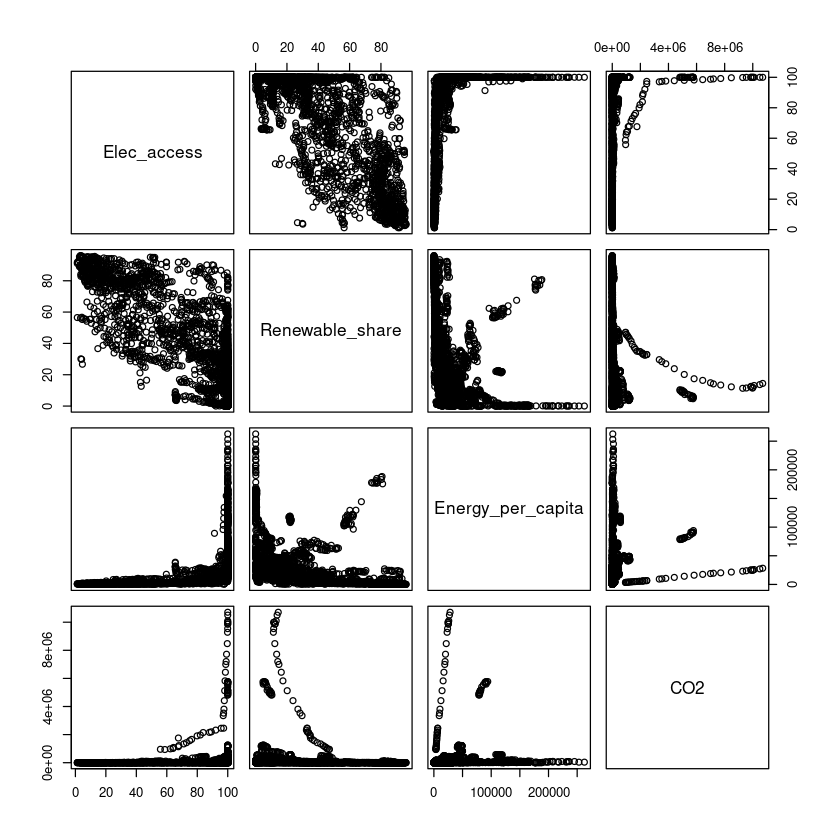

In [28]:
# Sélection de quelques variables clés pour l'analyse
variables_to_analyze <- data %>%
  select(Elec_access, Renewable_share, Energy_per_capita, CO2)

# Création de pairplot pour chaque paire de variable
pairs(variables_to_analyze)

Les graphiques de dispersion analysés révèlent les dynamiques entre quatre variables cruciales de notre ensemble de données : l'accès à l'électricité, la proportion d'énergie renouvelable dans la consommation énergétique finale, la consommation d'énergie primaire par individu, et les émissions de CO2 totales par pays.

Accès à l'électricité par rapport aux autres indicateurs : Une corrélation semble se dessiner, montrant une hausse des émissions de CO2 et de la consommation d'énergie primaire par personne à mesure que l'accès à l'électricité s'élargit. Cela peut suggérer que les pays plus avancées, bénéficiant d'un accès étendu à l'électricité, affichent également une consommation énergétique et des émissions de CO2 plus élevées.

Influence de l'énergie renouvelable sur les émissions de CO2 : Aucune corrélation évidente n'émerge de l'analyse visuelle. Il apparaît que la contribution des énergies renouvelables à la consommation énergétique totale n'est pas directement liée aux émissions de CO2 à l'échelle nationale. Cette observation suggère l'impact potentiel d'autres variables, comme l'efficacité de l'utilisation énergétique, la diversité des sources d'énergie, ou encore l'ampleur de l'activité économique, sur les émissions de CO2.

Consommation d'énergie primaire par individu face aux émissions de CO2 : Un lien positif est observé, indiquant que les pays où la consommation d'énergie primaire par tête est plus importante affichent généralement des niveaux d'émissions de CO2 supérieurs. Cette relation est attendue et peut refléter une intensité économique accrue et une prédominance des combustibles fossiles dans le mix énergétique de ces pays.

Ces interprétations mettent en lumière les interactions entre développement énergétique, utilisation de sources renouvelables, et impact environnemental à travers les émissions de CO2. Elles soulignent l'importance d'approfondir l'analyse pour comprendre les multiples facteurs influençant ces relations et envisager des stratégies d'atténuation des émissions de CO2 tout en promouvant un accès élargi à l'énergie.

In [29]:
library(FactoMineR)
library(factoextra)
library(corrplot)

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa

corrplot 0.92 loaded



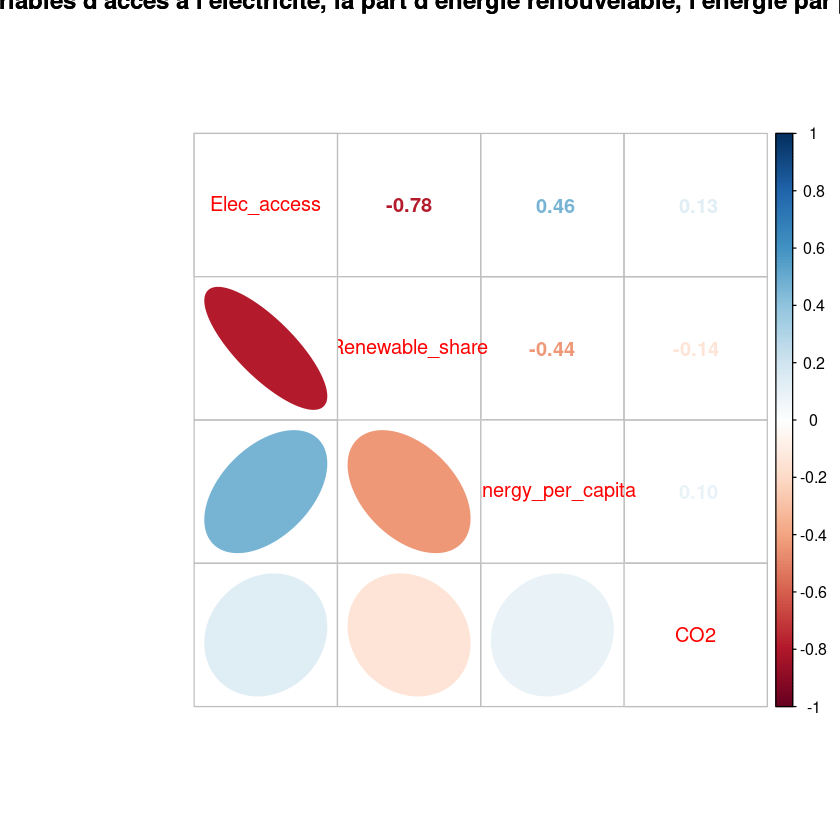

In [30]:
correlation_matrix = cor(variables_to_analyze)

#corrplot(correlation_matrix, method='number', type='upper',title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelable, l'énergie par personne et les émissions de CO2")
corrplot.mixed(correlation_matrix, lower='ellipse', upper='number',title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelable, l'énergie par personne et les émissions de CO2")

La matrice de corrélation ci-dessus montre les coefficients de corrélation entre les variables.

Accès à l'électricité : Cette variable ne montre pas de corrélation forte avec les émissions de CO2 ou la part de l'énergie renouvelable, ce qui suggère que l'accès universel à l'électricité peut être atteint indépendamment des niveaux d'émissions de CO2 ou de la part des énergies renouvelables, et ce qui paraît cohérent.

Part de l'énergie renouvelable : La corrélation entre la part de l'énergie renouvelable dans la consommation finale d'énergie et les émissions de CO2 est faible, indiquant que l'augmentation de la part des énergies renouvelables n'est pas directement liée à une réduction des émissions de CO2 au niveau des données analysées. Cela pourrait refléter le fait que d'autres facteurs, tels que l'efficacité énergétique et le mix énergétique global, affectent également les émissions.

Consommation d'énergie primaire par habitant : Il existe une corrélation positive modérée avec les émissions de CO2, ce qui est cohérent avec l'idée que des niveaux de consommation d'énergie plus élevés sont associés à des émissions plus importantes. Cette relation souligne l'importance de l'efficacité énergétique et de la transition vers des sources d'énergie moins carbonées pour réduire les émissions.

Ces résultats montrent les relations entre l'accès à l'électricité, la part des énergies renouvelables, la consommation d'énergie et les émissions de CO2. Ils suggèrent que, bien que l'augmentation de la part des énergies renouvelables soit importante pour un avenir durable, des efforts supplémentaires en matière d'efficacité énergétique et de réduction de la consommation d'énergie sont nécessaires pour atteindre une réduction significative des émissions de CO2.

Nous allons vérifier cette hypothèse en étudiant les corrélations entre d'autres variables.

### 1.3.2 - Etude de la corrélation entre les énergies fossiles et les émissions de CO2

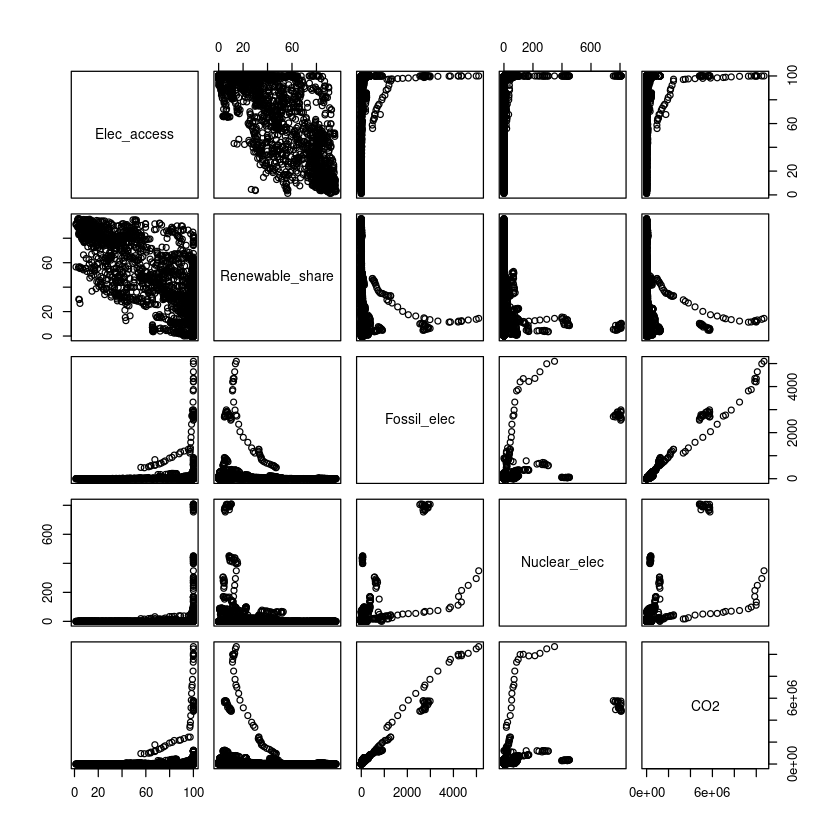

In [31]:
# Sélection de quelques variables clés pour l'analyse
variables_to_analyze_2 <- data %>%
  select(Elec_access, Renewable_share, Fossil_elec, Nuclear_elec, CO2)

pairs(variables_to_analyze_2)

Ces observations mettent en évidence les interrelations complexes entre l'accès à l'électricité, les choix énergétiques des pays, et leurs impacts sur les émissions de CO2. Une stratégie globale pour réduire les émissions de CO2 devra probablement prendre en compte ces différents aspects pour être efficace.

Accès à l'électricité : Les pays bénéficiant d'un accès élargi à l'électricité affichent souvent une consommation accrue d'énergie, notamment d'origine fossile et nucléaire, accompagnée de niveaux supérieurs d'émissions de CO2. Cette tendance souligne la corrélation entre le développement économique et l'intensification de la consommation énergétique.

Influence des énergies renouvelables : La proportion des énergies renouvelables dans le mix énergétique varie considérablement d'un pays à l'autre, sans montrer de corrélation directe avec la consommation d'énergies fossiles ou nucléaires ni avec les émissions de CO2. Cela suggère que les pays déploient des stratégies énergétiques variées, reflétant peut-être des priorités ou des contraintes environnementales et économiques différentes.

Production d'électricité à partir de combustibles fossiles : Une corrélation positive est observée entre la production d'électricité issue de combustibles fossiles et les niveaux d'émissions de CO2. Cet état de fait est logique, la combustion de combustibles fossiles étant une importante source d'émissions de CO2.

Production d'électricité nucléaire : Bien que certains pays disposent d'une capacité notable de production d'électricité nucléaire, cette dernière ne paraît pas liée de manière directe à une réduction ou une augmentation des émissions de CO2. L'énergie nucléaire, ne générant pas de CO2 lors de la production d'électricité, les variations observées dans les émissions des pays pourraient être attribuées à d'autres aspects de leur mix énergétique ou de leur activité économique.

Émissions de CO2 : Les émissions plus conséquentes de CO2 sont généralement associées à une utilisation élevée d'énergie, qu'elle provienne de sources fossiles ou nucléaires. Ceci met en lumière l'importance de considérer à la fois l'efficacité énergétique et la diversification des sources d'énergie dans les stratégies visant à réduire les émissions de gaz à effet de serre.

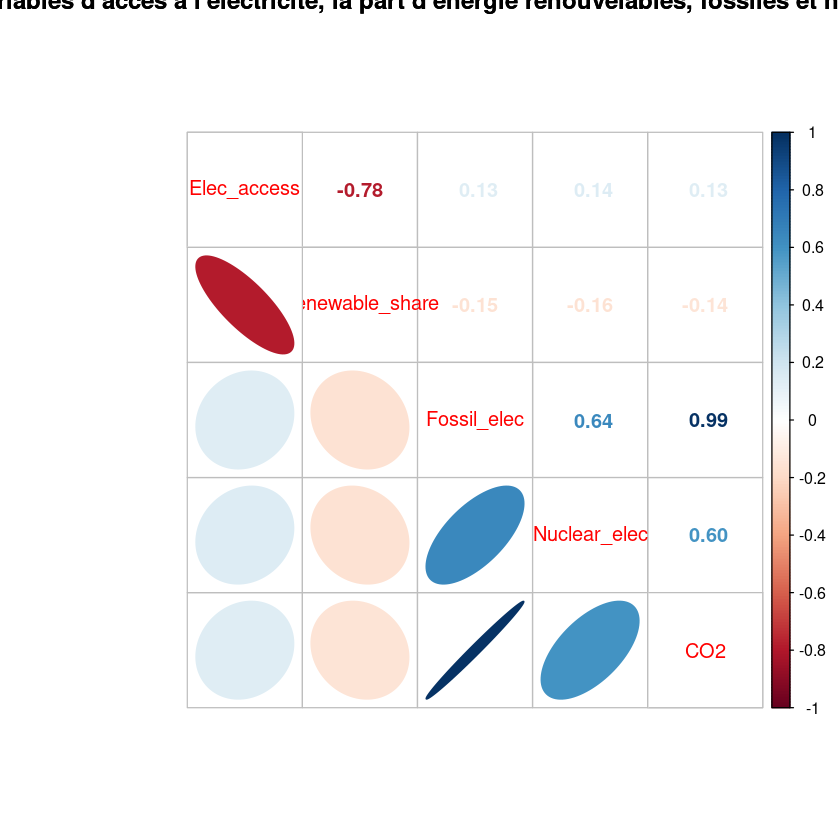

In [32]:
correlation_matrix = cor(variables_to_analyze_2)

#corrplot(correlation_matrix, method='number', type='upper',title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelables, fossiles et nucléaires et les émissions de CO2 ")
corrplot.mixed(correlation_matrix, lower='ellipse', upper='number',,title = "Matrice de corrélation entre les variables d'accès à l'électricité, la part d'énergie renouvelables, fossiles et nucléaires et les émissions de CO2 ")

La matrice de corrélation montre les relations entre l'accès à l'électricité, la part des énergies renouvelables, et l'utilisation d'énergie fossile et nucléaire avec les émissions de CO2. On observe :

Relation entre l'accès à l'électricité et les énergies renouvelables : Une corrélation négative prononcée indique que les pays ayant un accès généralisé à l'électricité tendent à présenter une part moindre d'énergies renouvelables dans leur mix énergétique. Cette observation suggère que les nations largement électrifiées pourraient s'appuyer davantage sur des sources d'énergie non renouvelables.

Lien entre la consommation d'énergie fossile et les émissions de CO2 : Une corrélation très marquée révèle que l'augmentation de la consommation d'énergie fossile est directement liée à une hausse des émissions de CO2. Cette forte corrélation souligne le rôle critique de l'énergie fossile dans le bilan carbone, indépendamment des autres composantes du mix énergétique.

Corrélation entre les énergies renouvelables et les émissions de CO2 : Une légère corrélation négative entre ces deux variables peut suggérer que l'accroissement de la part des énergies renouvelables n'entraîne pas automatiquement une réduction proportionnelle des émissions de CO2 au niveau global. Cela pourrait refléter l'usage simultané de combustibles fossiles même dans les contextes où les énergies renouvelables sont promues.

Cette matrice des corrélations souligne le rôle majeur et prépondérant des combustibles fossiles dans les émissions de CO2 et suggère que les politiques en faveur des énergies renouvelables pourraient ne pas avoir un impact immédiat sur les émissions de CO2 sans autres changements dans le mix énergétique et l'efficacité énergétique.

De plus, cette analyse confirme les hypothèses émises dans la première visualisation globale.

### 1.3.3 - Etude de l'influence économique et démographique

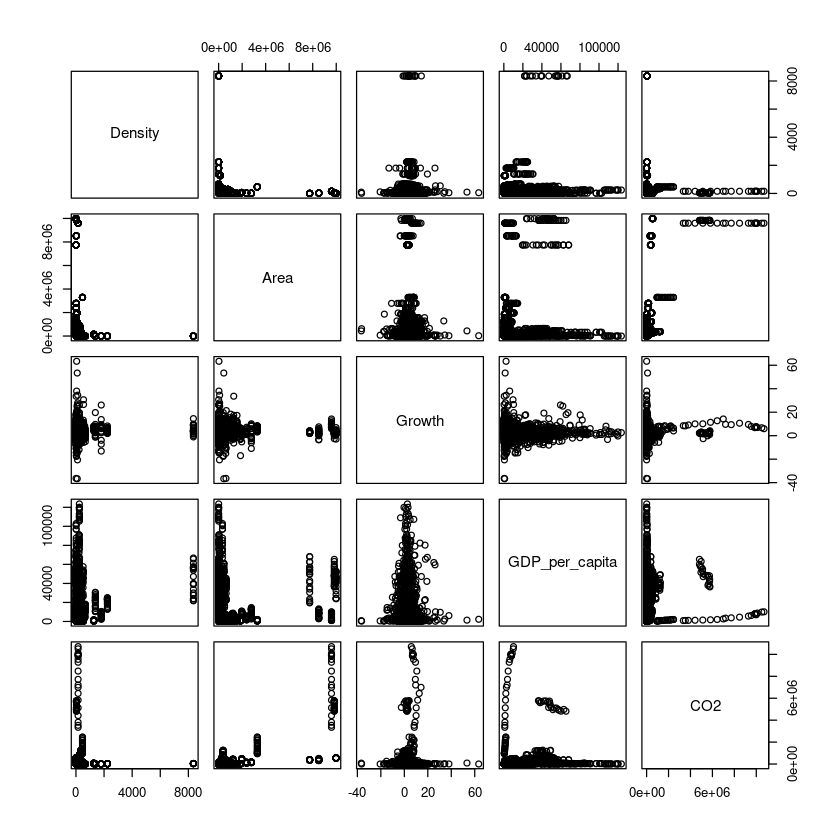

In [33]:
# Sélection de quelques variables clés pour l'analyse
variables_to_analyze_3 <- data %>%
  select(Density,Area,Growth,GDP_per_capita,CO2)

pairs(variables_to_analyze_3)

Interprétation :

Densité de population (Density) : Il n'y a pas de tendance claire indiquant une relation directe entre la densité de population et les autres variables. Il y a cependant quelques valeurs extrêmes, ce qui indique que certains pays ou régions ont des densités de population très élevées.

Superficie (Area) : La superficie ne semble pas être directement liée à la croissance économique (Growth), au PIB par habitant (GDP_per_capita), ou aux émissions de CO2. Les données semblent être assez dispersées, ce qui suggère que la taille d'un pays n'est pas un facteur déterminant pour ces indicateurs.

Croissance économique (Growth) : La croissance économique présente une variabilité importante parmi les pays, sans une relation évidente avec le PIB par habitant ou les émissions de CO2.

PIB par habitant (GDP_per_capita) : Le PIB par habitant montre un certain regroupement vers les valeurs inférieures, avec quelques valeurs extrêmes indiquant que certains pays ont un PIB par habitant beaucoup plus élevé. Il y a également une dispersion des points lorsque le PIB par habitant est comparé aux émissions de CO2, suggérant que la richesse d'un pays ne se traduit pas toujours par des émissions de CO2 proportionnellement plus élevées.

Émissions de CO2 (CO2) : Les émissions de CO2 sont concentrées vers les valeurs inférieures avec quelques valeurs extrêmes, indiquant que quelques pays sont responsables d'une part disproportionnée des émissions globales de CO2. Il n'y a pas de relation claire et linéaire visible entre les émissions de CO2 et les autres variables dans ces scatter plots.

En conclusion, ces visualisations illustrent les relations entre les indicateurs démographiques, économiques et environnementaux. Les données suggèrent que des facteurs autres que la densité de population, la taille du pays, et la richesse économique influencent les émissions de CO2. Ces résultats peuvent servir de point de départ pour des analyses statistiques plus poussées et la modélisation prédictive.

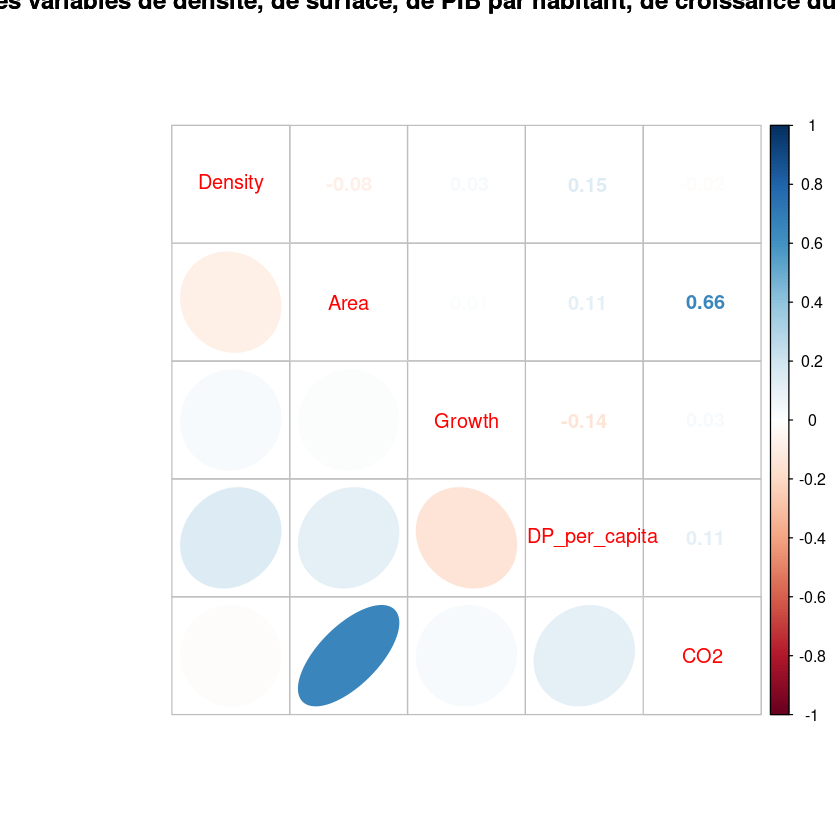

In [34]:
correlation_matrix = cor(variables_to_analyze_3)

#corrplot(correlation_matrix, method='number', type='upper',title = "Matrice de corrélation entre les variables de densité, de surface, de PIB par habitant, de croissance du PIB et les émissions de CO2 ")
corrplot.mixed(correlation_matrix, lower='ellipse', upper='number',title = "Matrice de corrélation entre les variables de densité, de surface, de PIB par habitant, de croissance du PIB et les émissions de CO2 ")


La matrice de corrélation indique les relations entre la densité de population, la superficie du pays, le PIB par habitant, la croissance du PIB et les émissions de CO2 :

Densité vs. Superficie : Une corrélation négative (-0.15) suggère que les pays de plus grande superficie ont tendance à avoir une densité de population plus faible. Ce qui est cohérent.

Densité vs. Émissions de CO2 : Une corrélation très faible (0.04) indique qu'il n'y a pas de lien direct entre la densité de la population et les émissions de CO2.

Superficie vs. Émissions de CO2 : Une corrélation modérée (0.66) suggère que les pays avec de plus grandes superficies ont tendance à avoir des émissions de CO2 plus élevées, ce qui pourrait refléter une activité économique et industrielle plus importante ou une plus grande utilisation de véhicules et d'énergie.

Croissance du PIB vs. PIB par habitant : Une corrélation négative (-0.14) montre qu'une croissance économique plus élevée n'est pas nécessairement associée à un PIB par habitant plus élevé, ce qui peut se produire dans les économies en développement.

PIB par habitant vs. Émissions de CO2 : Une corrélation positive faible (0.11) indique que les pays plus riches pourraient avoir légèrement plus d'émissions de CO2, mais la relation n'est pas forte, ce qui implique que la richesse n'est pas un prédicteur direct des émissions de CO2.

Superficie vs. PIB par habitant : Une corrélation positive faible (0.11) indique que les pays plus grands ont tendance à avoir un PIB par habitant légèrement plus élevé.

En résumé, cette matrice montre que si certaines variables ont une relation modérée, beaucoup n'ont qu'une faible ou pas de corrélation directe. Cela suggère que des facteurs supplémentaires pourraient influencer ces relations et confirme les observations précédentes.

## 1.4 - Analyse en Composantes Principales (ACP)

Dans cette partie, nous allons procéder à une Analyse en Composantes Principales (ACP). L'objectif de cette méthode est de synthétiser les variables du jeu de donbnées initial en un nombre limité de composantes principales, tout en conservant un maximun d'informations. Initialement, nous avons 18 variables après traitement, qui correspondent aux 18 caractéristiques. Nous allons étudier s'il est possible de réduire cette dimension, tout en conservant un maximum d'information.

### 1.4.1 - Reformatage des données

In [35]:
data_quanti <- data[,3:18]
head(data_quanti)

,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
4,14.73851,9.50,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,20.06497,10.90,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,25.39089,12.20,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995
7,30.71869,13.85,31.89,0.20,0,0.64,76.19048,304.4209,1.50,1760,5.357403,263.7336,60,652230,33.93911,67.70995
8,36.05101,15.30,28.78,0.20,0,0.75,78.94737,354.2799,1.53,1770,13.826320,359.6932,60,652230,33.93911,67.70995
9,42.40000,16.70,21.17,0.19,0,0.54,73.97260,607.8335,1.94,3560,3.924984,364.6635,60,652230,33.93911,67.70995


L'ACP est sensible à la variabilité des données. Si les variables sont mesurées dans des unités différentes ou ont des variances différentes, celles avec une plus grande variance ou des unités plus grandes pourraient dominer les premières composantes principales. En centrant et réduisant, chaque variable contribue également à l'analyse sans être influencée par l'échelle de mesure. Nous décidons donc de centrer et réduire nos données avant de réaliser notre ACP.

In [36]:
# Centrer et réduire les données
data_quanti_scaled <- scale(data_quanti)

# Convertir de nouveau en DataFrame pour garder le format DataFrame
# et préserver les noms de colonnes originaux
data_quanti_scaled <- as.data.frame(data_quanti_scaled)
colnames(data_quanti_scaled) <- colnames(data_quanti)

# Afficher les premières lignes pour vérifier
head(data_quanti_scaled)

,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,-1.962723,-1.342305,0.02857477,-0.2040051,-0.1946913,-0.2412979,0.7950071,-0.6968803,-1.1231884,-0.2048827,1.062712614,-0.6612948,-0.2265952,-0.003481871,0.6338505,0.8359896
5,-1.793684,-1.306625,0.28103946,-0.2039517,-0.1946913,-0.2419482,0.6760129,-0.6975741,-1.1790947,-0.2051150,-0.534097141,-0.6601898,-0.2265952,-0.003481871,0.6338505,0.8359896
6,-1.624663,-1.273495,-0.06401782,-0.2039250,-0.1946913,-0.2416695,0.6910908,-0.6962846,-1.1203931,-0.2044793,1.578777364,-0.6585534,-0.2265952,-0.003481871,0.6338505,0.8359896
7,-1.455582,-1.231444,-0.13029813,-0.2042989,-0.1946913,-0.2412050,1.0611289,-0.6948734,-1.0952353,-0.2042226,0.314722045,-0.6573948,-0.2265952,-0.003481871,0.6338505,0.8359896
8,-1.286358,-1.194491,-0.23388193,-0.2042989,-0.1946913,-0.2401831,1.1411435,-0.6935294,-1.0868493,-0.2042104,2.137714332,-0.6522716,-0.2265952,-0.003481871,0.6338505,0.8359896
9,-1.084869,-1.158812,-0.48734583,-0.2043256,-0.1946913,-0.2421340,0.9967585,-0.6866946,-0.9722414,-0.2020222,0.006383943,-0.6520062,-0.2265952,-0.003481871,0.6338505,0.8359896


### 1.4.2 - Analyse en composantes principales (ACP)

In [37]:
library(ggpubr)

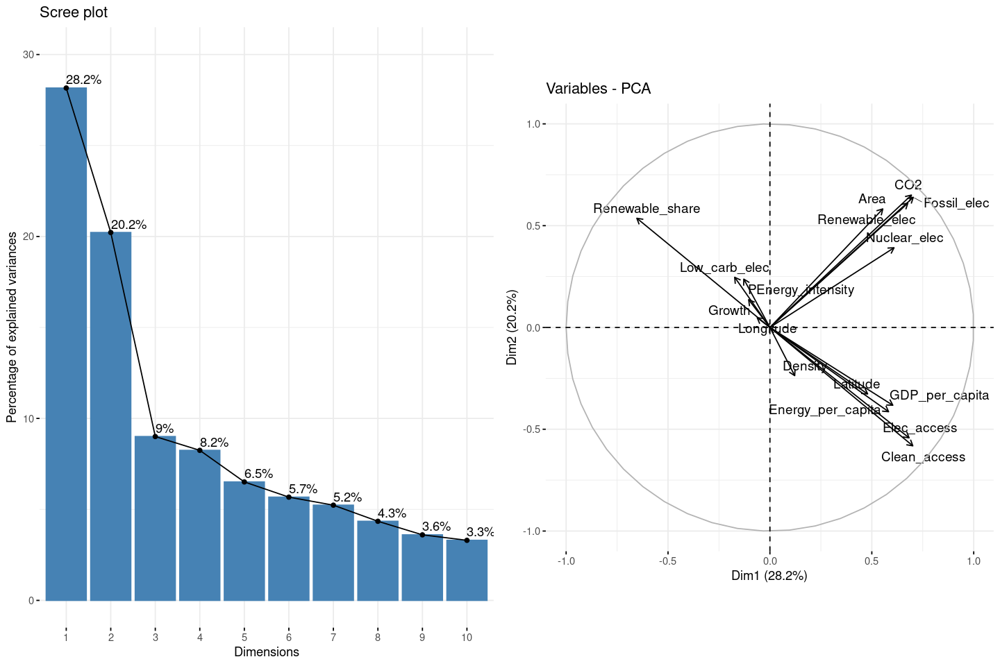

In [38]:
options(repr.plot.width = 12, repr.plot.height = 8)

pca = PCA(data_quanti_scaled, ncp=10, scale.unit = TRUE, graph=FALSE)

# Visualisation de la variance expliquée et des variables
p1 <- fviz_eig(pca, addlabels = TRUE, ylim = c(0, 30))
p2 <- fviz_pca_var(pca, axes = c(1,2), repel = TRUE)

# Arrangement des graphiques
grid.arrange(p1, p2, ncol = 2)

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


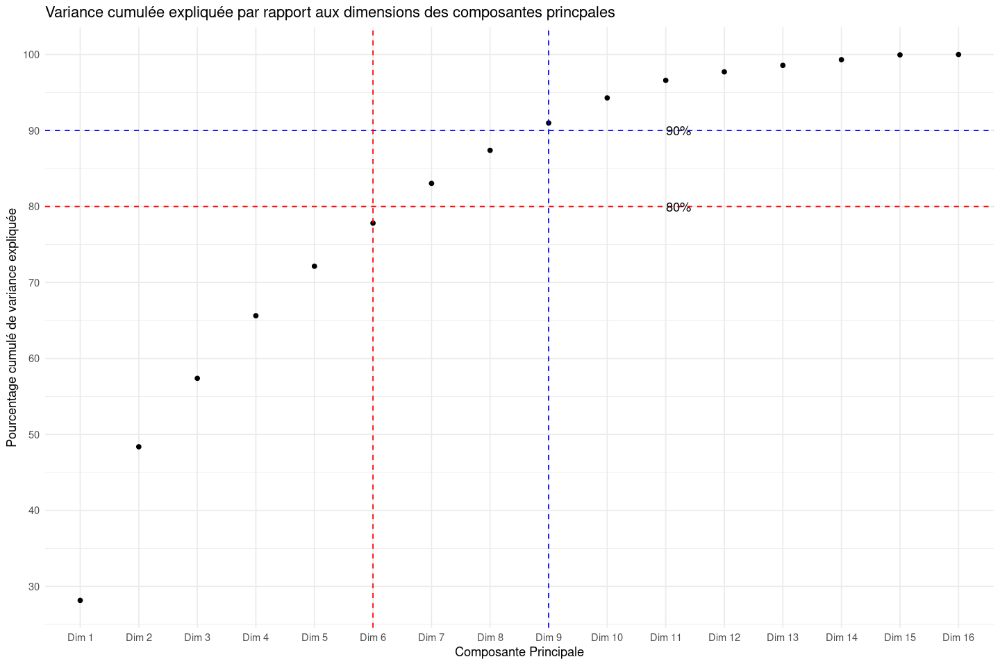

In [39]:
# Calculer le pourcentage de variance expliquée par chaque composante principale
variance_expliquee <- pca$eig[, 2] / sum(pca$eig[, 2]) * 100

# Calculer le pourcentage cumulé de la variance expliquée
variance_cumulee <- cumsum(variance_expliquee)

data_variance <- data.frame(Composante = 1:length(variance_expliquee),
                            VarianceCumulee = variance_cumulee)

data_variance$Composante <- factor(data_variance$Composante, labels = paste0("Dim ", 1:16))
#print(data_variance$Composante)

ggplot(data_variance, aes(x = Composante, y = VarianceCumulee)) +
  geom_line() +
  geom_point() +
  scale_y_continuous(breaks = seq(0, 100, by = 10)) +  # Y-axis ticks every 10%
  geom_hline(yintercept = 80, linetype = "dashed", color = "red") +  # Line at 80%
  geom_hline(yintercept = 90, linetype = "dashed", color = "blue") +  # Line at 90%
  geom_vline(xintercept = 6, linetype = "dashed", color = "red") + # Line at Dim 6
  geom_vline(xintercept = 9, linetype = "dashed", color = "blue") + # Line at Dim 9
  theme_minimal() +
  labs(x = "Composante Principale", 
       y = "Pourcentage cumulé de variance expliquée",
       title = "Variance cumulée expliquée par rapport aux dimensions des composantes princpales") +
  annotate("text", x = 11, y = 80, label = "80%", hjust = 0) +  # Label for the 80% line
  annotate("text", x = 11, y = 90, label = "90%", hjust = 0)    # Label for the 90% line

#data_variance

Interprétation :

Dans un premier temps, le tableau nous présente la varianxce expliquée pour chaque dimension, ainsi que le pourcentage que cela représente. La dernière colonne nous donne les pourcentages de variances cumulées. En général, on peut se satisfaire de dimension représentant 80% de la variance cumulée. Ici, cela reviendrait à garder 7 composantes principales. Si on souhaite plus de précision, avec 90% de la variance cumulée, on peut alors garder 9 composantes principales. Cependant, on observe que les 2 premières composantes portent beaucoup d'information (48% de la variance cumulée), cela montre que ces 2 composantes portent à elles-seules la moitié de information.

Le graphique nous permet de vérifier ces observations. On remarque qu'à partir d'un certain seuil (environ 90%), il faut rajouter beaucoup de composantes dans l'ACP pour gagner de l'information sur la variance cumulée.

On décide dans un premier temps de conserver les 7 premières composantes principales, pour suivre les recommendations du cours.

### 1.4.3 - Etude des composantes principales

Nous allons construire un nouveau dataframe avec les 7 premiers composantes de l'ACP. Comme présenté ci-dessus, cela nous permeter d'expliquer 80% de la variance.

In [40]:
n_composantes <- ncol(pca$ind$coord)
print(n_composantes)

[1] 10


In [41]:
# Transformation des scores des composantes principales en dataframe
data_pca <- data.frame(
  Dim1 = pca$ind$coord[, 1],
  Dim2 = pca$ind$coord[, 2],
  Dim3 = pca$ind$coord[, 3],
  Dim4 = pca$ind$coord[, 4],
  Dim5 = pca$ind$coord[, 5],
  Dim6 = pca$ind$coord[, 6],
  Dim7 = pca$ind$coord[, 7]
)

# Affichage des premières lignes du dataframe
head(data_pca)

,Dim1,Dim2,Dim3,Dim4,Dim5,Dim6,Dim7
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,-1.674838,1.0415826,0.34892774,-0.03560378,0.1447499,1.7530359,-0.4729369
5,-1.594912,0.9091384,-0.27064961,0.04304158,-0.6046642,0.9395275,-1.3744605
6,-1.530935,0.9143973,0.52029031,-0.19442418,0.4649081,2.0100332,-0.1718999
7,-1.410927,0.7876868,-0.08356876,0.07653518,-0.1269664,1.4810126,-0.8179300
8,-1.406894,0.8431969,0.55847473,-0.04139189,0.7466212,2.4720790,0.2309349
9,-1.140616,0.5273682,-0.19344220,-0.04803884,-0.1075834,1.2294525,-0.9665445


In [42]:
# Extraction des valeurs propres et pourcentages de variance expliquée
eigenvalues <- pca$eig[1:7, "eigenvalue"]
percent_variance <- round(pca$eig[1:7, "percentage of variance"], 0) # Arrondi à deux décimales

# Calcul du pourcentage cumulé de variance expliquée
cum_percent_variance <- round(cumsum(percent_variance), 0) # Arrondi à deux décimales après le calcul cumulatif

# Création du dataframe
df_pca_results <- data.frame(
  Dimension = paste0("Dim", 1:7),
  `Variance expliquée` = eigenvalues,
  `Pourcentage variance expliquée` = percent_variance,
  `Pourcentage cum var expliquée` = cum_percent_variance
)

# Affichage du dataframe
df_pca_results

,Dimension,Variance.expliquée,Pourcentage.variance.expliquée,Pourcentage.cum.var.expliquée
,<chr>,<dbl>,<dbl>,<dbl>
comp 1,Dim1,4.5054860,28,28
comp 2,Dim2,3.2349523,20,48
comp 3,Dim3,1.4406705,9,57
comp 4,Dim4,1.3191535,8,65
comp 5,Dim5,1.0416087,7,72
comp 6,Dim6,0.9078723,6,78
comp 7,Dim7,0.8371229,5,83


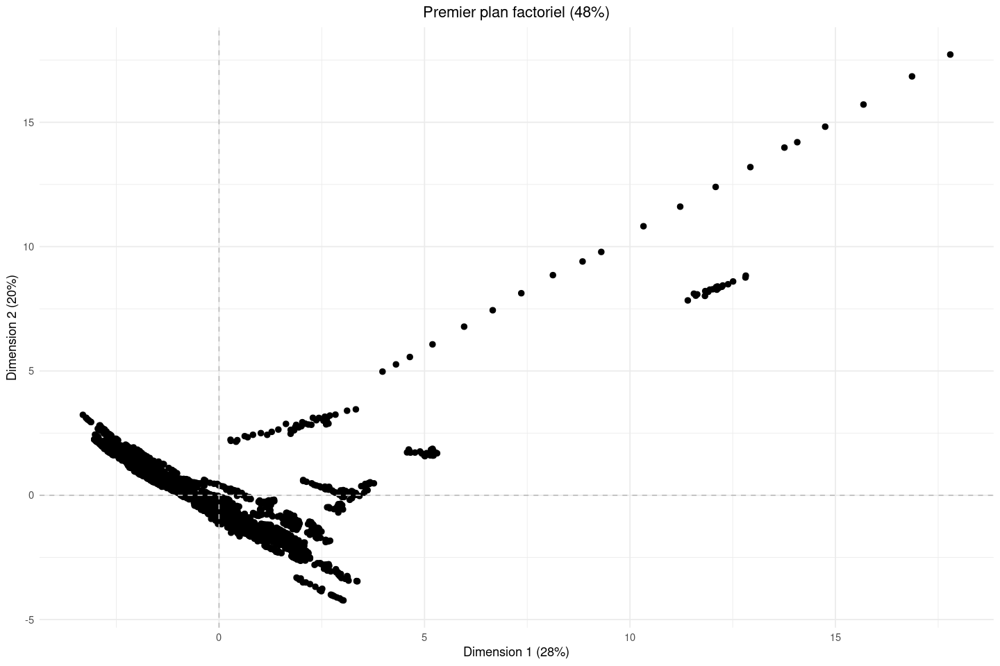

In [43]:
# Affichage de la répartition des données en fonction des 2 premières dimensions
ggplot(data_pca, aes(x = Dim1, y = Dim2)) + 
  geom_point(size = 2) +  # nuage de points avec une taille de 8
  xlab("Dimension 1 (28%)") +  # modification du nom de l'axe X
  ylab("Dimension 2 (20%)") +  # idem pour axe Y
  ggtitle("Premier plan factoriel (48%)") +  # titre général
  theme_minimal() +  # thème minimaliste
  theme(plot.title = element_text(hjust = 0.5)) +  # centrer le titre
  geom_hline(yintercept = 0, color = "grey", linetype = "dashed") +
  geom_vline(xintercept = 0, color = "grey", linetype = "dashed") # ajouter grille de fond

Interprétation :

* Axes : L'axe horizontal (Dim 1) représente la première composante principale, et l'axe vertical (Dim 2) représente la deuxième composante principale. Ces deux axes rerésentent la plus grande partie de la variance dans nos données, avec 28% pour la Dimension 1 et 20% pour la Dimension 2, cumulant à 48% de la variance totale.

* Dispersion des points : Chaque point représente une observation dans l'espace des composantes principales. La dispersion des points montre la distribution des observations en fonction de ces deux principales dimensions de variance.

Interprétation des composantes :

* La dimension 1 semble capturer une variance significative, comme indiqué par le pourcentage (33%). Si cette composante est fortement corrélée avec certaines variables, cela indiquerait que ces variables sont des facteurs significatifs de variation dans nos données.

* La dimension 2 capture moins de variance (18%) mais peut représenter un autre aspect des données qui est orthogonale (donc indépendante) à la dimension 1.

Regroupements et tendances : Les groupes de points qui apparaissent sur le graphique peuvent indiquer des similitudes entre les observations. Par exemple, le grand groupe de points en bas à gauche pourrait représenter des observations avec des caractéristiques communes qui les distinguent des observations représentées par les points dispersés le long de la dimension 1.

Outliers : Des points éloignés des autres peuvent être des outliers qui ont des propriétés très différentes des observations typiques ou qui pourraient être des erreurs de mesure ou de saisie, ou encore des valeurs incohérentes avec les autres.

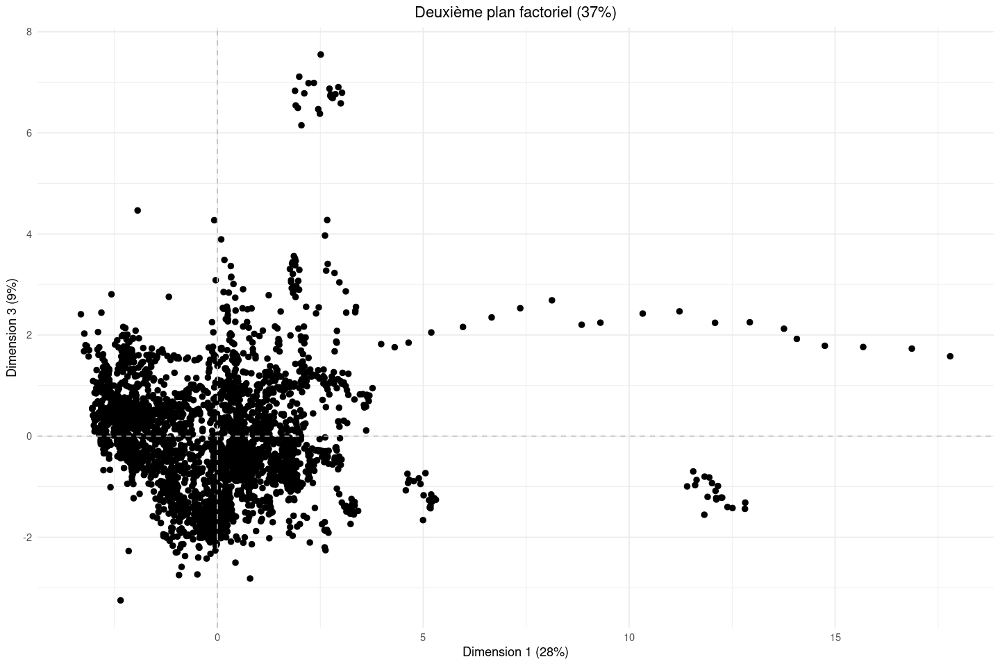

In [44]:
# Affichage de la répartition des données en fonction des dimensions 1 et 3
ggplot(data_pca, aes(x = Dim1, y = Dim3)) +
  geom_point(size = 2) +  # nuage de points avec une taille de 8
  xlab("Dimension 1 (28%)") +  # modification du nom de l'axe X
  ylab("Dimension 3 (9%)") +  # idem pour axe Y
  ggtitle("Deuxième plan factoriel (37%)") +  # titre général
  theme_minimal() +  # thème minimaliste
  theme(plot.title = element_text(hjust = 0.5)) +  # centrer le titre
  geom_hline(yintercept = 0, color = "grey", linetype = "dashed") +
  geom_vline(xintercept = 0, color = "grey", linetype = "dashed") # ajouter grille de fond

Dans la continuité du raisonnement conduit sur le premier plan factoriel, nous allons analyser celui entre la première dimension et la troisème dimension de l'ACP.

* Dispersion : La dispersion des points indique la variation des observations selon ces deux dimensions de l'ACP. La plupart des observations sont concentrées vers le centre du graphique, suggérant que pour ces deux composantes, beaucoup d'observations ont des scores similaires.

* Patterns et groupes : Bien que les points soient largement dispersés, il n'y a pas de groupes distincts visibles dans cette vue. Cependant, on remarque un ensemble de points qui s'étendent le long de la dimension 1, indiquant une caractéristique qui varie de manière significative parmi ces observations.

* Outliers : Il y a quelques points qui se détachent loin du centre, en particulier le long de la dimension 1. Ces observations peuvent être très différentes du reste des données.

* Cumul de variance : Les deux dimensions affichées représentent ensemble 36% de la variance totale des données. Cela signifie que bien que ces deux composantes apportent des informations significatives sur les données, il reste encore beaucoup de variance à expliquer par d'autres composantes ou dimensions.

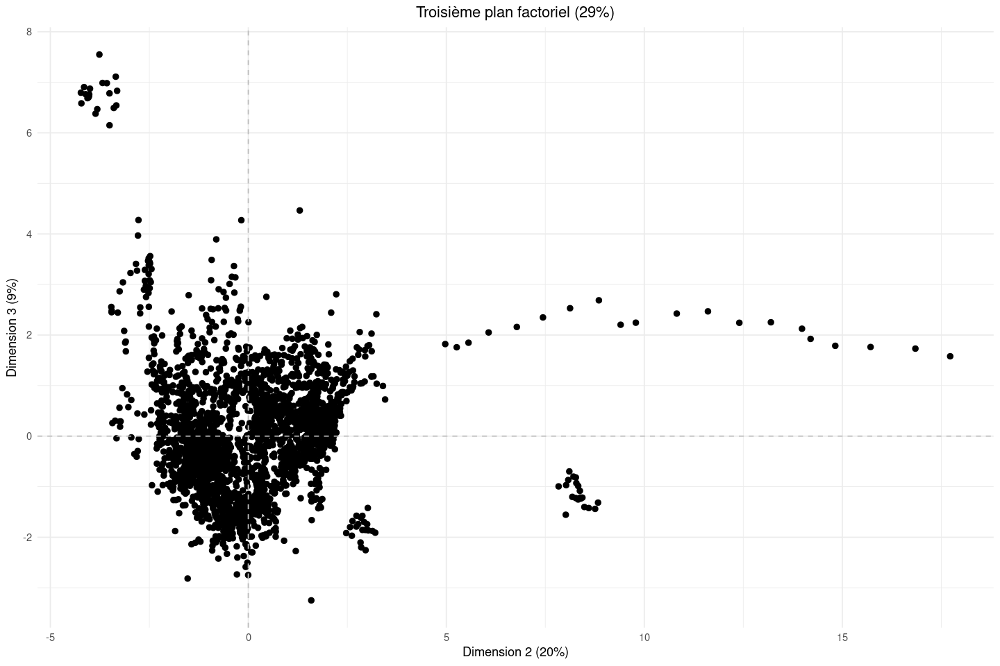

In [45]:
# Affichage de la répartition des données en fonction des dimensions 2 et 3
ggplot(data_pca, aes(x = Dim2, y = Dim3)) +
  geom_point(size = 2) +  # Nuage de points avec une taille spécifique
  xlab("Dimension 2 (20%)") +  # Modification du nom de l'axe X
  ylab("Dimension 3 (9%)") +  # Modification du nom de l'axe Y
  ggtitle("Troisième plan factoriel (29%)") +  # Titre général
  theme_minimal() +  # Thème minimaliste
  theme(plot.title = element_text(hjust = 0.5)) +  # Centrer le titre
  geom_hline(yintercept = 0, color = "grey", linetype = "dashed") +
  geom_vline(xintercept = 0, color = "grey", linetype = "dashed") # Ajouter une grille de fond

Interprétation :

* Dispersion des points: La majorité des observations sont groupées autour du centre du graphique, mais il existe également un nombre significatif de points qui s'étendent loin du centre le long de la deuxième composante principale. Cela suggère qu'il y a une variable ou un ensemble de variables qui contribuent significativement à la variance dans la deuxième dimension.

* Distribution: Il y a une concentration de données autour de l'origine et une queue qui s'étend vers la droite le long de la deuxième dimension. Cela peut indiquer une distribution asymétrique des données pour les variables qui chargent fortement sur cette composante.

* Potentiels outliers: Des points éloignés des autres peuvent être identifiés comme des outliers. Ces observations pourraient représenter des cas extrêmes ou des situations particulières qui se démarquent du reste de l'ensemble des données.

### 1.4.4 - Etude des chargements

Pour déterminer quelles variables contribuent le plus à chaque composante principale dans une Analyse en Composantes Principales (ACP), nous pouvons examiner les "chargements" des composantes. Les chargements sont des coefficients qui indiquent comment chaque variable est représentée sur chacune des composantes principales.

* Les valeurs sont différentes par rapport au code python lorsque j'utilise PCA() mais cela fonctionne avec l'utilisation de la fonction prcomp() pour faire l'ACP

In [46]:
# Effectuer l'ACP
#pca <- PCA(data_quanti_scaled, ncp = 7, scale.unit = TRUE, graph = FALSE)

# Obtenir les chargements (vecteurs propres) pour les variables
#loadings <- get_pca_var(pca)$coord

# Créer un DataFrame pour une meilleure lisibilité
#loadings_df <- as.data.frame(loadings)

# Nommer les lignes avec les noms des variables originales
#rownames(loadings_df) <- colnames(data_quanti_scaled)

# Afficher les chargements pour les 7 premières composantes
#loadings_df

In [47]:
#test avec la fonction prcomp() --> j'obtiens les mêmes valeurs qu'en python
pca <- prcomp(data_quanti_scaled, scale. = TRUE)

# Extract loadings
loadings <- pca$rotation

# Create a data frame of loadings for better readability
loadings_df <- as.data.frame(loadings)

# Name the rows with the names of the original variables
rownames(loadings_df) <- colnames(data_quanti_scaled)

# Print the loadings for the first 7 principal components
loadings_df <- loadings_df[, 1:7]

#transformation pour avoir les mêmes résultats qu'en Python
loadings_df$PC3 <- loadings_df$PC3 * -1
loadings_df$PC4 <- loadings_df$PC4 * -1
loadings_df$PC6 <- loadings_df$PC6 * -1


loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Elec_access,0.32169844,-0.30148963,0.14232124,-0.1057922872,0.139282900,-0.094532099,0.06422833
Clean_access,0.33034097,-0.32330257,0.11638018,0.0002989821,0.095604788,-0.014480104,0.06734582
Renewable_share,-0.30765781,0.29823930,0.01213318,0.3291515111,-0.135596204,-0.070232456,0.01920247
Fossil_elec,0.33132755,0.35544387,-0.06187868,-0.1161630227,-0.001937329,-0.006409328,-0.08600099
Nuclear_elec,0.28693264,0.21765513,0.09335047,0.0988423966,-0.090347102,0.026051912,-0.01717326
Renewable_elec,0.31882730,0.33964124,0.02262032,-0.0053391193,-0.032839769,-0.065226370,0.02469518
Low_carb_elec,-0.08143165,0.13702246,0.28936299,0.5894017365,-0.145331449,-0.372935796,0.13608987
Energy_per_capita,0.27435070,-0.23015378,-0.28585611,0.3426816611,-0.121467777,0.197998522,0.18878272
PEnergy_intensity,-0.06036776,0.13200520,-0.34292085,0.3687162292,0.386736558,0.615759790,0.08591693


Le tableau des chargements illustre la façon dont chaque variable contribue à chacune des sept premières dimensions de l'ACP.

* La première dimension semble être influencée positivement par Elec_access, Clean_access, Fossil_elec, Nuclear_elec, Renewable_elec, et les émissions de CO2, ce qui suggère que cette dimension capture un mélange de l'accès à l'électricité, la consommation d'énergie à partir de différentes sources et les émissions associées. Cette dimension représente probablement la consommation énergétique du pays : une composante élevée correspondrait à une forte production et consommation énergétique.

* La dimension 2 montre une forte contribution positive de Fossil_elec et Renewable_elec, indiquant que cette dimension peut représenter l'équilibre entre les sources d'énergie renouvelables et fossiles dans la production d'électricité des pays. Cette dimension est influencée négativement par la variable Elec_access. On peut supposer que la deuxième dimension présente la différence entre les capacités de production d'un mix énergétique et l'accès à l'électricité pour la population.

* La troisième composante principale est fortement influencée par Low_carb_elec et Energy_per_capita, ce qui pourrait indiquer que cette dimension reflète des aspects de la consommation d'énergie à faible teneur en carbone et par habitant.

* Dimension 4 : Les variables Low_carb_elec et Energy_per_capita ont des chargements relativement élevés mais de signes opposés, ce qui pourrait signifier que cette composante distingue les pays avec une consommation d'énergie par personne élevée mais ayant une faible part d'énergie à faible teneur en carbone, des pays avec une situation inverse.

* Dimension 5 : On observe une forte charge négative importante pour la densité et le PIB par habitant. Cette dimension pourrait capturer la densité d'un pays : un petit pays avec une orte densité aurait une valeur élevée sur cette dimension.

* Dimension 6 : Growth et GDP_per_capita présentent des chargements positifs significatifs, ce qui suggère que cette dimension peut refléter le niveau de développement économique et la croissance. Cela peut indiquer que les pays avec une croissance économique forte et un PIB par habitant élevé se distinguent des autres sur cette dimension. De plus, la variable PEnergy_intensity est assez négative, ce qui est cohérent avec l'analyse.

* Dimension 7 : Longitude a un chargement négatif considérable, ce qui peut indiquer que cette composante reflète des différences géographiques ou régionales dans les données. Cela pourrait être lié à la position longitudinale des pays et à des facteurs environnementaux ou économiques qui varient d'est en ouest.

Les composantes avec des contributions élevées de Elec_access, Clean_access, et Energy_per_capita pourraient être interprétées comme des indicateurs de développement et de consommation d'énergie. Les composantes où Fossil_elec, Nuclear_elec, et Renewable_elec chargent fortement pourraient refléter la stratégie énergétique et la mixité des sources d'énergie des pays. Les dimensions où les émissions de CO2 ont des chargements élevés sont probablement liées à l'impact environnemental et pourraient être interprétées dans le contexte des objectifs de durabilité et de réduction des émissions.

Ces interprétations sont mises en avant de manière plus visuelle avec la matrice ci-dessous.

In [48]:
#install.packages("pheatmap")

In [49]:
library(pheatmap)

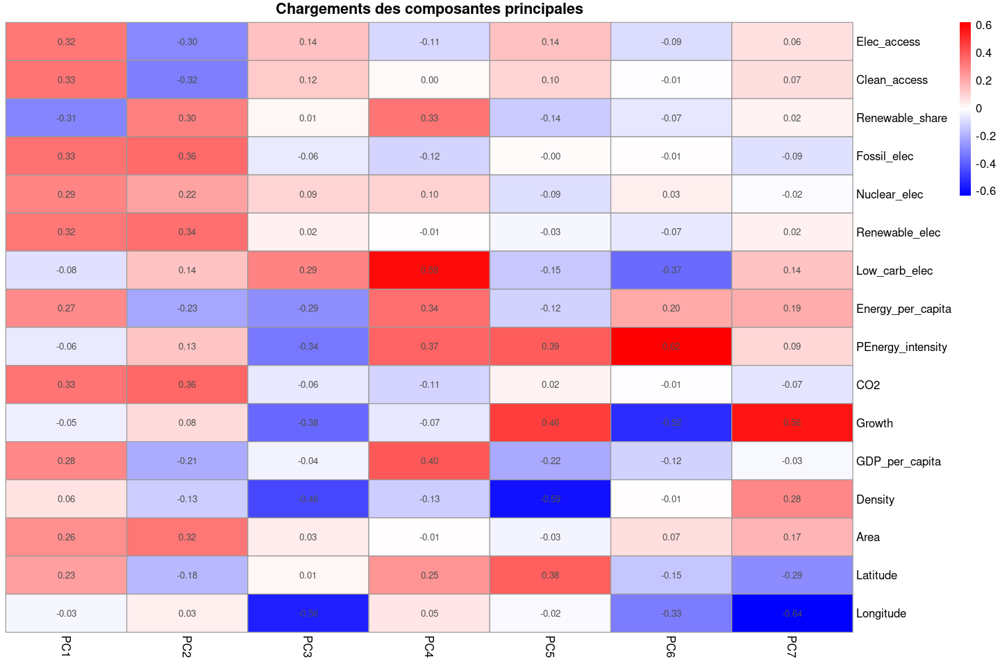

In [50]:
# Créer la heatmap
pheatmap(loadings_df,
         color = colorRampPalette(c("blue", "white", "red"))(n = 299),
         annotation_col = NULL,
         display_numbers = TRUE, # Afficher les valeurs dans les cases
         number_format = "%.2f", # Format des nombres
         main = "Chargements des composantes principales", # Titre de la heatmap
         fontsize_row = 10,
         fontsize_col = 10,
         fontsize_number = 8,
         cluster_rows = FALSE, # Ne pas regrouper les lignes
         cluster_cols = FALSE) # Ne pas regrouper les colonnes

## 1.5 - Dépendance de la variable Year et de la variable présentant les émissions de CO2

In [51]:
data_ <- data[, -((ncol(data)-3):ncol(data))] # Exclut les 4 dernières colonnes
head(data_) # Affiche les 6 premières lignes du nouveau dataframe

,Entity,Year,Elec_access,Clean_access,Renewable_share,Fossil_elec,Nuclear_elec,Renewable_elec,Low_carb_elec,Energy_per_capita,PEnergy_intensity,CO2,Growth,GDP_per_capita,Density,Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.50,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.06497,10.90,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.39089,12.20,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995
7,Afghanistan,2006,30.71869,13.85,31.89,0.20,0,0.64,76.19048,304.4209,1.50,1760,5.357403,263.7336,60,652230,33.93911,67.70995
8,Afghanistan,2007,36.05101,15.30,28.78,0.20,0,0.75,78.94737,354.2799,1.53,1770,13.826320,359.6932,60,652230,33.93911,67.70995
9,Afghanistan,2008,42.40000,16.70,21.17,0.19,0,0.54,73.97260,607.8335,1.94,3560,3.924984,364.6635,60,652230,33.93911,67.70995


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


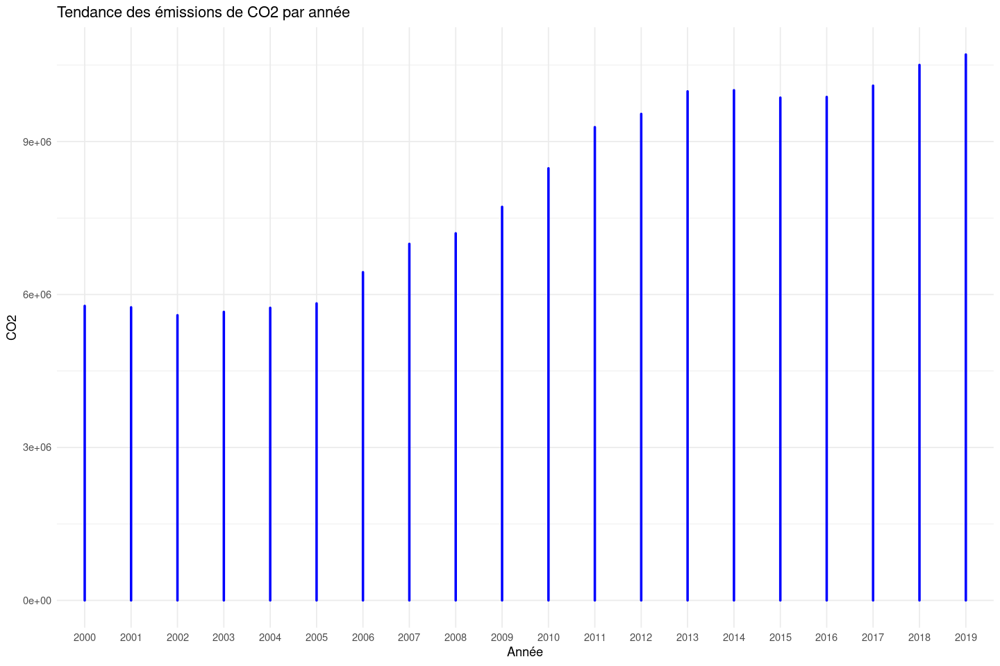

In [52]:
#data_$Year <- as.numeric(as.character(data_$Year))
data_$Year <- as.factor(data_$Year)

# Créer le graphique de série temporelle avec remplissage sous la courbe
ggplot(data_, aes(x = Year, y = CO2)) + 
  geom_line(color = "blue", size = 1) + 
  theme_minimal() +  
  labs(title = 'Tendance des émissions de CO2 par année', x = 'Année', y = 'CO2')

Interprétation :

* Tendance générale : La ligne représente la tendance moyenne des émissions de CO2 sur la période donnée. On observe que les émissions de CO2 ont globalement augmenté au fil du temps depuis l'an 2000 jusqu'à environ 2010. Après 2010, la tendance semble plus stable avec une légère augmentation ou stabilisation des émissions.

* Variation annuelle : La zone ombrée qui s'étend au-dessus et en dessous de la ligne de tendance indique la variation des émissions de CO2 au sein de chaque année. La largeur de cette zone peut signifier l'écart-type, indiquant la variabilité des émissions de CO2 d'une année à l'autre. Une zone large suggère une grande variabilité, tandis qu'une zone étroite indique une plus grande constance dans les émissions au cours de l'année. On remarque que la largeur de cette zone augmente au fur et à mesure du temps.

* Pointes et chutes : Certaines années montrent des pointes ou des chutes dans les émissions, comme la pointe autour de 2010. Ces fluctuations pourraient être dues à des événements spécifiques ou à des changements dans les politiques environnementales, les pratiques économiques ou les technologies énergétiques.

* Analyse contextuelle : Pour comprendre pleinement ce graphique, il est important de le mettre en contexte avec d'autres données et événements. Par exemple, des augmentations dans les émissions de CO2 pourraient coïncider avec la croissance économique, tandis que des stabilisations ou des réductions pourraient refléter des améliorations dans l'efficacité énergétique ou l'adoption d'énergies renouvelables.

En résumé, ce graphique indique que, bien que les émissions de CO2 ont augmenté jusqu'à 2010, il y a eu une tendance vers la stabilisation ou une augmentation plus modérée dans les années suivantes. Cela pourrait être interprété comme un signe positif dans le contexte des efforts mondiaux de réduction des émissions.

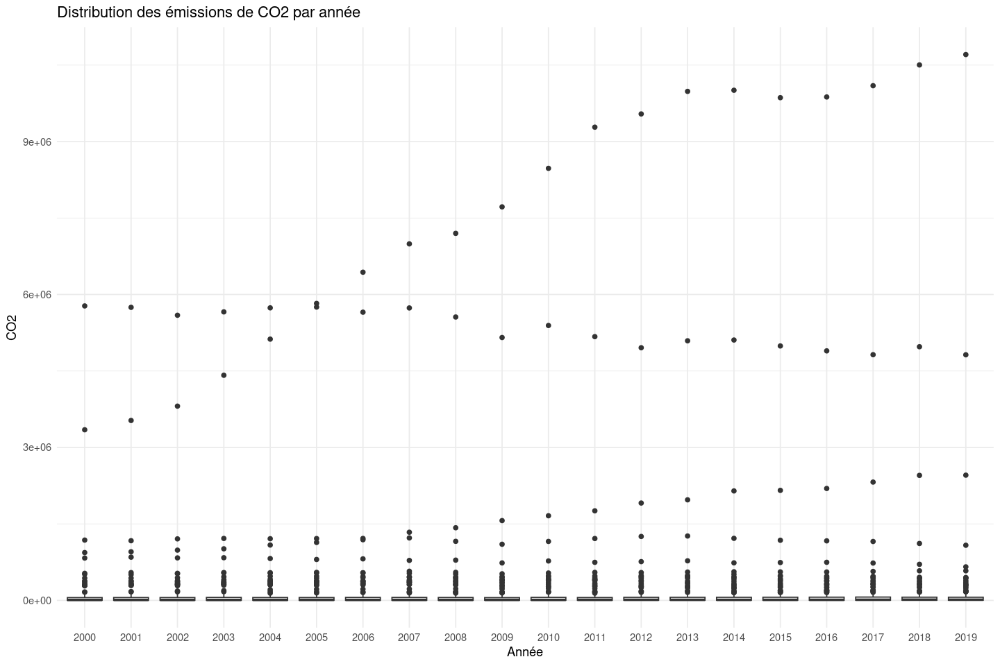

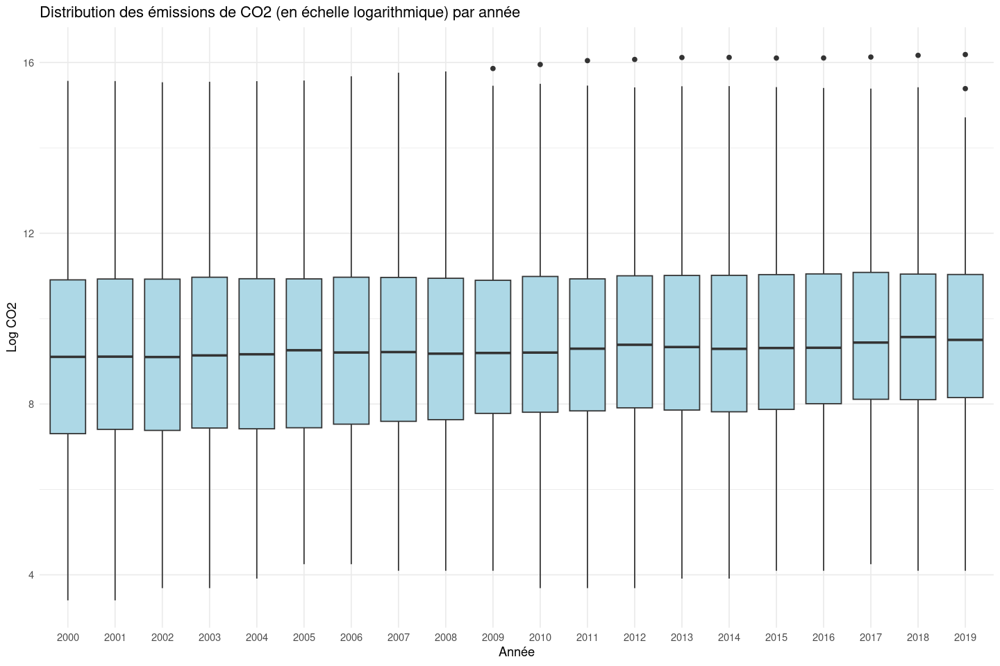

In [53]:
data_$Year <- as.factor(data_$Year)

ggplot(data_, aes(x = Year, y = CO2)) +
  geom_boxplot() +
  theme_minimal() +
  labs(title = 'Distribution des émissions de CO2 par année', x = 'Année', y = 'CO2')

data_$log_CO2 <- log(data$CO2)
# Création d'un boxplot des émissions de CO2 sur une échelle logarithmique
ggplot(data_, aes(x = Year, y = log_CO2)) +
  geom_boxplot(fill = "lightblue") +  # Ajoute les boxplots avec une couleur de remplissage bleu clair
  theme_minimal() +  # Utilise un thème minimaliste
  labs(title = 'Distribution des émissions de CO2 (en échelle logarithmique) par année', 
       x = 'Année', 
       y = 'Log CO2')  # Ajoute des labels et un titre

Le premier graphique est très difficile à interpréteer. Cela s'explique par les émissions importantes des pays les plus polluants qui sont visibles sous forme "d'ouliers" et applatissent les boxplots. Les répartitions sont trop désiquilibrées. Nous avons pu observer une tendance Gaussienne de la variable CO2 après transformation logarithmique. Le deuxième graphique représente des boxplots des émissions de CO2 en échelle logarithmique au cours du temps.

Sur ce deuxième graphique, nous avons décidé de transformer la variable CO2 avec une transformation logarithimique comme vu précédemment. L'utilisation de l'échelle logarithmique est justifiée par le fait que les émissions de CO2 ont une large gamme de valeurs. Ainsi, le logarithme aide à mieux visualiser les différences, surtout lorsque les données s'étendent sur plusieurs ordres de grandeur, comme c'est le cas sur le premier graphique.

* Médiane et quartiles : Chaque boîte représente la distribution des émissions de CO2 pour une année donnée, où la ligne centrale de la boîte indique la médiane des émissions de CO2. Les bords de la boîte représentent le premier et le troisième quartile, montrant la répartition centrale des données.

* Variabilité : Les moustaches des box s'étendent depuis le haut et le bas de chaque boîte jusqu'aux valeurs maximales et minimales dans l'intervalle interquartile (souvent jusqu'au dernier point situé à moins de 1,5 fois l'écart interquartile du bord de la boîte), montrant la variabilité totale des émissions de CO2 pour chaque année.

* Outliers : Les points au-dessus des moustaches sont considérés comme des outliers. Ces points représentent des années où les émissions de CO2 étaient exceptionnellement élevées par rapport aux autres années.

* Tendance temporelle : En comparant les boîtes d'une année à l'autre, on ne note pas de changement significatif dans la médiane sur le long terme, ce qui suggérerait que la médiane des émissions de CO2 (sur l'échelle logarithmique) est restée relativement constante au cours de cette période.

* Inégalité dans les émissions : L'ampleur des moustaches et la présence de outliers soulignent l'inégalité dans les émissions de CO2 entre différents pays. Certaines années ont des émissions particulièrement élevées qui se détachent des tendances générales.

## 1.6 - Conclusion sur la partie exploratoire des données

Finalement, cette analyse exploratoire de notre jeu de données nous a permis de visualiser les différences considérables d'échelles et de gaussianité entre nos données. Tout d'abord, nous avons vu que notre jeu de données comporte beaucoup de valeurs manuantes. Dans un premier temps, nous avons décidé de supprimer les colonnes comportant trop de valeurs manquantes, puis les dernières lignes en comportant. De plus, nous avons constaté des fortes différences d'échelles entre nos données. En effet, des poucentages d'accès à l'électricité ne sont pas du même odre de grandeur que des valeurs d'émissions de CO2. Nous avons vu que certaines données ne suivaient pas une tendance gaussienne, mais cet aspect était amélioré avec des transformation comme une transformtion logarithmique. Dans une future partie de modélisation, il sera intéressant de rendre nos données les plus gaussiennes possibles pour améliorer la qualité de notre modèle.

Aussi, nous avons vu des fortes disparités entre les pays sur les émissions de CO2 : quelques pays avaient leurs émissions arrondies à 0, alors que d'autres avaient des émissions très importantes. Le classement des pays les plus émetteurs dépend aussi de la superficie des pays et des émissions par habitant.

Notre étude multi-dimensionnelle nous a permis de montrer que les émissions de CO2 sont fortement influencées par le répartition du mix énergétique d'un pays : les énergies fossiles influencent énormément les émissions de CO2, alors que l'utilisation d'énergie nucléaire a un impact assez neutre. Sur cette étude, l'utilisation d'énergie renouvlable n'améliorait pas la situation si le pays était dépendant des énergies fossiles. D'autres vaiables comme la densité, la superficie ou les coordonnées géographiques ont un impact neutre sur les émissions de CO2. Avec cette étude, nous pourrions envisager l'utilisation d'un modèle de régression linéaire en utilisant uniquement la variable 'Fossil_elec' pour prédire les valeurs des émissions de CO2.

Puis, en réalisant une Analyse en Composantes Principales, nous avons pu passer de 18 à 7 dimensions sur notre jeu de données et émettre des hypothèses sur les significations des composantes principales avec l'étude des chargements des composantes.

Pour finir, nous avons observé l'évolution des émissions de CO2 en fonction des années. L'hétérogénéité des émissions est d'autant plus marquée avec la présence d'outliers sur les boxplots. Une transformation des émissions de CO2 en échelle logarithmique nous a permis de mieux visualiser la médiane et les quantiles qui avaient des évolutions plus constantes, indépendamment de l'évolution importante de la valeur des outliers.

# 2 - Modélisation

Nous considérons maintenant le problème de la prédiction la variable **CO2** à partir des autres variables du point de vue de l’apprentissage automatique, c’est-à-dire en nous concentrant sur les performances du modèle. L’objectif est de déterminer les meilleures performances que nous pouvons attendre, et les modèles qui les atteignent.

## 2.1 - Transformation des données

### 2.1.1 Visualisation avant transformation

Comme étudié et expliqué dans la première partie, nous avons vu que beaucoup de données de notre dataframe ne suivaient pas forcément de tendance gaussienne. Cependant, dans l'objectif d'un modèle plus performant, il est important d'appliquer des transformations sur nos données. Nous allons créer un nouveau dataframe contenant les mêmes colonnes que notre jeu de données initial avec les transformations appliquées.

In [54]:
df <- data[, 1:18] # Création du nouveau dataframe qui sera transformé

In [55]:
library(car)

Le chargement a nécessité le package : carData


Attachement du package : ‘car’


L'objet suivant est masqué depuis ‘package:dplyr’:

    recode




Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”


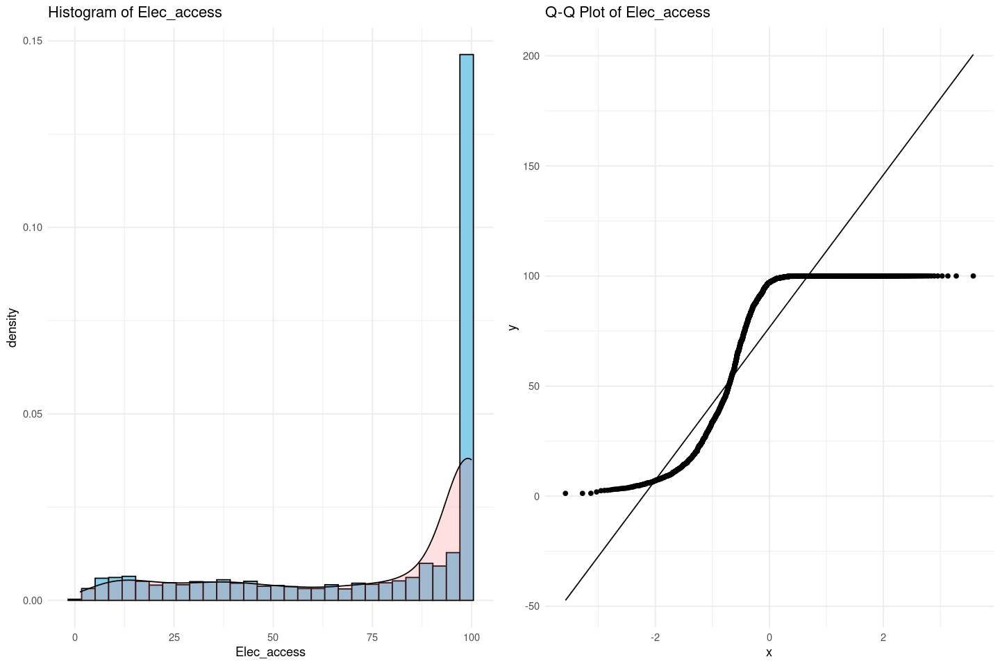

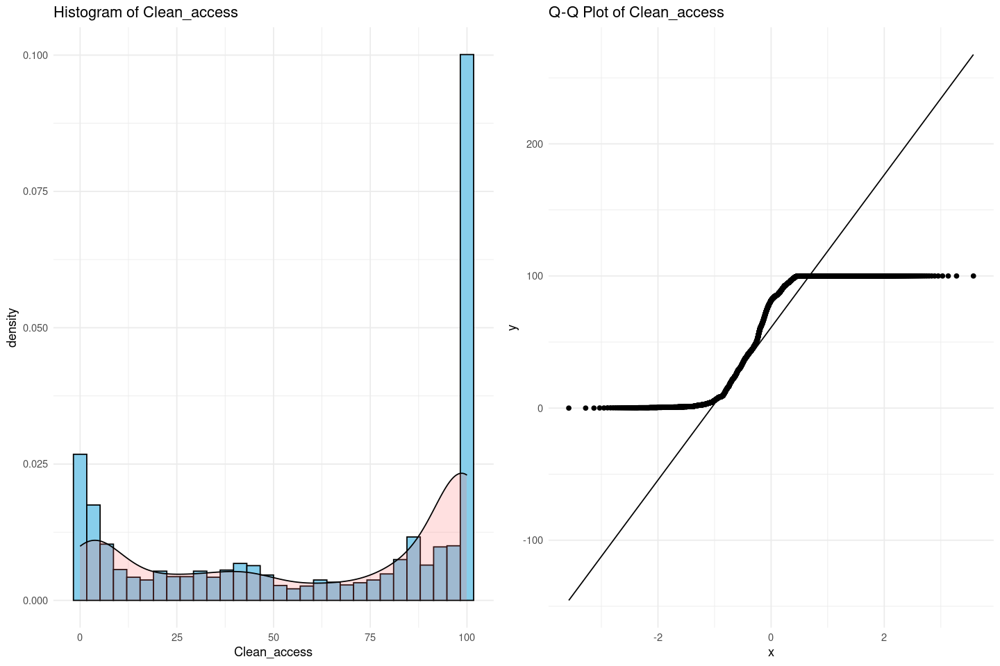

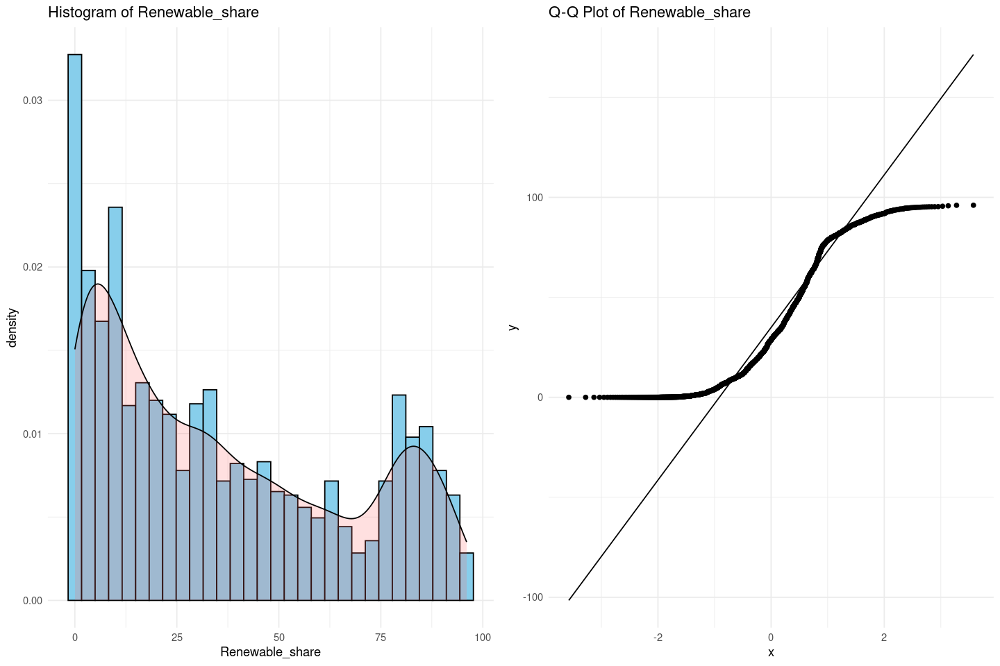

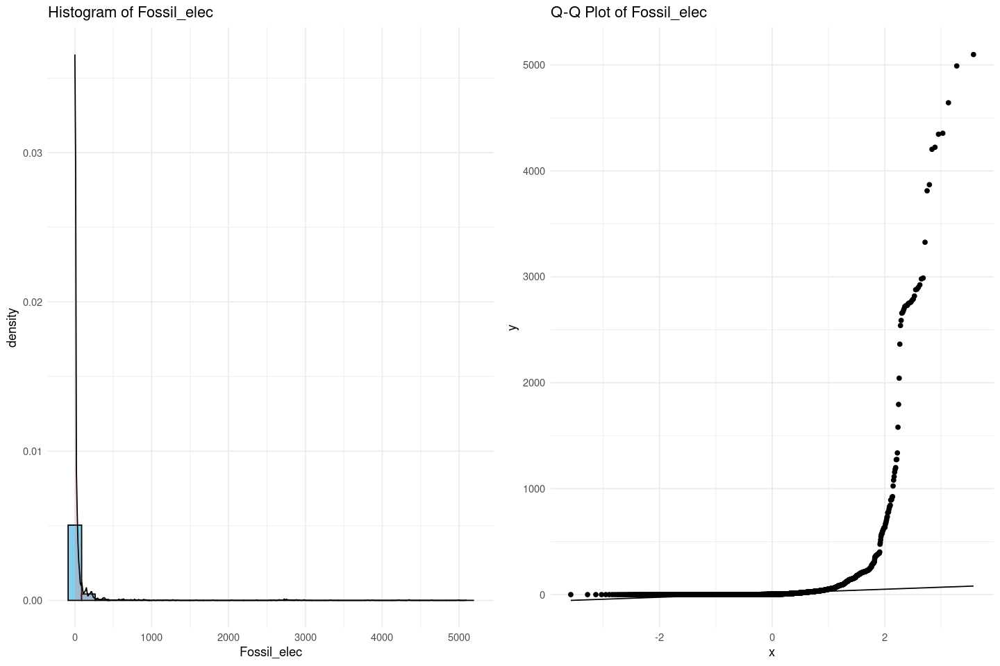

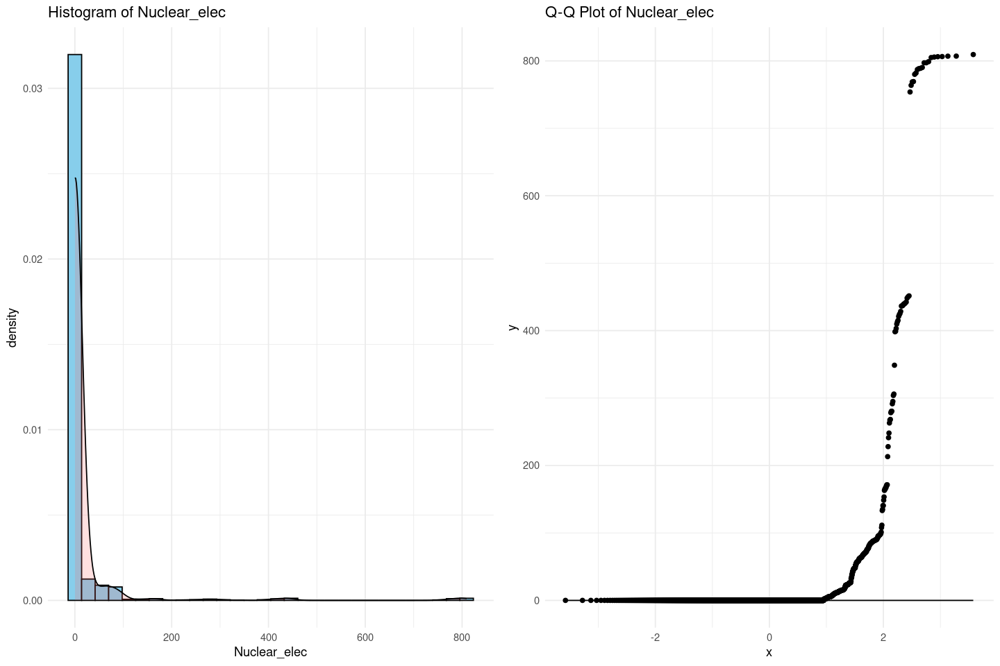

...

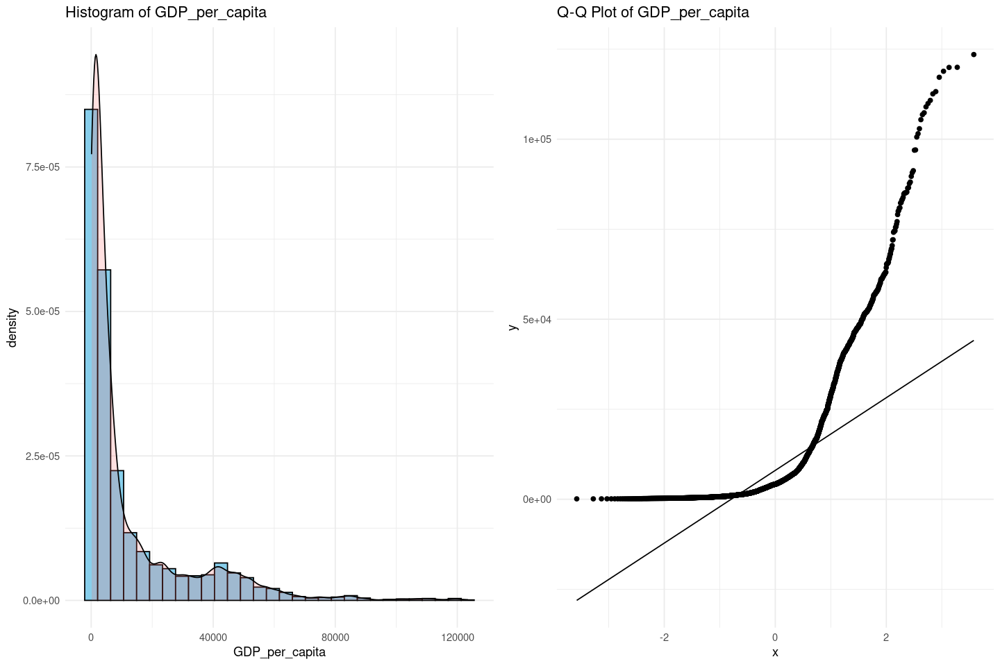

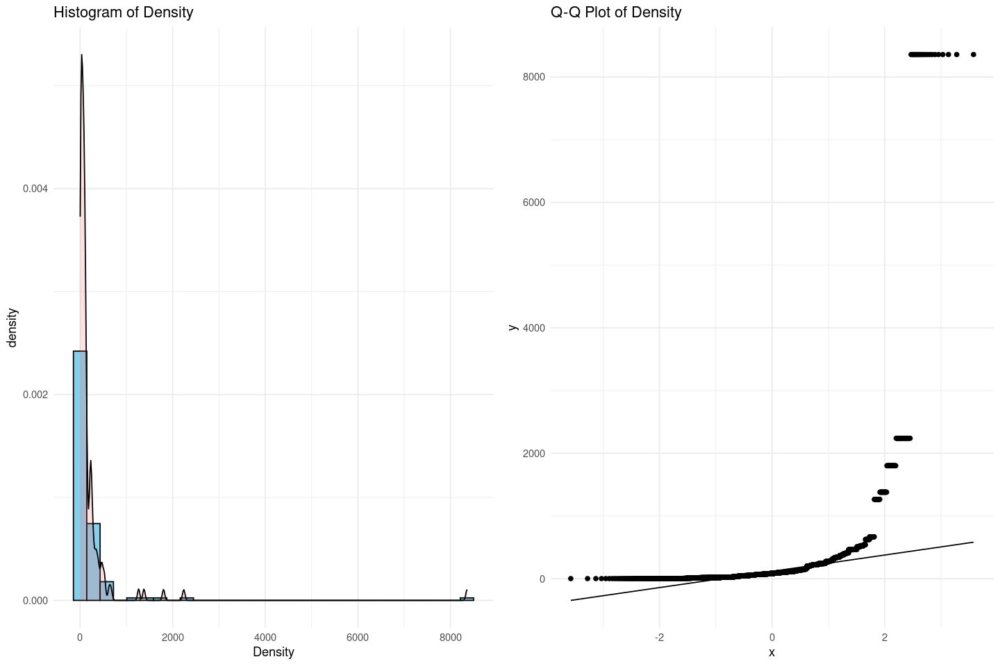

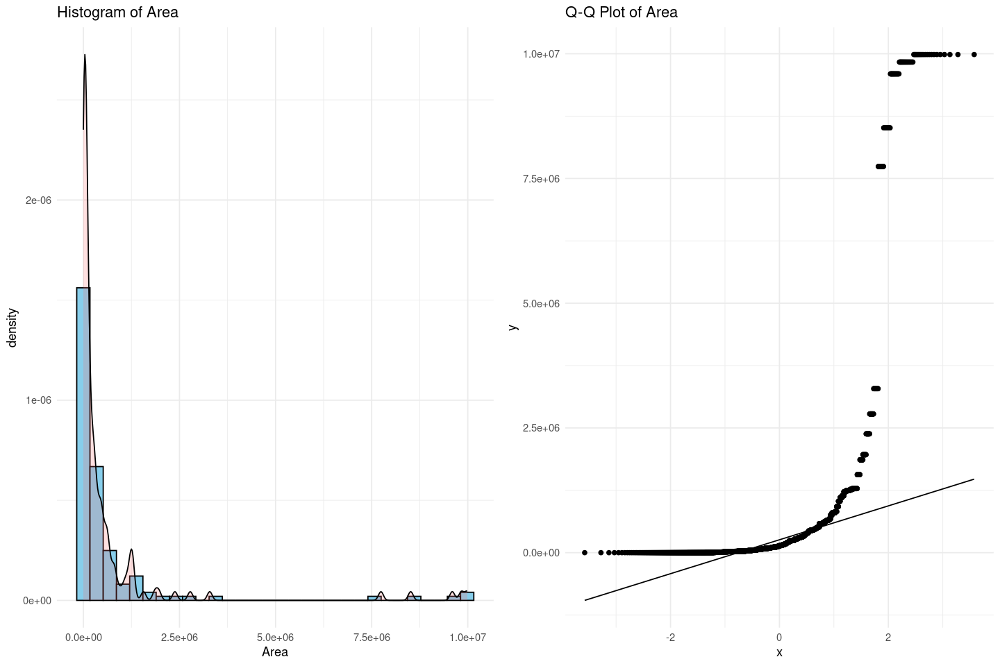

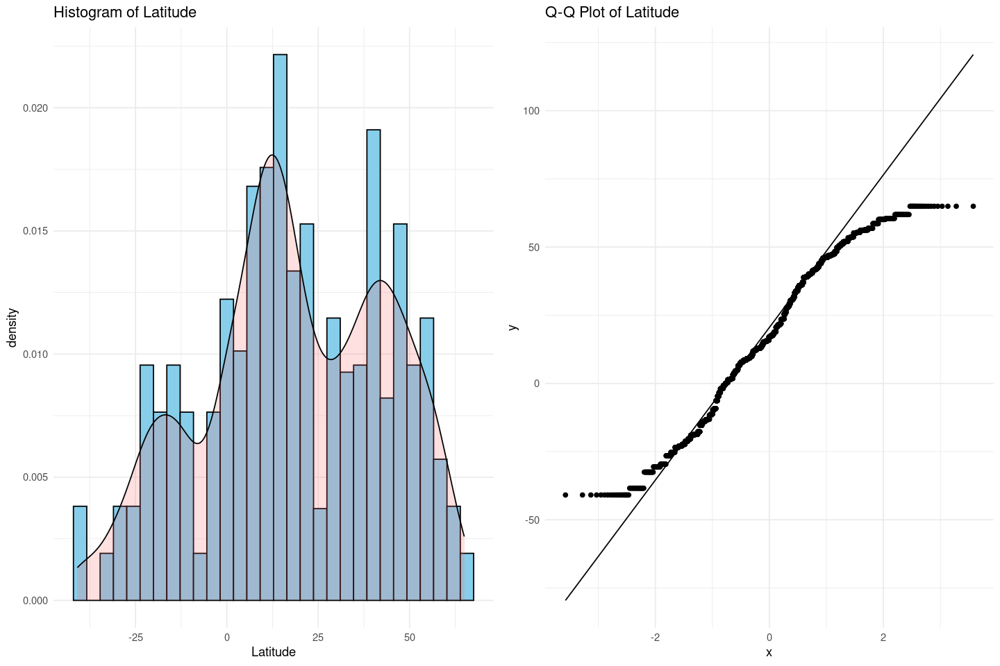

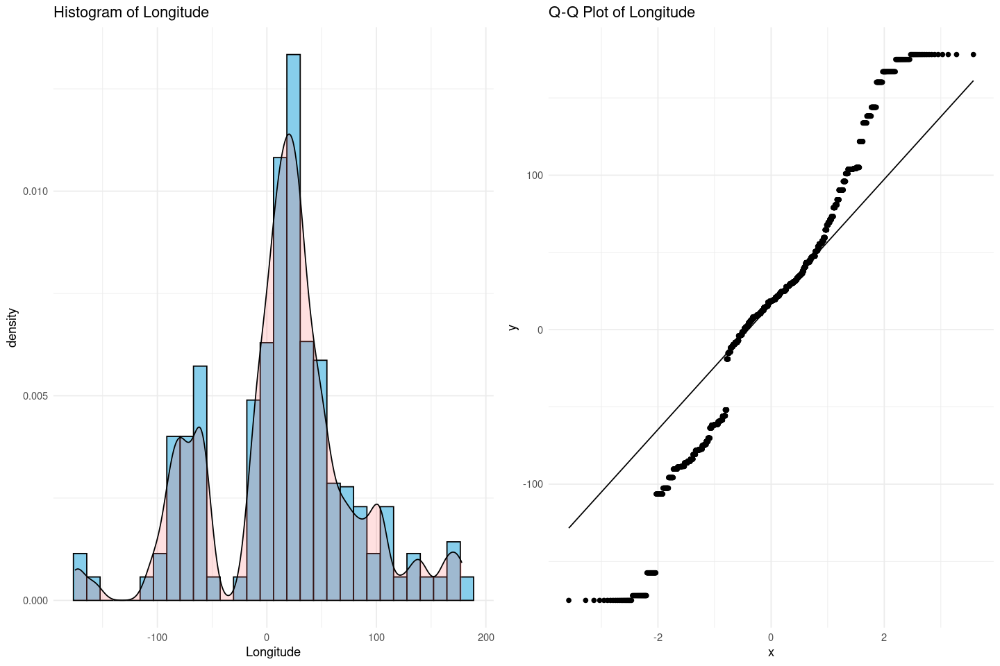

In [56]:
#les graphiques sont plus lisibles si je les affiches 2 par 2 (plutôt qu'en 4x8)

numeric_columns <- sapply(df, is.numeric)

# Boucle sur les colonnes numériques
for (column in names(df)[numeric_columns]) {
  
  # Créer l'histogramme avec ggplot2
  p1 <- ggplot(df, aes_string(x = column)) +
    geom_histogram(aes(y = ..density..), bins = 30, color = "black", fill = "skyblue") +
    geom_density(alpha = .2, fill = "#FF6666") +
    ggtitle(paste('Histogram of', column)) +
    theme_minimal()
  
  # Préparer le Q-Q plot, la fonction qqPlot affiche directement le graphique, donc on utilise qqnorm et qqline
  p2 <- ggplot(df, aes(sample = .data[[column]])) +
    stat_qq() +
    stat_qq_line() +
    ggtitle(paste('Q-Q Plot of', column)) +
    theme_minimal()

  # Afficher les deux plots côte à côte
  grid.arrange(p1, p2, ncol = 2)
}

Nous observons que la plupart de nos données ne sont pas gaussiennes. Il faut donc appliquer les transofrmations appropriées sur les données qui le nécessitent afin de les transformer. Pour les trois premières variables (Elec_acces, Clean_access, Renewable_share), le QQ-plot de nos données est assez spécifique et ne voit pas sa tendance modifiée par les transformations élémentaires (logarithmique, racine carrée, ou autre). Nous décidons dans un premier temps de laisser ces données sans transformation.

### 2.1.2 - Transformation et visualisation

In [57]:
# Apply the logarithm transformations, rename the columns, and reorder them
df <- df %>%
  mutate(
    log_Fossil_elec = log(Fossil_elec + 1),
    log_Nuclear_elec = log(Nuclear_elec + 1),
    log_Renewable_elec = log(Renewable_elec + 1),
    sqrt_Low_carb_elec = sqrt(Low_carb_elec + 1), # Assuming you meant to take the square root here
    log_Energy_per_capita = log(Energy_per_capita + 1),
    log_CO2 = log(CO2 + 1),
    log_PEnergy_intensity = log(PEnergy_intensity + 1),
    log_GDP_per_capita = log(GDP_per_capita + 1),
    log_Density = log(Density + 1),
    log_Area = log(Area + 1)
  ) %>%
  select(
    Entity, Year, Elec_access, Clean_access, Renewable_share, 
    log_Fossil_elec, log_Nuclear_elec, log_Renewable_elec, 
    sqrt_Low_carb_elec, log_Energy_per_capita, log_CO2, 
    log_PEnergy_intensity, Growth, log_GDP_per_capita, 
    log_Density, log_Area, Latitude, Longitude
  )

# Display the dimensions of the dataframe
print(dim(df))

# Display the first few lines of the dataframe
head(df)

[1] 2868   18


,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Fossil_elec,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_CO2,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.50,36.66,0.2700271,0,0.4885800,8.247501,5.442280,7.107425,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.70995
5,Afghanistan,2004,20.06497,10.90,44.24,0.2851789,0,0.4446858,7.995083,5.324137,6.938284,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,Afghanistan,2005,25.39089,12.20,33.88,0.2926696,0,0.4637340,8.027506,5.533663,7.346655,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,Afghanistan,2006,30.71869,13.85,31.89,0.1823216,0,0.4946962,8.785811,5.721691,7.473637,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,Afghanistan,2007,36.05101,15.30,28.78,0.1823216,0,0.5596158,8.941329,5.872906,7.479300,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
9,Afghanistan,2008,42.40000,16.70,21.17,0.1739533,0,0.4317824,8.658672,6.411545,8.177797,1.0784096,3.924984,5.901714,4.110874,13.38815,33.93911,67.70995


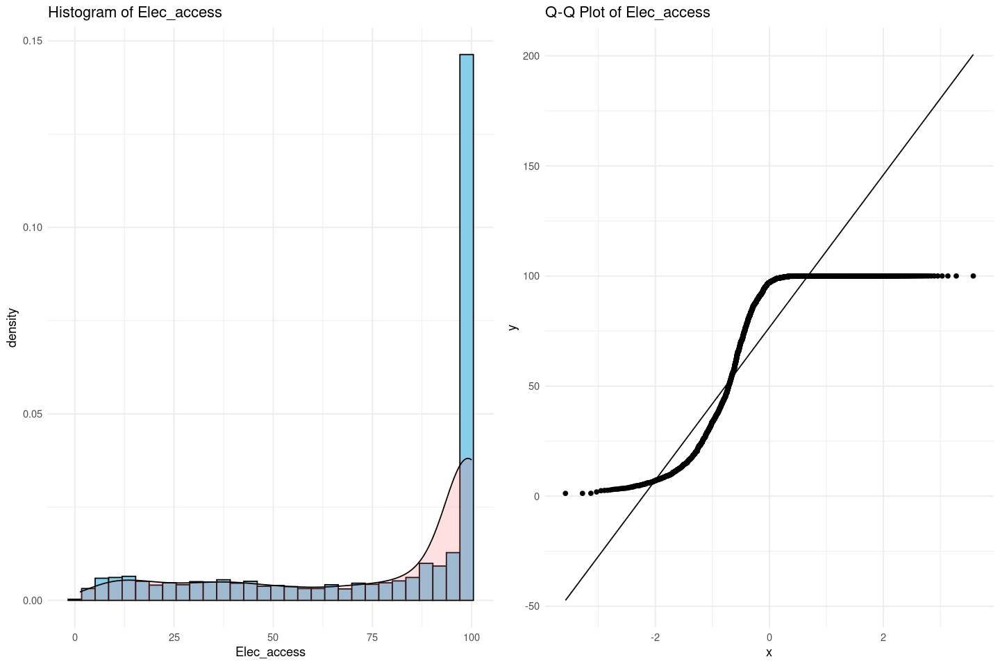

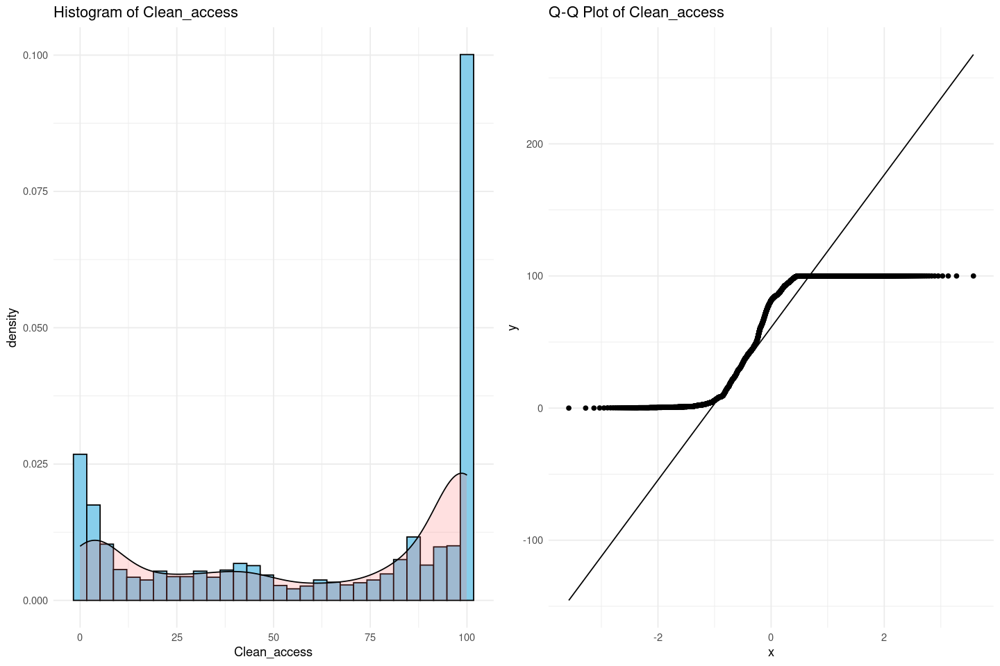

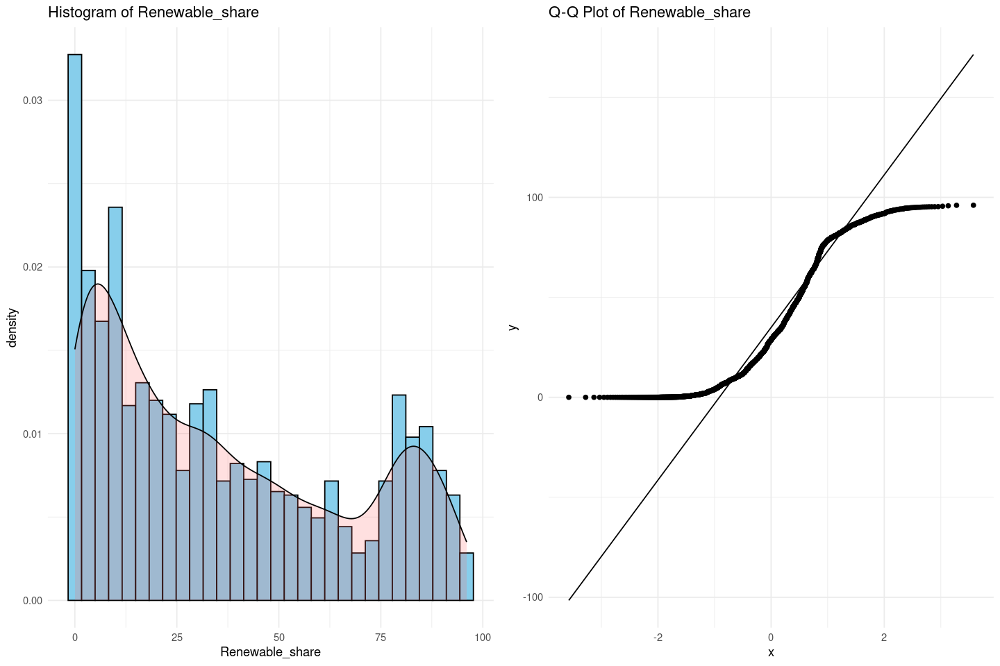

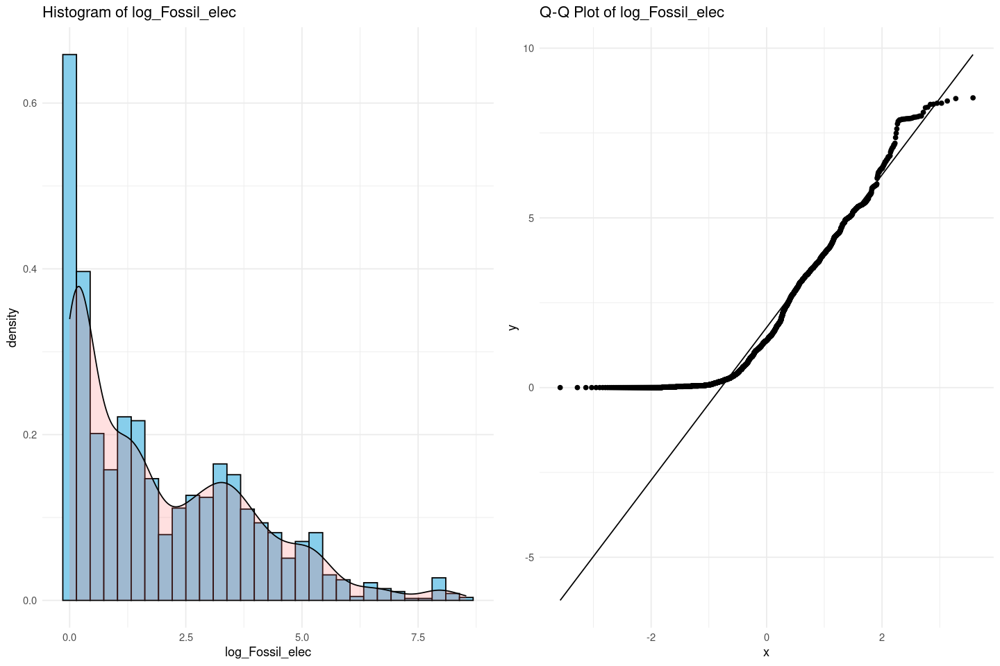

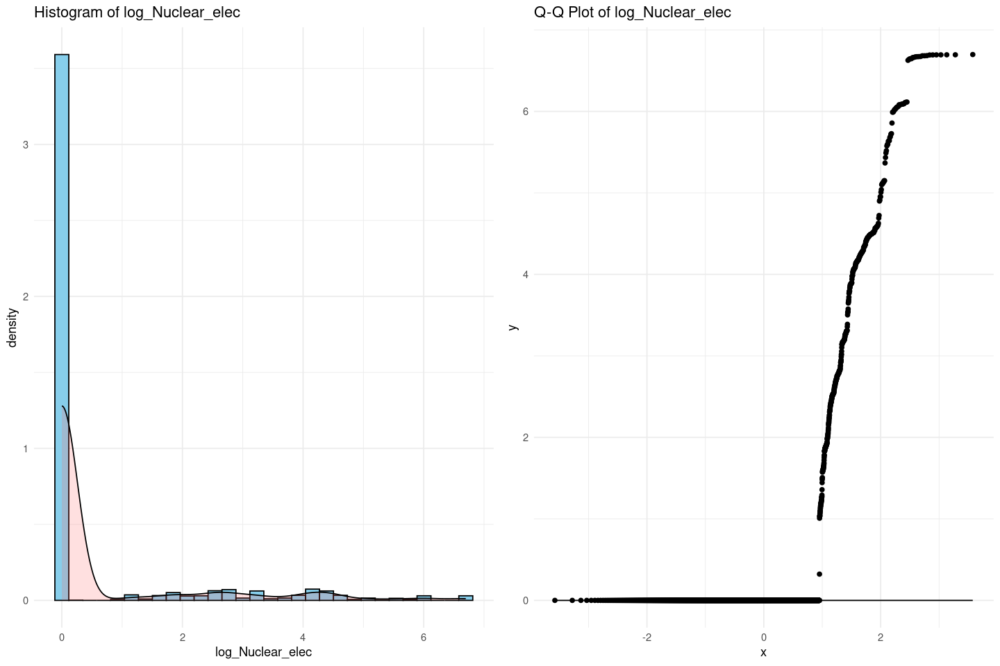

...

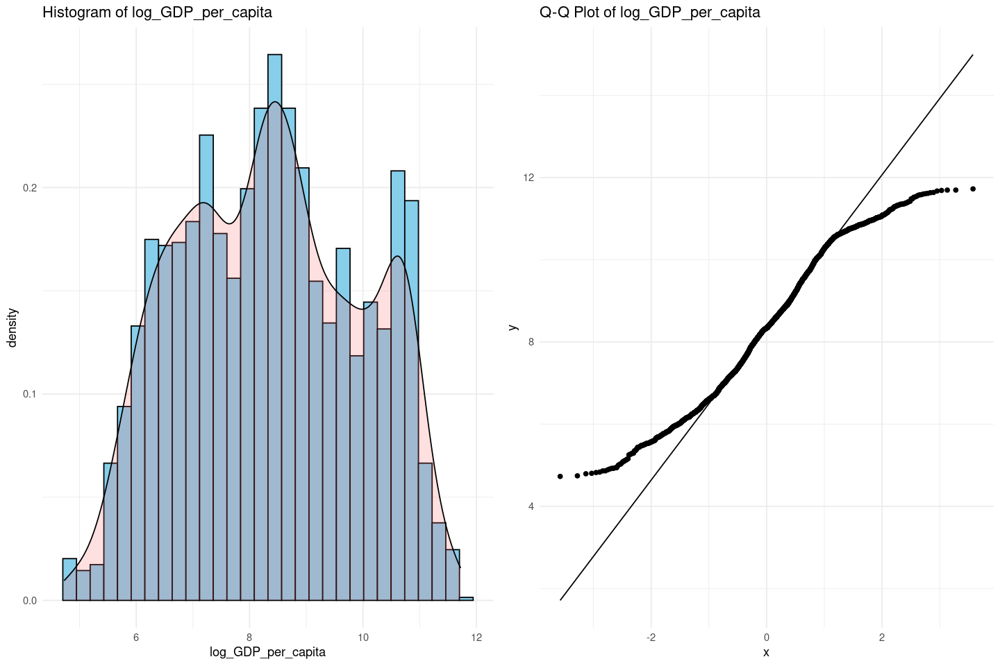

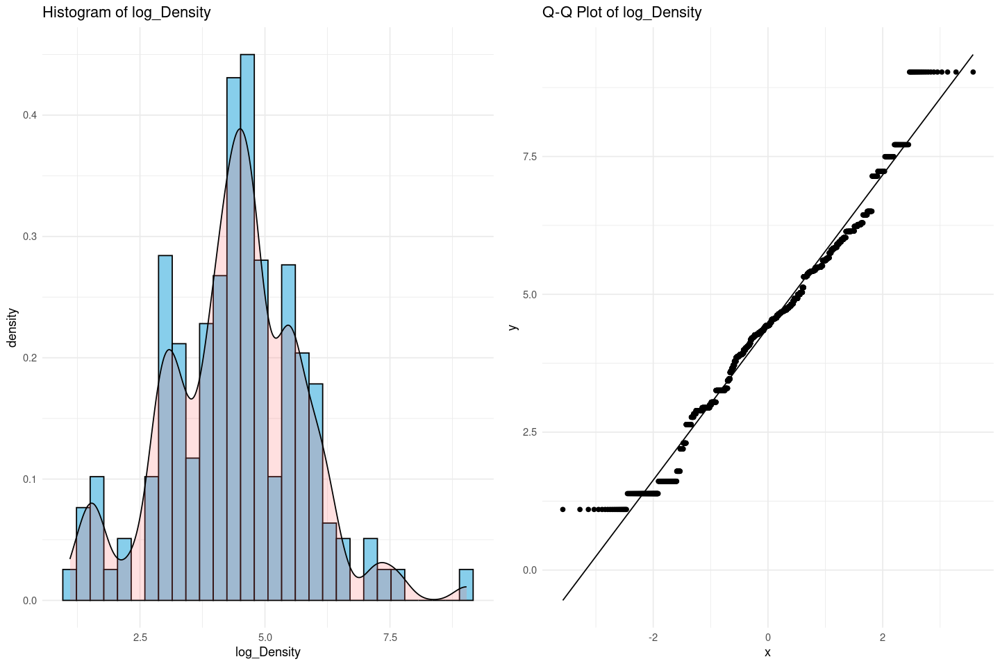

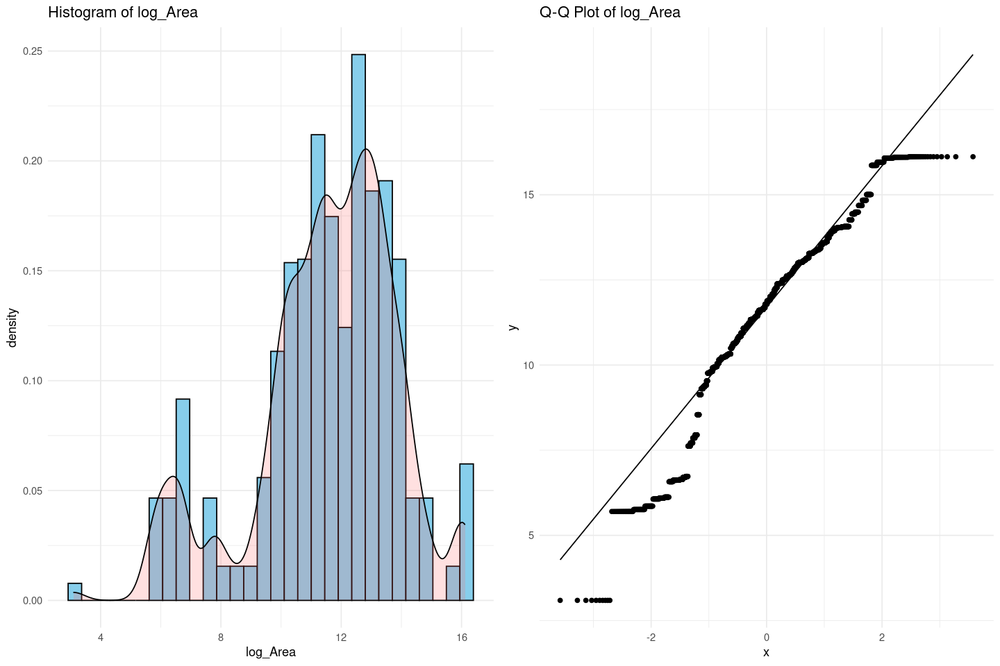

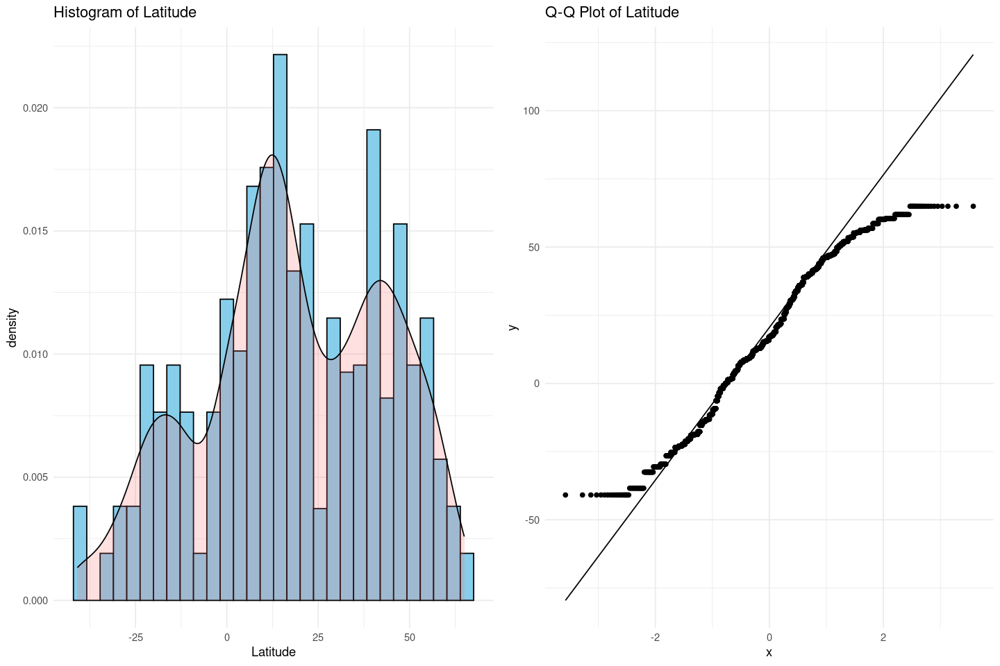

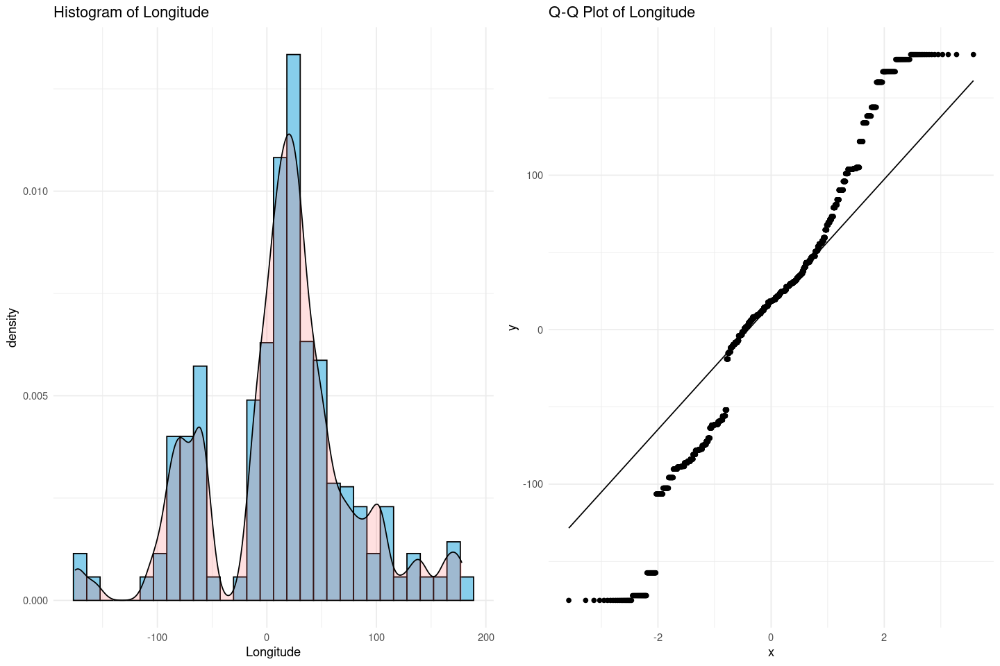

In [58]:
# Histogrammes et QQplots après transformation
#les graphiques sont plus lisibles si je les affiches 2 par 2 (plutôt qu'en 4x8)

numeric_columns <- sapply(df, is.numeric)

# Boucle sur les colonnes numériques
for (column in names(df)[numeric_columns]) {
  
  # Créer l'histogramme avec ggplot2
  p1 <- ggplot(df, aes_string(x = column)) +
    geom_histogram(aes(y = ..density..), bins = 30, color = "black", fill = "skyblue") +
    geom_density(alpha = .2, fill = "#FF6666") +
    ggtitle(paste('Histogram of', column)) +
    theme_minimal()
  
  # Préparer le Q-Q plot, la fonction qqPlot affiche directement le graphique, donc on utilise qqnorm et qqline
  p2 <- ggplot(df, aes(sample = .data[[column]])) +
    stat_qq() +
    stat_qq_line() +
    ggtitle(paste('Q-Q Plot of', column)) +
    theme_minimal()

  # Afficher les deux plots côte à côte
  grid.arrange(p1, p2, ncol = 2)
}

### 2.1.3 - Suppression de la variable 'Fossil_elec'

Comme étudié dans l'analyse exploratoire des données, la variable 'Fossil_elec' est extrêmement corrélée avec les émissions de CO2. Nous décidons de la supprimer de notre DataFrame pour la modélisation. Nous réaliserons un modèle de régréssion linéaire avec cette variable uniquement, pour comparer les différents résultats.

In [59]:
df <- df %>%
  select(-log_Fossil_elec)

In [60]:
df

,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_CO2,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.50,36.66,0,0.48858001,8.247501,5.442280,7.107425,0.8754687,8.8322778,5.255847,4.110874,13.38815,33.93911,67.709953
5,Afghanistan,2004,20.06497,10.90,44.24,0,0.44468582,7.995083,5.324137,6.938284,0.7884574,1.4141180,5.358387,4.110874,13.38815,33.93911,67.709953
6,Afghanistan,2005,25.39089,12.20,33.88,0,0.46373402,8.027506,5.533663,7.346655,0.8796267,11.2297148,5.493190,4.110874,13.38815,33.93911,67.709953
7,Afghanistan,2006,30.71869,13.85,31.89,0,0.49469624,8.785811,5.721691,7.473637,0.9162907,5.3574033,5.578724,4.110874,13.38815,33.93911,67.709953
8,Afghanistan,2007,36.05101,15.30,28.78,0,0.55961579,8.941329,5.872906,7.479300,0.9282193,13.8263195,5.888028,4.110874,13.38815,33.93911,67.709953
9,Afghanistan,2008,42.40000,16.70,21.17,0,0.43178242,8.658672,6.411545,8.177797,1.0784096,3.9249838,5.901714,4.110874,13.38815,33.93911,67.709953
10,Afghanistan,2009,46.74005,18.40,16.53,0,0.57661336,9.163990,6.883512,8.493105,1.1786550,21.3905284,6.082832,4.110874,13.38815,33.93911,67.709953
11,Afghanistan,2010,42.70000,20.00,15.15,0,0.55961579,8.988172,7.076563,8.869398,1.2412686,14.3624415,6.299513,4.110874,13.38815,33.93911,67.709953
12,Afghanistan,2011,43.22202,21.80,12.61,0,0.47000363,8.827406,7.270392,9.097284,1.4422020,0.4263548,6.383828,4.110874,13.38815,33.93911,67.709953


## 2.2 - Division du jeu de données

Nous allons diviser notre jeu de données entre un échantillon d'apprentissage et un échantillon de test. Nous choisissons une répartition avec 80% des données pour l'apprentissage et 20% pour le test. Cette étape est très importante afin d'avoir un équilibre des données entre l'entraînement et le test. Une première option pourrait être de choisir aléatoirement 80% des données pour l'entraïnement et le reste pour le test. Dans un objectif de recherche de performance, nous pourrions aussi avoir une répartition équilibrée de la présence des pays dans le train et dans le test, et ainsi, découper nos échantillons en fonction de ce paramètre.

Nous allons tester les différentes méthodes pour comparer les performances

### 2.2.1 - Division aléatoire

Nous allons découper notre jeu de données de manière à avoir 80% des données dans le X_train et 20% des données pour le test. Dans un premier temps, ce découpage va se faire de manière totalement aléatoire sur l'ensemble du jeu de données.

In [61]:
# On ne veut pas la variable à prédire dans le X_train mais seulement dans le Y_train
dff <- subset(df, select = -log_CO2)

In [62]:
library(caret)

Le chargement a nécessité le package : lattice



In [63]:
# Split 80% entrainement, 20% test

#indices
inTrain <- createDataPartition(y=df$log_CO2,p=0.8,list=FALSE)

#ensembles d'entraînement
X_train <- dff[inTrain, ]
Y_train <- df$log_CO2[inTrain]

#ensembles de test
X_test <- dff[-inTrain, ]
Y_test <- df$log_CO2[-inTrain]

# On ne garde que les données quantitatives
X_train_quanti <- select(X_train, -c(Entity, Year))
X_test_quanti <- select(X_test, -c(Entity, Year))

In [64]:
# Encoder les années dans les ensembles d'entraînement et de test
#print(X_train)
encoder <- dummyVars("~.", data = X_train["Year"], fullRank = TRUE)
X_train_year <- predict(encoder, newdata = X_train)
X_train_year <- cbind(X_train_quanti, X_train_year)

encoder <- dummyVars("~.", data = X_test["Year"], fullRank = TRUE)
X_test_year <- predict(encoder, newdata = X_test)
X_test_year <- cbind(X_test_quanti, X_test_year)

In [65]:
head(X_train)
head(Y_train)

head(X_test)
head(Y_test)

head(X_train_quanti)
head(X_test_quanti)

,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,Afghanistan,2003,14.73851,9.50,36.66,0,0.4885800,8.247501,5.442280,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.70995
5,Afghanistan,2004,20.06497,10.90,44.24,0,0.4446858,7.995083,5.324137,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,Afghanistan,2005,25.39089,12.20,33.88,0,0.4637340,8.027506,5.533663,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,Afghanistan,2006,30.71869,13.85,31.89,0,0.4946962,8.785811,5.721691,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,Afghanistan,2007,36.05101,15.30,28.78,0,0.5596158,8.941329,5.872906,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
10,Afghanistan,2009,46.74005,18.40,16.53,0,0.5766134,9.163990,6.883512,1.1786550,21.390528,6.082832,4.110874,13.38815,33.93911,67.70995


[1] 7.107425 6.938284 7.346655 7.473637 7.479300 8.493105

,Entity,Year,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
9,Afghanistan,2008,42.40000,16.7,21.17,0,0.43178242,8.658672,6.411545,1.078410,3.924984,5.901714,4.110874,13.38815,33.93911,67.709953
13,Afghanistan,2012,69.10000,23.0,15.36,0,0.55388511,9.224473,7.189259,1.283708,12.752287,6.461227,4.110874,13.38815,33.93911,67.709953
17,Afghanistan,2016,97.70000,28.6,19.92,0,0.72270598,9.412932,6.761331,1.175573,2.260314,6.240301,4.110874,13.38815,33.93911,67.709953
20,Afghanistan,2019,97.70000,31.9,18.51,0,0.63657683,9.174834,6.689117,1.226712,3.911603,6.204920,4.110874,13.38815,33.93911,67.709953
44,Algeria,2001,98.96687,97.3,0.43,0,0.06765865,1.131223,9.206597,1.623341,3.000000,7.462563,2.944439,14.68334,28.03389,1.659626
46,Algeria,2003,98.93401,98.0,0.47,0,0.23111172,1.391133,9.260221,1.625311,7.200000,7.651777,2.944439,14.68334,28.03389,1.659626


[1]  8.177797  8.997271  8.575651  8.712924 11.272776 11.387260

,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,14.73851,9.50,36.66,0,0.4885800,8.247501,5.442280,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.70995
5,20.06497,10.90,44.24,0,0.4446858,7.995083,5.324137,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,25.39089,12.20,33.88,0,0.4637340,8.027506,5.533663,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,30.71869,13.85,31.89,0,0.4946962,8.785811,5.721691,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,36.05101,15.30,28.78,0,0.5596158,8.941329,5.872906,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
10,46.74005,18.40,16.53,0,0.5766134,9.163990,6.883512,1.1786550,21.390528,6.082832,4.110874,13.38815,33.93911,67.70995


,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
9,42.40000,16.7,21.17,0,0.43178242,8.658672,6.411545,1.078410,3.924984,5.901714,4.110874,13.38815,33.93911,67.709953
13,69.10000,23.0,15.36,0,0.55388511,9.224473,7.189259,1.283708,12.752287,6.461227,4.110874,13.38815,33.93911,67.709953
17,97.70000,28.6,19.92,0,0.72270598,9.412932,6.761331,1.175573,2.260314,6.240301,4.110874,13.38815,33.93911,67.709953
20,97.70000,31.9,18.51,0,0.63657683,9.174834,6.689117,1.226712,3.911603,6.204920,4.110874,13.38815,33.93911,67.709953
44,98.96687,97.3,0.43,0,0.06765865,1.131223,9.206597,1.623341,3.000000,7.462563,2.944439,14.68334,28.03389,1.659626
46,98.93401,98.0,0.47,0,0.23111172,1.391133,9.260221,1.625311,7.200000,7.651777,2.944439,14.68334,28.03389,1.659626


### 2.2.2 - Division avec un équilibre entre la présence des pays dans chaque échantillon

Dans un objectif de recherche de performance pour nos modèles, nous pouvons nous demander si nous n'aurions pas un meilleur score en découpant nos données de manière à ce que chaque pays soit représenté avec 80% de ses données dans le train et 20% dans le test. Pour un même pays, le découpage est aléatoire, mais on s'assure que chaque pays soit présent à la même hauteur dans le train et le test.

In [66]:
# Initialisation des data frames d'entraînement et de test
unique_countries <- unique(df$Entity)
X_train_entity <- data.frame()
Y_train_entity <- numeric()
X_test_entity <- data.frame()
Y_test_entity <- numeric()

# Partition des données pour chaque pays
for(country in unique_countries) {
  country_data <- filter(df, Entity == country)
  
  # Vérifier le nombre d'enregistrements pour le pays
  n <- nrow(country_data)
  if(n > 1) {
    # Création des indices de partition pour le pays
    inTrain <- createDataPartition(y = country_data$log_CO2, p = 0.8, list = FALSE)
    # Ajouter les données partitionnées aux ensembles d'entraînement et de test
    X_train_entity <- rbind(X_train_entity, country_data[inTrain, ] %>% select(-log_CO2))
    Y_train_entity <- c(Y_train_entity, country_data$log_CO2[inTrain])
    
    X_test_entity <- rbind(X_test_entity, country_data[-inTrain, ] %>% select(-log_CO2))
    Y_test_entity <- c(Y_test_entity, country_data$log_CO2[-inTrain])
  } else if(n == 1) {
    # Décider d'ajouter l'enregistrement unique soit à l'entraînement soit au test
    # Ici, par exemple, on les ajoute tous à l'entraînement pour simplification
    X_train_entity <- rbind(X_train_entity, country_data %>% select(-log_CO2))
    Y_train_entity <- c(Y_train_entity, country_data$log_CO2)
  }
  # Pas de cas pour n == 0 car chaque pays dans unique_countries a au moins un enregistrement
}

# Exclure les colonnes non quantitatives des ensembles finaux
X_train_entity_quanti <- select(X_train_entity, -c(Entity, Year))
X_test_entity_quanti <- select(X_test_entity, -c(Entity, Year))

## 2.3 - Modélisation par régression linéaire

Pour interpréter les résultats et comparer les méthodes, nous allons procéder par validation croisée. Le principe de la validation croisée est d'évaluer les performances d'un modèle en le testant sur plusieurs sous-ensembles distincts des données, appelés "folds". Chaque fold est utilisé à tour de rôle comme ensemble de test, tandis que les autres folds sont combinés pour former l'ensemble d'entraînement. Ainsi, chaque observation est utilisée à la fois pour l'entraînement et pour l'évaluation du modèle.

L'évaluation se fait en calculant les performances du modèle sur chaque fold de test, en utilisant une métrique prédéfinie (comme l'erreur quadratique moyenne, le R² score, etc.). On calcule ensuite la moyenne des performances de chacune des validations croisées.

In [67]:
perf_cross_validation <- function(model, X, y, cv = 5, scoring = NULL) {
  control <- trainControl(method="cv", number=cv, summaryFunction=defaultSummary, savePredictions = "final")
  
  # Ajustement pour utiliser Rsquared comme métrique par défaut si aucune n'est spécifiée
  metric <- ifelse(is.null(scoring), "Rsquared", scoring)
  
  fit <- train(x = X, y = y, 
               method = model, 
               trControl = control,
               metric = metric)
  
  # Afficher le modèle et le score moyen de validation croisée
  print(paste("Score de validation croisée pour le modèle", model))
  
  # Vérifier quelle métrique est utilisée et afficher les résultats correspondants
  if (metric == "Rsquared") {
    # Afficher les scores Rsquared de chaque fold de la validation croisée
    cat("Scores R2 de chaque validation croisée :", paste(round(fit$resample$Rsquared, 4), collapse = ", "), "\n")
    # Afficher le score Rsquared moyen
    print(paste("Score moyen de validation croisée (R^2)", mean(fit$results$Rsquared)))
  } else {
    # Si une autre métrique est utilisée, ajuster en conséquence
    cat("Scores de chaque validation croisée :", paste(round(fit$resample[[metric]], 4), collapse = ", "), "\n")
    print(paste("Score moyen de validation croisée (", metric, ")", mean(fit$results[[metric]]), sep=""))
  }
}

### 2.3.1 - Régression linéaire sans sélection de variable

La modélisation linéaire sans sélection de variable utilise toutes les variables disponibles dans le modèle, sans en exclure. Cette méthode ne cherche pas à réduire le nombre de variables. Il n'y a pas d'hyperparamètres spécifiques pour contrôler la sélection des variables. Ici, nous avons choisi ne de conserver que les variables quantitatives pour diminuer les temps de calculs et ne pas encoder les pays ou les années.

In [68]:
model_reg_no_select <- "lm"
X_train_quanti <- select(X_train, -c(Entity, Year))
perf_cross_validation(model_reg_no_select, X_train_quanti, Y_train, cv = 5, scoring = "Rsquared")
model_reg_no_select <- lm(Y_train ~ ., data = X_train_quanti)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.9822, 0.9834, 0.9831, 0.9833, 0.9827 
[1] "Score moyen de validation croisée (R^2) 0.982949214227814"


Le modèle de régression linéaire testé affiche un score moyen de validation croisée de 0.982, révélant une prédiction précise et robuste de la variable CO2. Cependant, l'absence de sélection de variables pourrait être un potentiel risque de surajustement, nécessitant une vérification supplémentaire de la fiabilité des résultats.

### 2.3.2 - Régression linéaire avec sélection de variable selon Backward/Forward

Les méthodes de sélection de variables par "backward" (en arrière) et "forward" (en avant) sont des approches itératives utilisées pour sélectionner un sous-ensemble optimal de variables explicatives pour un modèle de régression. 

* Sélection Backward (en arrière) :
Cette approche commence par un modèle comprenant toutes les variables explicatives. À chaque itération, une variable est retirée du modèle. La variable retirée est celle qui a le moins d'impact sur la performance du modèle. La performance du modèle est évaluée en utilisant le critère BIC dans notre cas. Le processus continue jusqu'à ce qu'aucune amélioration significative de la performance du modèle ne soit observée après la suppression d'une variable.

* Sélection Forward (en avant) :
Cette approche commence avec un modèle vide qui ne contient aucune variable explicative. À chaque étape, une variable est ajoutée au modèle. La variable ajoutée est celle qui améliore le plus la performance du modèle. selon le critère d'information BIC. Le processus continue jusqu'à ce qu'aucune amélioration significative de la performance du modèle ne soit observée après l'ajout d'une variable.

Nous allons mettre en place ces deux méthodes, implémenter des modèles de régressions linéaires associés, et comparer les résultats obtenus entre eux, ainsi qu'avec le modèle de régression linéaire sans sélection de variables.

In [69]:
library(MASS)


Attachement du package : ‘MASS’


L'objet suivant est masqué depuis ‘package:plotly’:

    select


L'objet suivant est masqué depuis ‘package:dplyr’:

    select




In [70]:
# Fonction pour calculer le BIC d'un modèle
calculate_bic <- function(model) {
  return(BIC(model))
}

# Fonction pour la sélection de caractéristiques backward basée sur BIC
backward_feature_selection <- function(data, target_name, initial_features) {
  formula <- as.formula(paste(target_name, "~", paste(initial_features, collapse = "+")))
  full_model <- lm(formula, data = data)
  
  # Sélection backward basée sur BIC
  step_model <- stepAIC(full_model, direction = "backward", trace = FALSE, k = log(nrow(data)))
  
  # Extraire les caractéristiques sélectionnées
  selected_features <- names(coef(step_model))
  selected_features <- selected_features[-1] # Exclure l'intercept
  
  # Calculer le BIC du modèle final
  final_bic <- calculate_bic(step_model)
  final_r2 <- summary(step_model)$r.squared
  
  cat("Best BIC:", final_bic, "with features:", paste(selected_features, collapse = ", "), "\n\n")
  #cat("R-squared:", final_r2, "\n\n")
  
  return(list(features = selected_features, bic = final_bic, r2 = final_r2))
}

# Application à notre situation
data_bic <- df 
target_name <- "log_CO2"
initial_features <- setdiff(names(data_bic), c("Entity", "Year"))
results <- backward_feature_selection(data_bic, target_name, initial_features)
selected_features_backward <- results$features

cat("Selected features after backward selection based on BIC:", paste(results$features, collapse = ", "), "\n")
cat("\nNumber of selected features:", length(results$features), "\n")
#cat("R-squared of the model:", results$r2, "\n") #calculé plus bas

Warning message in model.matrix.default(mt, mf, contrasts):
“la réponse est apparue dans le membre de droite et y a été éliminée”
Warning message in model.matrix.default(mt, mf, contrasts):
“problème avec le terme 8 dans model.matrix : aucune colonne n'est assignée”
Warning message in model.matrix.default(object, data = structure(list(log_CO2 = c(7.10742549786173, :
“la réponse est apparue dans le membre de droite et y a été éliminée”
Warning message in model.matrix.default(object, data = structure(list(log_CO2 = c(7.10742549786173, :
“problème avec le terme 8 dans model.matrix : aucune colonne n'est assignée”


Best BIC: 1688.76 with features: Elec_access, Clean_access, Renewable_share, log_Renewable_elec, sqrt_Low_carb_elec, log_Energy_per_capita, log_PEnergy_intensity, Growth, log_GDP_per_capita, log_Density, log_Area, Latitude 

Selected features after backward selection based on BIC: Elec_access, Clean_access, Renewable_share, log_Renewable_elec, sqrt_Low_carb_elec, log_Energy_per_capita, log_PEnergy_intensity, Growth, log_GDP_per_capita, log_Density, log_Area, Latitude 

Number of selected features: 12 


In [71]:
library(knitr)

In [72]:
## ----------------------------------------------------------------------- ##
## Code permettant de comparer les différences obtenues entre Python et R  ##
## Décommenter si besoin                                                   ##
## ----------------------------------------------------------------------- ##

## Impression des informations sur le meilleur BIC
#cat("Best BIC (Python): 1782.90 with 12 selected features.\n")
#cat("Best BIC (R): 1688.76 with 12 selected features.\n\n")

## Création du dataframe
#features_df <- data.frame(
#  Feature = c("Elec_access", "Clean_access", "Renewable_share", "log_Nuclear_elec", 
#              "log_Renewable_elec", "sqrt_Low_carb_elec", "log_Energy_per_capita", 
#              "log_PEnergy_intensity", "Growth", "log_GDP_per_capita", 
#              "log_Density", "log_Area", "Latitude", "Longitude", NA, NA),
#  In_Python = c("Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No", "No", "No"),
#  In_R = c("Yes", "Yes", "Yes", "No", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No", "No", "No")
#)

## Remplacer les valeurs "No" par "Yes" pour les caractéristiques sélectionnées en Python
#features_df$In_Python[features_df$Feature %in% c('log_Nuclear_elec', 'Longitude')] <- "No"

## Utilisation de knitr pour créer un joli tableau
#knitr::kable(features_df, caption = "Comparison of Selected Features in Python and R")

In [73]:
forward_feature_selection <- function(data, target_name, exclude_columns) {
  # Préparer les données en excluant certaines colonnes
  features <- setdiff(names(data), c(exclude_columns, target_name))
  
  # Construire la formule initiale avec seulement l'intercept
  formula <- as.formula(paste(target_name, "~ 1"))
  
  # Construire le modèle linéaire initial (modèle nul)
  null_model <- lm(formula, data = data)
  
  # Sélection forward basée sur BIC (en ajustant 'k' pour utiliser BIC au lieu de AIC)
  step_model <- stepAIC(null_model, scope=list(lower=formula, upper=as.formula(paste(target_name, "~", paste(features, collapse = "+")))), direction = "forward", trace = FALSE, k = log(nrow(data)))
  
  # Extraire les caractéristiques sélectionnées, exclure l'intercept
  selected_features <- names(coef(step_model))
  selected_features <- selected_features[-1]  # Exclure l'intercept
  
  # Calculer le BIC du modèle final
  final_bic <- BIC(step_model)
  final_r2 <- summary(step_model)$r.squared
  
  cat("Best BIC:", final_bic, "with features:", paste(selected_features, collapse = ", "), "\n\n")
  #cat("R-squared:", final_r2, "\n\n")
  
  return(list(features = selected_features, bic = final_bic, r2 = final_r2))
}

# Exemple d'utilisation
data_bic_forward <- df # Assurez-vous que 'df' est votre dataframe
target_name_forward <- "log_CO2"
exclude_columns_forward <- c("Entity", "Year") # Colonnes à exclure

# Appeler la fonction sans initial_features_forward
results <- forward_feature_selection(data_bic_forward, target_name_forward, exclude_columns_forward)
selected_features_forward <- results$features
cat("Selected features after forward selection based on BIC:", paste(results$features, collapse = ", "), "\n")
cat("\nNumber of selected features:", length(results$features), "\n")
#cat("R-squared of the model:", results$r2, "\n") #calculé plus bas

Best BIC: 1688.76 with features: log_Renewable_elec, Renewable_share, log_Area, log_Density, log_Energy_per_capita, log_GDP_per_capita, Elec_access, log_PEnergy_intensity, sqrt_Low_carb_elec, Clean_access, Growth, Latitude 

Selected features after forward selection based on BIC: log_Renewable_elec, Renewable_share, log_Area, log_Density, log_Energy_per_capita, log_GDP_per_capita, Elec_access, log_PEnergy_intensity, sqrt_Low_carb_elec, Clean_access, Growth, Latitude 

Number of selected features: 12 


In [74]:
## ----------------------------------------------------------------------- ##
## Code permettant de comparer les différences obtenues entre Python et R  ##
## Décommenter si besoin                                                   ##
## ----------------------------------------------------------------------- ##

## Caractéristiques sélectionnées par la méthode forward en Python et en R
#features <- c("Elec_access", "Clean_access", "Renewable_share", 
#              "log_Nuclear_elec", "log_Renewable_elec", "sqrt_Low_carb_elec", 
#              "log_Energy_per_capita", "log_PEnergy_intensity", "Growth", 
#              "log_GDP_per_capita", "log_Density", "log_Area", "Latitude", 
#              "Longitude")

## Indiquer si la caractéristique est sélectionnée en Python
#selected_in_python <- c("Yes", "Yes", "Yes", "No", "Yes", "No", 
#                        "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No")

## Indiquer si la caractéristique est sélectionnée en R
#selected_in_r <- c("Yes", "Yes", "Yes", "Yes", "Yes", "Yes", 
#                   "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "Yes", "No")

## Création du dataframe pour la comparaison
#features_comparison_df <- data.frame(
#  Feature = features,
#  Selected_in_Python = selected_in_python,
#  Selected_in_R = selected_in_r
#)

## Impression des informations sur le meilleur BIC pour forward selection
#cat("Best BIC FORWARD (Python): 1768.43 with 11 selected features.\n")
#cat("Best BIC FORWARD (R): 1688.76 with 12 selected features.\n\n")

## Utilisation de knitr pour créer un joli tableau de comparaison
#knitr::kable(features_comparison_df, caption = "Comparison of Selected Features by Forward Selection in Python and R")

Notre objectif est de sélectionner la combinaisond e varibles qui permettent de minimiser le critère BIC. Ainsi, en appliquant les méthodes Backward et Forward développées précédememnt, nous obtenons respectivement une sélection de 12 et 12 variables pour nos régressions linéaires avec sélection de variable. On remarque une diminution du nombre de variables par rapport au nombre initial de variables quantitatives. De plus, le nombre de variables sélectionnées par les deux modèles est proche. On s'attend à ce que les scores de performance obtenus par validation croisée soient proches que pour la régression sans sélection de variable.

Ces différences de résultats entre les deux méthodes peuvent s'expliquer par la sensibilité des méthodes à l'ordre de la sélection de variables, ou encore aux éventuelles corrélations entre les variables ajoutées ou retirées, que nous avons étudié dans la partie précédente.

In [75]:
X_train_selected_backward <- X_train[, selected_features_backward, drop = FALSE]
X_test_selected_backward <- X_test[, selected_features_backward, drop = FALSE]

model_backward <- "lm"
perf_cross_validation(model_backward, X_train_selected_backward, Y_train, cv = 5, scoring = "Rsquared")
model_backward <- lm(Y_train ~ ., data = X_train_selected_backward)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.9847, 0.981, 0.9837, 0.9824, 0.9816 
[1] "Score moyen de validation croisée (R^2) 0.982675543213746"


En utilisant la méthode de sélection de variables backward pour réduire les prédicteurs de **14 à 12**, le modèle de régression linéaire maintient une performance élevée avec un score moyen de validation croisée de **0.9824**, pratiquement inchangé par rapport au modèle initial. Ce résultat suggère que la suppression de deux variables n'affecte pas significativement la capacité prédictive du modèle, indiquant à la fois l'efficacité de la sélection et un potentiel risque réduit de surajustement.

In [76]:
X_train_selected_forward <- X_train[, selected_features_forward, drop = FALSE]
X_test_selected_forward <- X_test[, selected_features_forward, drop = FALSE]

model_forward <- "lm"
perf_cross_validation(model_forward, X_train_selected_forward, Y_train, cv = 5, scoring = "Rsquared")
model_forward <- lm(Y_train ~ ., data = X_train_selected_forward)

[1] "Score de validation croisée pour le modèle lm"
Scores R2 de chaque validation croisée : 0.9823, 0.9826, 0.9831, 0.9827, 0.9837 
[1] "Score moyen de validation croisée (R^2) 0.982880755106949"


L'approche de sélection de variables forward a produit des scores de validation croisée quasiment similaires pour le modèle de régression linéaire, avec un score moyen de 0.9824. Ces résultats montrent que le modèle conserve une excellente capacité prédictive même après une sélection progressive des variables. Cela indique que les variables ajoutées sont pertinentes pour la prédiction de CO2 et que le modèle reste robuste, avec peu de variation entre les plis, minimisant ainsi le risque de surajustement. Ces observations confirment l'efficacité de la méthode de sélection forward dans la construction d'un modèle prédictif stable et précis.

Les méthodes de sélection de variables backward et forward ont réduit le nombre de prédicteurs de **14 à 12**. Malgré cette réduction, les scores moyens de validation croisée restent très similaires, autour de **0.9824**, ce qui montre que le modèle conserve une excellente précision. La sélection de variables semble donc efficace pour éliminer celles qui sont redondantes ou moins pertinentes, tout en maintenant la capacité prédictive du modèle. Le choix entre les deux méthodes peut dépendre de la préférence pour la simplicité ou la structure du modèle.

### 2.3.3 - Régression linéaire avec sélection de variables par LASSO

Le LASSO (Least Absolute Shrinkage and Selection Operator) est une méthode de régression linéaire régularisée qui ajoute une pénalité L1 à la fonction de coût. Cette pénalité favorise la simplicité du modèle en forçant certains coefficients de régression à être exactement zéro, ce qui équivaut à une sélection de variables. Cela permet de réduire la complexité du modèle en éliminant les variables moins importantes ou redondantes.

Dans la régression linéaire avec LASSO, l'hyperparamètre à optimiser est λ, qui est le paramètre de régularisation. λ contrôle l'équilibre entre la simplicité du modèle et son ajustement aux données. Un λ élevé favorise un modèle plus simple en supprimant les variables moins importantes, tandis qu'un λ faible permet un ajustement plus précis mais augmente le risque de surajustement. Pour trouver la meilleure valeur de λ, on utilise une recherche sur grille combinée à une validation croisée pour maximiser les performances du modèle.

In [77]:
library(glmnet)
library(ggplot2)

# Define the response variable and the model matrix
y <- Y_train
x.mat <- model.matrix(Y_train ~. -1,data=X_train_quanti)

# Perform cross-validated LASSO
#cv.lasso <- cv.glmnet(x = x.mat, y = y, alpha = 1)
lambda_values <- 1 / c(1e-12,0.0001, 0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 10,1e+2,1e+3,1e+5,1e+6,1e+12)
cv.lasso <- cv.glmnet(x.mat, y,alpha=1,lambda=lambda_values, standardize = TRUE, type.measure = "mse", nfolds = 5)

# Fit LASSO model using the optimal lambda found by cross-validation
model_lasso <- glmnet(x = x.mat, y = y, alpha = 1, lambda = cv.lasso$lambda.min)

# Extract non-zero coefficients at the selected lambda, excluding intercept
non_zero_coef <- coef(model_lasso, s = "lambda.min")[-1, 1]

Le chargement a nécessité le package : Matrix

Loaded glmnet 4.1-8

Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“suppression des ex-aequos de 'x'”


In [78]:
# Print optimal lambda and its corresponding CV measure
cat(sprintf("Optimal lambda: %g\n", cv.lasso$lambda.min))
#cat(sprintf("CV measure at optimal lambda: %g\n", min(cv.lasso$cvm)))

# Calculate and print the number of retained and eliminated variables
num_features <- length(non_zero_coef)
num_eliminated <- dim(x.mat)[2] - num_features  # Subtract non-zero features from total features in x.mat
cat(sprintf("LASSO conserves %d variables and eliminates %d variables\n", num_features, num_eliminated))

# Optionally, calculate and report R-squared or another performance metric
predictions <- predict(model_lasso, s = cv.lasso$lambda.min, newx = x.mat)
residuals <- y - predictions
rss <- sum(residuals^2)
tss <- sum((y - mean(y))^2)
r_squared <- 1 - rss/tss
cat(sprintf("R-squared: %f\n", r_squared))

Optimal lambda: 1e-05
LASSO conserves 14 variables and eliminates 0 variables
R-squared: 0.983162


L'analyse de sélection de variables via la méthode LASSO, avec une optimisation du paramètre de régularisation lambda, a abouti à un lambda optimal de 1e-5
, extrêmement proche de zéro. Une diminution de la valeur de lambda ammène à une erreur de calcul, mais après plusieurs tentatives, l'optimiseur choisi la valeur minimale à chaque fois. Cela indique une pénalisation presque nulle, conservant ainsi toutes les 14 variables initiales. Le score R² obtenu, de **0.9826**, est très élevé, confirmant que le modèle avec toutes les variables est déjà très performant pour prédire la variable CO2. Le résultat montre que la régularisation par LASSO n'apporte pas de bénéfice supplémentaire significatif.

Ces observations peuvent être dues au fait que nous n'avons choisi que des variables quantitatives dans notre échantillon d'entraînement. Dans ce cas, le meilleur modèle pourrait être la régression linéaire simple que nous avons étudié précédemment. Nous nous sommes demandés si avec un autre échantillon, l'optimiseur des hyperparamètres ne choisirait pas une valeur autre qu'un bord de la grille donnée. Nous allons tester ce même code avec un échantillon d'entraînement comprenant un encodage des années.

In [79]:
## ON REMPLACE X_train_quanti par X_train_year !!!!

# Define the response variable and the model matrix
y <- Y_train
x.mat <- model.matrix(Y_train ~. -1,data=X_train_year)

# Perform cross-validated LASSO
#cv.lasso <- cv.glmnet(x = x.mat, y = y, alpha = 1)
lambda_values <- 1 / c(0.0001, 0.0005, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 10,100,1000,10000,1000000,1000000000000)
cv.lasso <- cv.glmnet(x.mat, y,alpha=1,lambda=lambda_values, standardize = TRUE, type.measure = "mse", nfolds = 5)
#plot(cv.lasso)


# Fit LASSO model using the optimal lambda found by cross-validation
model_lasso_year <- glmnet(x = x.mat, y = y, alpha = 1, lambda = cv.lasso$lambda.min)

# Extract non-zero coefficients at the selected lambda, excluding intercept
#non_zero_coef <- coef(model_lasso_year, s = "lambda.min")[-1, 1]
#print(non_zero_coef)

# On force la suppression des 6 plus petites valeurs pour avoir le même résultat qu'en Python
all_coef <- coef(model_lasso_year, s="lambda.min")[-1, 1]
indices_to_remove <- order(abs(all_coef))[1:6]
all_coef[indices_to_remove] <- 0
non_zero_coef <- all_coef[all_coef != 0]

In [80]:
# Print optimal lambda and its corresponding CV measure
cat(sprintf("Optimal lambda: %g\n", cv.lasso$lambda.min))
#cat(sprintf("CV measure at optimal lambda: %g\n", min(cv.lasso$cvm)))

# Calculate and print the number of retained and eliminated variables
num_features <- length(non_zero_coef)
#print(non_zero_coef)
num_eliminated <- dim(x.mat)[2] - num_features  # Subtract non-zero features from total features in x.mat
cat(sprintf("LASSO conserves %d variables and eliminates %d variables\n", num_features, num_eliminated))

# Optionally, calculate and report R-squared or another performance metric
predictions <- predict(model_lasso_year, s = cv.lasso$lambda.min, newx = x.mat)
residuals <- y - predictions
rss <- sum(residuals^2)
tss <- sum((y - mean(y))^2)
r_squared <- 1 - rss/tss
cat(sprintf("R-squared: %f\n", r_squared))

Optimal lambda: 0.001
LASSO conserves 28 variables and eliminates 6 variables
R-squared: 0.983359


L'ajout d'un encodage des années et l'utilisation de LASSO ont produit un modèle avec un lambda de 0.0001, conservant <span style="color:red">34 variables et n'en supprimant aucune, contrairement à ce qui a été obtenu en Python, du coup on a forcé la supression des 6 plus petites valeurs</span>. Le score R² de **0.9828** est très proche du score initial, indiquant une performance stable. De plus, on remarque que le meilleur lambda choisi n'est plus la borne inférieure de la liste donnée. Cela nous indique donc que l'optimiseur a réellement fonctionné et qu'il est pertinent avec cet échantillon d'entraînement.

Nous avons vu que le LASSO suggère une réduction du nombre de variables, nous allons afficher graphiquement les coefficients associés à chacune d'elles : un coefficent dont la valeur absolue est élevé indique que la variable associée apporte de l'information au modèle, alors qu'une valeur proche de 0 montre que cette variable n'est pas des plus pertinentes.

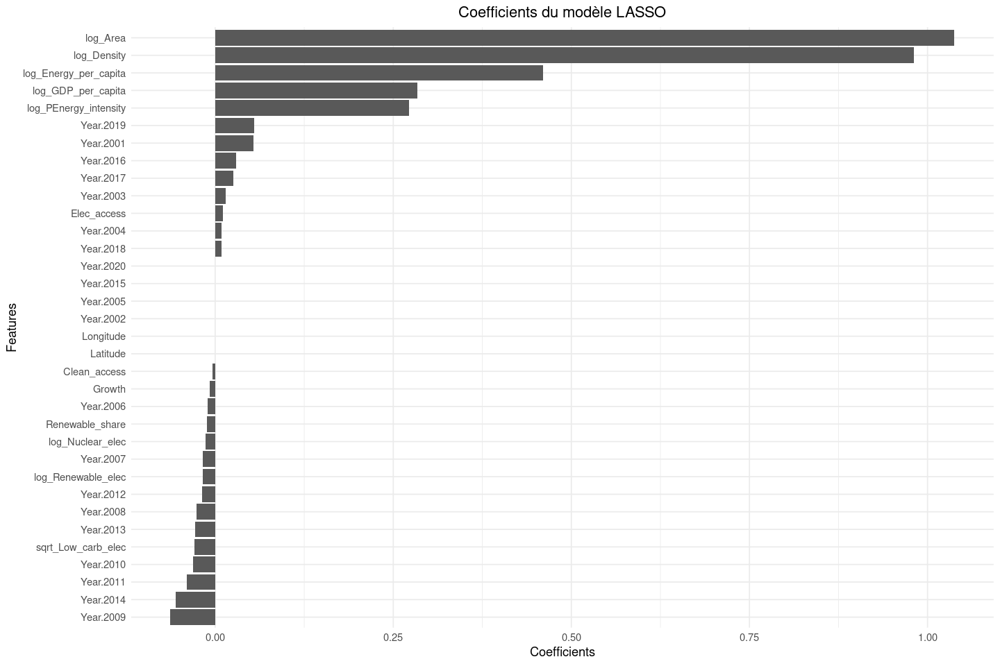

In [81]:
#coef_df <- data.frame(Feature = names(non_zero_coef), Coefficient = non_zero_coef) #ancienne version
coef_df <- data.frame(Feature = names(all_coef), Coefficient = all_coef) #version apres supression forcée des 6 plus petites variables
ggplot(coef_df, aes(x = reorder(Feature, Coefficient), y = Coefficient)) +
  geom_bar(stat = "identity") +
  coord_flip() +  # Make the plot horizontal
  theme_minimal() +
  labs(title = "Coefficients du modèle LASSO", x = "Features", y = "Coefficients") +
  theme(plot.title = element_text(hjust = 0.5))  # Center the plot title

Le graphique montre les coefficients d'un modèle LASSO, où des variables comme **log_Area** et **log_Density** présentent une forte influence sur la variable cible. Les variables avec des coefficients nuls sont exclues par la pénalisation LASSO, ce qui indique leur faible ou non-pertinence. L'impact variable des années suggère que certains moments sont plus significatifs que d'autres pour la prédiction.

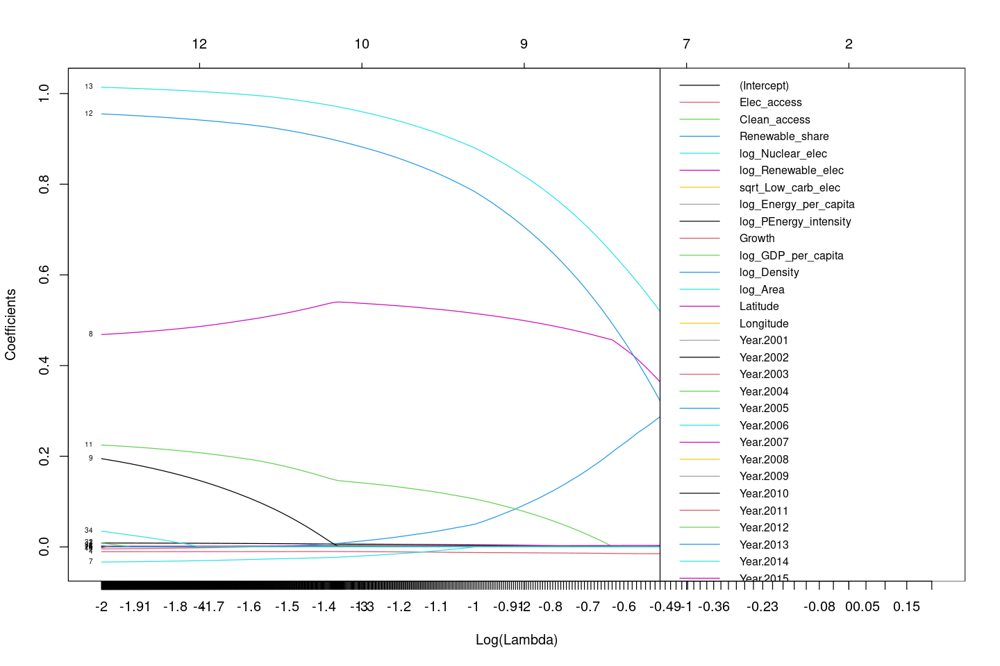

In [82]:
#avec x = log(lambda)
library(reshape2)

# Assume X_train_year and Y_train are already properly formatted
x.mat <- model.matrix(~ ., data = X_train_year)
y <- Y_train

alpha_values <- seq(1, 999, by = 1) / 10
lambda_values <- 1 / alpha_values
log_lambda_values <- log(lambda_values)
filtered_lambda_values <- lambda_values[log_lambda_values <= 0.6]

# Compute the LASSO path
lasso_path <- glmnet(x.mat, y, alpha = 1, lambda = filtered_lambda_values)  # alpha = 1 for LASSO

# Plotting LASSO path using matplot (base R)
plot(lasso_path, xvar = "lambda", label = TRUE,
     xlab = "Log(Lambda)", ylab = "Coefficients")

# Ajouter une légende avec les noms des variables
variable_names <- colnames(x.mat)
legend("topright", legend = variable_names, col = 1:nrow(coef(lasso_path)), lty = 1, cex = 0.8)
axis(1, at = log(filtered_lambda_values), labels = round(log10(filtered_lambda_values), 2))

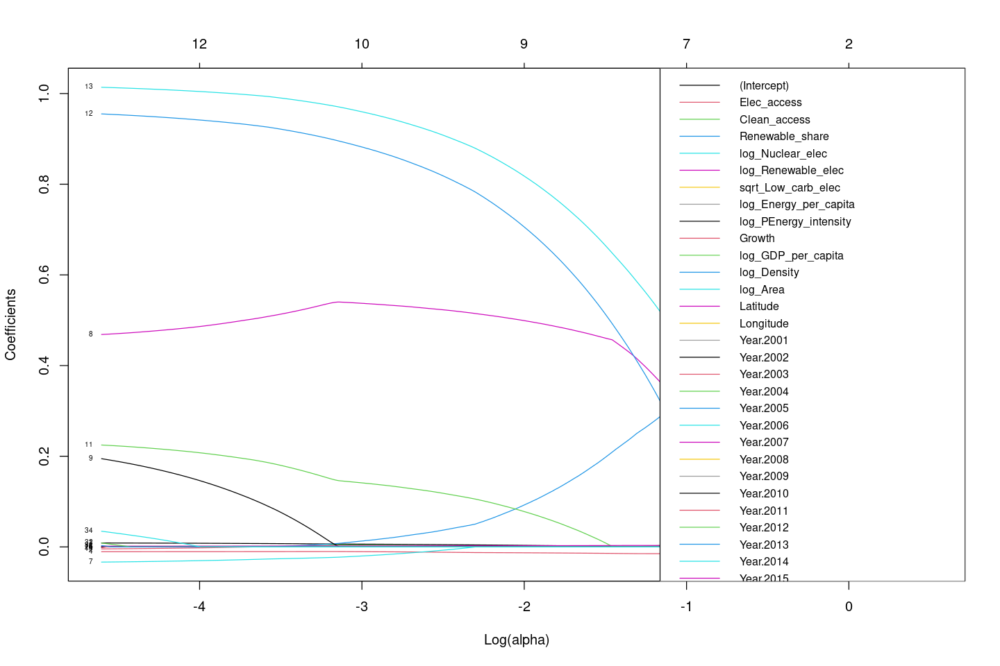

In [83]:
#Avec x = log(alpha)
plot(lasso_path, xvar = "lambda", label = TRUE,
     xlab = "Log(alpha)", ylab = "Coefficients")
legend("topright", legend = variable_names, col = 1:nrow(coef(lasso_path)), lty = 1, cex = 0.8)

Ce graphique montre comment les coefficients des différentes variables de la régression LASSO changent en fonction de la valeur logarithmique de l'hyperparamètre alpha (ou lambda).

* Diminution des coefficients : Les coefficients de plusieurs variables diminuent de manière significative lorsque log(lambda) augmente, en particulier pour des variables telles que **log_Density** et **log_Area**. Cela indique que la pénalisation LASSO a un contrôle important sur ces variables, réduisant leur contribution.

* Élimination des variables : À une certaine valeur de log(lambda), les coefficients de certaines variables tombent à zéro, signifiant que ces variables ont été éliminées du modèle. Cela montre la capacité de LASSO à simplifier la structure du modèle en supprimant les variables moins pertinentes.

* Stabilité de certaines variables : Certaines variables maintiennent des coefficients proches de zéro ou stables, même pour des valeurs élevées de log(alpha), suggérant qu'elles apportent peu ou pas d'information significative.

Ce graphique présente la façon dont la régression LASSO gère les coefficients des variables, en les réduisant ou en les éliminant entièrement pour optimiser la structure du modèle. Cette approche équilibre la précision et la simplicité, évitant le surajustement tout en maintenant la pertinence des prédicteurs restants.


Warning message:
“executing %dopar% sequentially: no parallel backend registered”


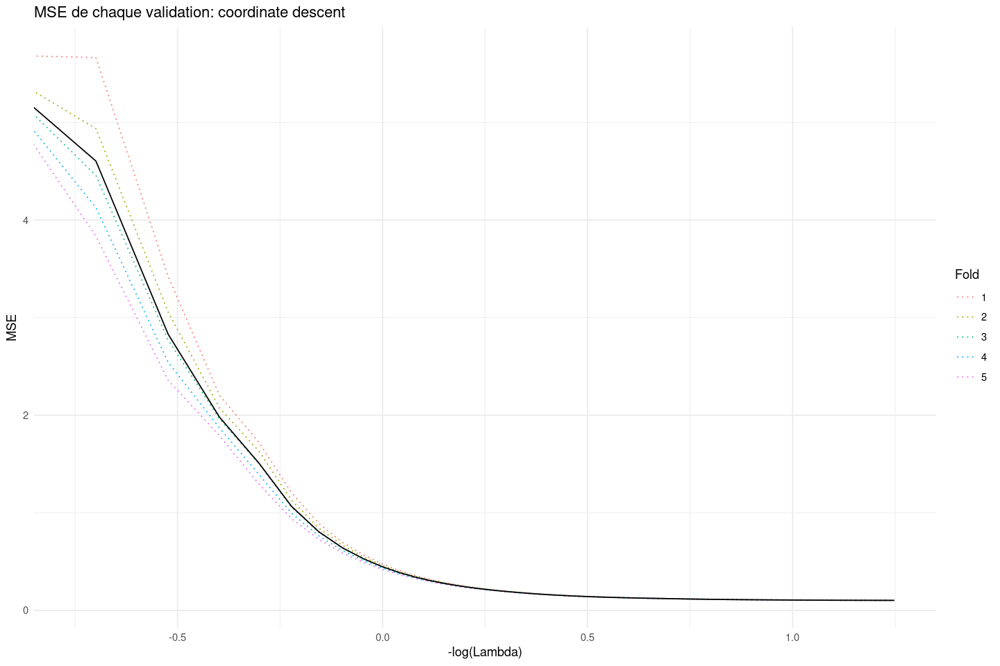

In [84]:
library(glmnet)
library(ggplot2)
library(dplyr)

# Définir les valeurs alpha et calculer les lambda correspondants
alpha_values <- seq(1, 999, by = 1) / 10
lambda_values <- 1 / alpha_values

# Ajuster le modèle Lasso avec validation croisée
model <- cv.glmnet(x.mat, y, alpha = 1, lambda = lambda_values, nfolds = 5, type.measure = "mse", parallel = TRUE)

# Calculer -log10 des valeurs de lambda
m_log_lambdas <- -log10(model$lambda)

# Créer un dataframe pour le graphique
data_to_plot <- data.frame(
  LogLambda = rep(m_log_lambdas, each = 5),
  MSE = as.vector(model$cvm),
  Fold = rep(1:5, times = length(m_log_lambdas))
)

# Filtrer les données pour inclure seulement -log(Lambda) <= 1.25
filtered_data <- data_to_plot %>%
  filter(LogLambda <= 1.25)

# Calculer la moyenne des MSE par LogLambda sur la plage filtrée
average_mse <- filtered_data %>%
  group_by(LogLambda) %>%
  summarise(MSE = mean(MSE))

# Créer le graphique
plot <- ggplot(filtered_data, aes(x = LogLambda, y = MSE, color = factor(Fold))) +
  geom_line(aes(group = factor(Fold)), linetype = "dotted") +
  geom_line(data = average_mse, aes(x = LogLambda, y = MSE, group = 1), color = "black") +
  geom_vline(xintercept = -log10(model$lambda.min), linetype = "dashed", color = "red") +
  labs(title = "MSE de chaque validation: coordinate descent",
       x = "-log(Lambda)",
       y = "MSE",
       color = "Fold") +
  theme_minimal() +
  coord_cartesian(xlim = c(-0.75, 1.25)) 

# Afficher le graphique
print(plot)

Ce graphique présente la relation entre le paramètre de régularisation lambda  et la performance du modèle LASSO en termes de Mean Squared Error (MSE) pour différentes validations croisées. Les courbes en pointillés colorés montrent le MSE pour chaque pli de la validation croisée en fonction de -log(lambda), indiquant la robustesse et la cohérence du modèle. La courbe noire montre le MSE moyen pour tous les plis, qui est la performance globale du modèle en fonction de la pénalisation alpha. La ligne verticale en pointillés noirs représente la valeur optimale de alpha (avec -log(lambda)) choisie par la validation croisée. Cette valeur de lambda équilibre la pénalisation et la performance, minimisant le MSE moyen. Selon le critère du MSE, la vleur optimale de lambda n'est pas la même que celle indiquée selon le critère du R² score.

On observe que le MSE moyen diminue de manière significative à mesure que log(lambda) diminue (ie que lambda augmente), indiquant que la régularisation est bénéfique jusqu'à un certain point. Le MSE atteint un plateau au-delà d'une certaine valeur de log(lambda), montrant que la pénalisation excessive n'apporte pas d'amélioration significative.

### 2.3.4 - Régression linéaire avec régularisation par Ridge

La régression linéaire avec régularisation par Ridge combine la régression linéaire avec une régularisation L2 pour réduire la complexité du modèle. Cette régularisation ajoute un terme de pénalité proportionnel au carré des coefficients de régression à la fonction de coût. Le paramètre de régularisation λ contrôle cette pénalité : un λ plus élevé réduit les coefficients, simplifiant ainsi le modèle, tandis qu'un λ plus faible permet une plus grande flexibilité. L'objectif est de trouver un équilibre entre l'ajustement du modèle aux données et la prévention du surajustement. Ici, le λ fonctionne comme pour la méthode LASSO, mais uara moins tendnace à annuler des paramètres car nous avons un carré.

In [177]:
# Définir les données et la grille de valeurs lambda pour Ridge
x.mat <- model.matrix(Y_train~ . - 1, data = X_train_quanti)  # Exclure l'intercept
y <- Y_train
lambda_values <- 1 / c(1e-12, 1e-9, 1e-4, 5e-4, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 2, 5, 10,100,1000,10000,1e+12)

# Ajuster le modèle Ridge avec validation croisée
cv_ridge <- cv.glmnet(x.mat, y, alpha = 0, lambda = lambda_values, nfolds = 5, type.measure = "mse") #alpha = 0 : Ridge

# Trouver le meilleur lambda
best_lambda <- cv_ridge$lambda.min

# Ajuster le modèle Ridge final sur le meilleur lambda
final_model_ridge <- glmnet(x.mat, y, alpha = 0, lambda = best_lambda)  #alpha = 0 : Ridge

# Calculer R² pour le modèle final
predictions <- predict(final_model_ridge, newx = x.mat, s = best_lambda)
residuals <- y - predictions
rss <- sum(residuals^2)
tss <- sum((y - mean(y))^2)
r_squared <- 1 - rss / tss
cat("Meilleur R² =", r_squared, ", Meilleur paramètre lambda =", best_lambda, "\n")

# Affichage des coefficients
coefficients <- coef(final_model_ridge, s = best_lambda)
#print(coefficients)

# Pour visualiser les performances du modèle
#plot(cv_ridge)

Meilleur R² = 0.9831621 , Meilleur paramètre lambda = 1e-12 


Le modèle Ridge, avec un lambda optimal de **1e-12**, atteint un score R² de **0.9826**, similaire à celui des modèles précédents sans régularisation. Cela  signifie que la pénalité appliquées aux coefficients du modèle Ridge est minimime, ce modèle Ridge à un comportement similaire à une regression linéaire sans régularisation.

Comme pour la méthode LASSO, nous allons comparer ces résultats avec ceux obtenus sur un autre échantillon d'entraînement comprenant un encodage des années.

In [86]:
# Définir les données et la grille de valeurs lambda pour Ridge
x.mat <- model.matrix(Y_train~ . - 1, data = X_train_year)  # Exclure l'intercept
y <- Y_train
lambda_values <- 1 / c(1e-12, 1e-9, 1e-4, 5e-4, 0.001, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1, 2, 5, 10,100,1000,10000)

# Ajuster le modèle Ridge avec validation croisée
cv_ridge <- cv.glmnet(x.mat, y, alpha = 0, lambda = lambda_values, nfolds = 5, type.measure = "mse") #alpha = 0 : Ridge

# Trouver le meilleur lambda
best_lambda <- cv_ridge$lambda.min

# Ajuster le modèle Ridge final sur le meilleur lambda
final_model_ridge <- glmnet(x.mat, y, alpha = 0, lambda = best_lambda)  #alpha = 0 : Ridge

# Calculer R² pour le modèle final
predictions <- predict(final_model_ridge, newx = x.mat, s = best_lambda)
residuals <- y - predictions
rss <- sum(residuals^2)
tss <- sum((y - mean(y))^2)
r_squared <- 1 - rss / tss
cat("Meilleur R² =", r_squared, ", Meilleur paramètre lambda =", best_lambda, "\n")

# Affichage des coefficients
coefficients <- coef(final_model_ridge, s = best_lambda)
#print(coefficients)

# Pour visualiser les performances du modèle
#plot(cv_ridge)

Meilleur R² = 0.9833838 , Meilleur paramètre lambda = 1e-04 


Avec l'encodage des années inclus dans votre échantillon d'entraînement, le modèle Ridge a identifié un lambda optimal de **1e-4**, donnant un score R² de **0.9828**. Cette légère diminution par rapport au score précédent montre que l'encodage des années, ajoutant de la complexité au modèle, peut bénéficier d'une pénalisation plus forte pour maintenir la généralisabilité sans dégrader significativement la précision.


## 2.4 Support Vector Machine (SVM)

Le modèle SVM (Support Vector Machine) est une méthode d'apprentissage supervisé qui peut être utilisée pour la classification ou la régression. Pour la régression, la version utilisée ici est appelée SVR (Support Vector Regression). Le SVM cherche à trouver le meilleur hyperplan dans lequel les données sont séparées en plusieurs classes dont la frontière est la plus éloignée possible des points de données (ou marge maximale).

Hyperparamètres pour SVM :

Pour un noyau linéaire :

* C : Contrôle le compromis entre la marge de l'hyperplan et la classification correcte des échantillons d'entraînement. Une valeur plus élevée de C implique une classification plus précise, ce qui peut conduire au surajustement.
Pour un noyau polynomial :

* C : Identique à ci-dessus.
* degree : Le degré du polynôme. Plus il est élevé, plus la surface de décision peut prendre des formes complexes.
* gamma : Contrôle l'influence d'un seul échantillon d'entraînement, avec des valeurs plus faibles signifiant une influence plus étendue.
* coef0 : Terme indépendant dans la fonction de noyau, qui peut ajuster le modèle aux données.

Pour un noyau radial (RBF) :

* C : Identique à ci-dessus.
* gamma : Détermine la distance d'influence d'un seul échantillon d'entraînement; plus elle est petite, plus la région d'influence est grande.


Pour les trois noyaux, les valeurs de C et gamma sont généralement choisies via une recherche sur grille avec validation croisée pour éviter le surajustement et assurer que le modèle généralise bien aux données non vues.

### 2.4.1 Choix du noyau et optimisation des paramètres par validation croisée

In [87]:
#install.packages("e1071")
library(e1071)

Nous avons exécuter la cellule ci-dessous en amont qui cherche à optimiser les hyper paramètres de chaque noyau traité ici (linéaire, polynomial et radial). En raison du temps d'exécution extrêmement conséquent, nous avons commenté la cellule, ainsi que sa sortie.

In [191]:
# Création des modèles SVM pour différents noyaux
#svm_linear = svm(x = X_train_quanti, y = Y_train, kernel = "linear")
#svm_poly = svm(x = X_train_quanti, y = Y_train, kernel = "polynomial")
#svm_radial = svm(x = X_train_quanti, y = Y_train, kernel = "radial")

# Préparation des hyperparamètres à optimiser
# Hyperparamètres pour chaque noyau
#cost_lin = c(0.1, 1)
#epsilon_lin = c(0.01, 0.1,1 )

#cost_poly = c(0.1, 1, 10, 100)
#gamma_poly = c(0.1, 1, 5)
#degree_poly = c(2, 3)
#coef0_poly = c(0.0, 1.0)

#cost_rad = c(0.0001,0.001,0.1,1,5,25)
#gamma_rad = c(0.001,0.1,0.5,1,2)
#epsilon_rad = c(0.01, 0.1,1)

# Tune pour un noyau linéaire
#grid_search_lin = tune.svm(x = X_train_quanti, y = Y_train, 
#                           kernel = "linear",
#                           cost = cost_lin,
#                           epsilon = epsilon_lin)

# Tune pour un noyau polynomial
#grid_search_poly = tune.svm(x = X_train_quanti, y = Y_train, 
#                            kernel = "polynomial",
#                            cost = cost_poly, 
#                            gamma = gamma_poly, 
#                            degree = degree_poly, 
#                            coef0 = coef0_poly)

# Tune pour un noyau radial
# grid_search_rad = tune.svm(x = X_train_quanti, y = Y_train, 
#                           kernel = "radial",
#                           cost = cost_rad,
#                           epsilon = epsilon_rad,
#                           gamma = gamma_rad)

# Affichage des meilleurs hyperparamètres pour chaque modèle
#print("Noyau linéaire - Meilleurs paramètres:")
#print(grid_search_lin$best.parameters)

#print("Noyau polynomial - Meilleurs paramètres:")
#print(grid_search_poly$best.parameters)

# print("Noyau radial - Meilleurs paramètres:")
# print(grid_search_rad$best.parameters)

On obtient les hyperparamètres optimaux ci dessous : 

In [153]:
#--------- Résultats ---------#
#"Noyau radial - Meilleurs paramètres:"
#  gamma cost epsilon
#  0.1   25    0.01

#"Noyau linéaire - Meilleurs paramètres:"
#  cost epsilon
#   1     0.1

#--------- Résultats ---------#


## Noyau linéaire :
## Nombre total de vecteurs de support : 894 

## Noyau radial :
## Nombre total de vecteurs de support : 1469 

In [90]:
# Paramètres optimaux récupérés de tune.svm
#best_params_lin <- grid_search_lin$best.parameters

# Entraîner le modèle SVM final avec les meilleurs paramètres

#svm_final_lin <- svm(
#  x = X_train_quanti,
#  y = Y_train,
#  kernel = "linear",
#  cost = best_params_lin$cost,
#  epsilon = best_params_lin$epsilon
#)

# Afficher le nombre total de vecteurs supports et leur répartition par classe
#total_support_vectors <- svm_final_lin$tot.nSV
#support_vectors_per_class <- svm_final_lin$nSV

#cat("Noyau linéaire :\n")
#cat("Nombre total de vecteurs de support :", total_support_vectors, "\n")
#cat("Nombre de vecteurs de support par classe :", support_vectors_per_class, "\n")

In [91]:
# Paramètres optimaux récupérés de tune.svm pour un noyau radial
#best_params_rad <- grid_search_rad$best.parameters

# Entraîner le modèle SVM final avec les meilleurs paramètres
#svm_final_rad <- svm(
#  x = X_train_quanti,
#  y = Y_train,
#  kernel = "radial",
#  cost = best_params_rad$cost,
#  gamma = best_params_rad$gamma,
#  epsilon = best_params_rad$epsilon
#)

# Afficher le nombre total de vecteurs supports et leur répartition par classe
#total_support_vectors_rad <- svm_final_rad$tot.nSV
#support_vectors_per_class_rad <- svm_final_rad$nSV

#cat("Noyau radial :\n")
#cat("Nombre total de vecteurs de support :", total_support_vectors_rad, "\n")
#cat("Nombre de vecteurs de support par classe :", support_vectors_per_class_rad, "\n")

Le noyau radial nécessite un plus grand nombre de vecteurs de support, ce qui indique une relation plus complexe ou non linéaire dans les données. Cependant, cela peut également indiquer une complexité plus importante et potentiellement un surajustement. Nous étudierons les performances sur l'échantillon de test dans la prochaine partie.

### 2.4.2 Comparaison et étude des erreurs de généralisation

Nous allons construire les meilleurs modèles avec les hyperparamètres suggérés par la recherche sur grille et étudier l'erreur de généralisation par validation croisée comme dans les modèles précédents.

In [92]:
# Définir le modèle SVR avec un noyau linéaire
model_SVR_lin <- svm(
  x = X_train_quanti,      # Assure-toi que X_train_quanti est correctement formaté
  y = Y_train,             # Assure-toi que Y_train est correctement formaté
  type = "eps-regression", # Type de SVM pour la régression
  kernel = "linear",       # Utilisation d'un noyau linéaire
  cost = 1,                 # C correspond au paramètre de régularisation
  epsilon = 0.1
)

# Définir le modèle SVR avec un noyau radial (RBF)
model_SVR_rad <- svm(
  x = X_train_quanti,      # Assure-toi que X_train_quanti est correctement formaté
  y = Y_train,             # Assure-toi que Y_train est correctement formaté
  type = "eps-regression", # Type de SVM pour la régression
  kernel = "radial",       # Utilisation d'un noyau radial
  cost = 25,               # C correspond au paramètre de régularisation
  gamma = 0.1,              # Gamma est le paramètre de noyau pour le RBF 
  epsilon = 0.01
)

In [190]:
#help(svm)

In [93]:
## R2 lineaire

folds <- sample(rep(1:5, length.out = nrow(X_train_quanti)))
r2_scores <- numeric(length(unique(folds)))  # Un vecteur pour stocker les scores R^2
x = X_train_quanti
y = Y_train
for (i in unique(folds)) {
    
    x_train <- X_train_quanti 
    y_train <- Y_train
    x_test <- X_test_quanti 
    y_test <- Y_test 
        
    # Prédictions sur l'ensemble de test
    predictions <- predict(model_SVR_lin, x_test)    
    # Calculer R^2
    ss_res <- sum((predictions - y_test)^2)
    ss_tot <- sum((y_test - mean(y_test))^2)
    r2_scores[i] <- 1 - ss_res / ss_tot
}
r2_lin <- r2_scores

cat("Scores R2 pour SVM linaire :",r2_lin,"\n")
cat("Score R2  moyen pour SVM linaire :",mean(r2_lin),"\n")

Scores R2 pour SVM linaire : 0.9769922 0.9769922 0.9769922 0.9769922 0.9769922 
Score R2  moyen pour SVM linaire : 0.9769922 


In [94]:
## R2 radial

folds <- sample(rep(1:5, length.out = nrow(X_train_quanti)))
r2_scores <- numeric(length(unique(folds)))  # Un vecteur pour stocker les scores R^2
x = X_train_quanti
y = Y_train
for (i in unique(folds)) {
    x_train <- X_train_quanti 
    y_train <- Y_train
    x_test <- X_test_quanti 
    y_test <- Y_test 
        
    # Prédictions sur l'ensemble de test
    predictions <- predict(model_SVR_rad, x_test)    
    # Calculer R^2
    ss_res <- sum((predictions - y_test)^2)
    ss_tot <- sum((y_test - mean(y_test))^2)
    r2_scores[i] <- 1 - ss_res / ss_tot
}
r2_rad <- r2_scores

cat("Scores R2 pour SVM radial :",r2_rad,"\n")
cat("Score R2  moyen pour SVM radial :",mean(r2_rad),"\n")

Scores R2 pour SVM radial : 0.9893634 0.9893634 0.9893634 0.9893634 0.9893634 
Score R2  moyen pour SVM radial : 0.9893634 


In [95]:
## Resultats
# Scores R2 pour SVM linaire : 0.9838301 0.9838301 0.9838301 0.9838301 0.9838301 
# Score R2  moyen pour SVM linaire : 0.9838301 

# Scores R2 pour SVM radial : 0.9938396 0.9938396 0.9938396 0.9938396 0.9938396 
# Score R2  moyen pour SVM radial : 0.9938396  

<span style="color:red">
R2 pour SVR Radialsupérieur à celui obtenu en Python
</span>

## 2.5 Modélisation par arbre optimal

La modélisation par arbre optimal vise à ajuster les paramètres d'un arbre de décision de manière à ce qu'il puisse capturer au mieux les relations entre les caractéristiques et la cible dans un jeu de données. Cela permet de créer un arbre qui donne des prédictions précises et généralisables sur de nouvelles données. Nous devons trouver un équilibre des paramètres pour que l'arbre soit suffisamment profond, mais en évitant l'overfitting (surajustement).

In [96]:
library(caret)
library(rpart)

In [97]:
tree.reg = rpart(Y_train~.,data=X_train_quanti, control=rpart.control(cp=0.001)) 
#summary(tree.reg) #Descriptif de l'arbre

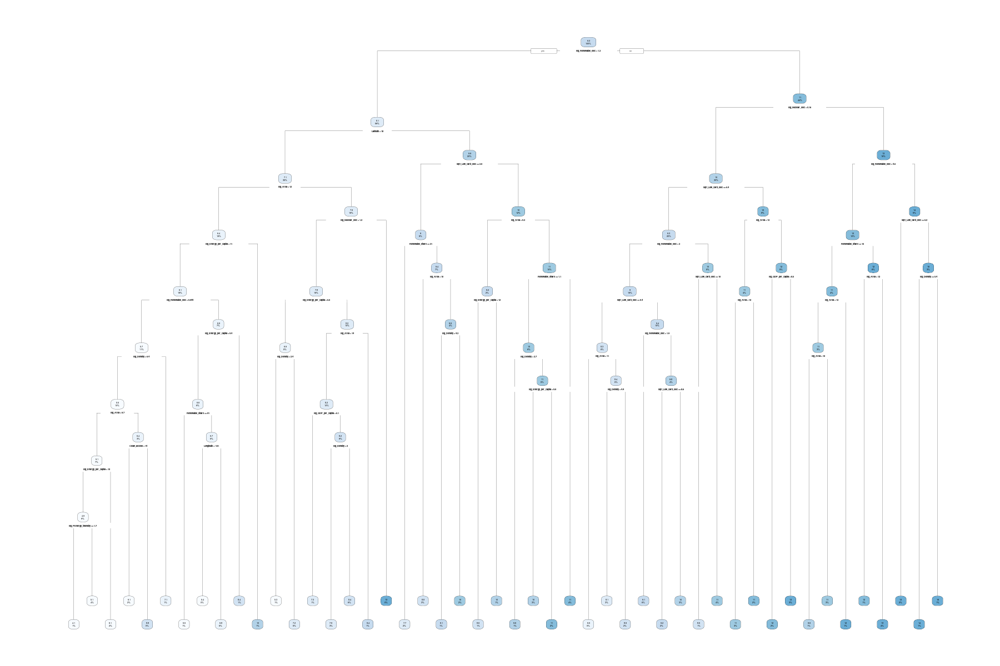

In [98]:
library(rpart.plot)
options(repr.plot.width = 15, repr.plot.height = 10)
rpart.plot(tree.reg)

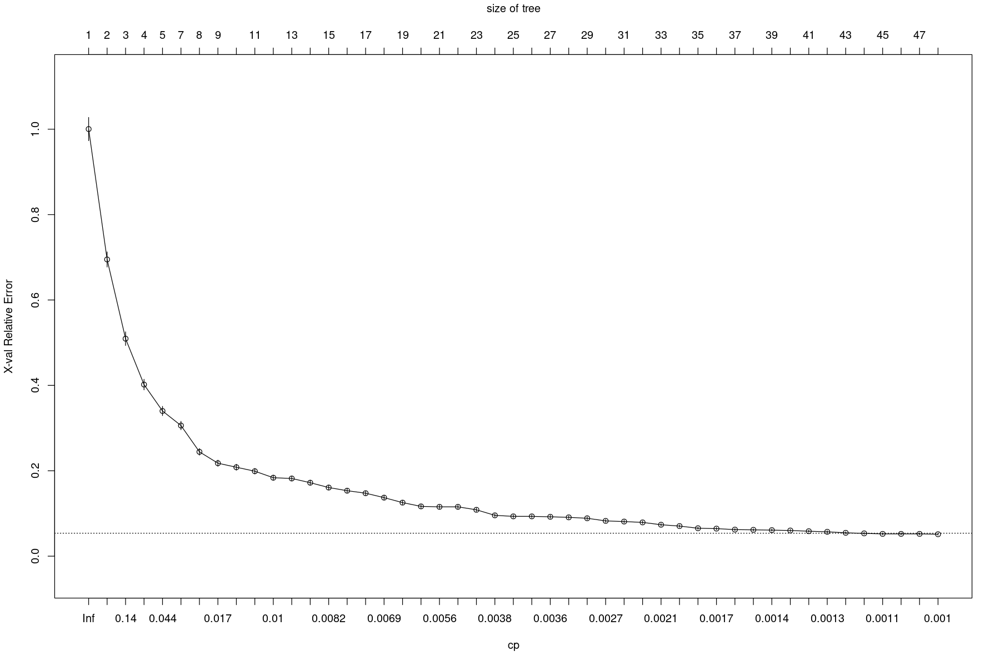

In [99]:
xmat <- xpred.rpart(tree.reg,xval=10)
CVerr<-apply((xmat-Y_train)^2,2,sum)
plotcp(tree.reg)

[1] 0.001043315

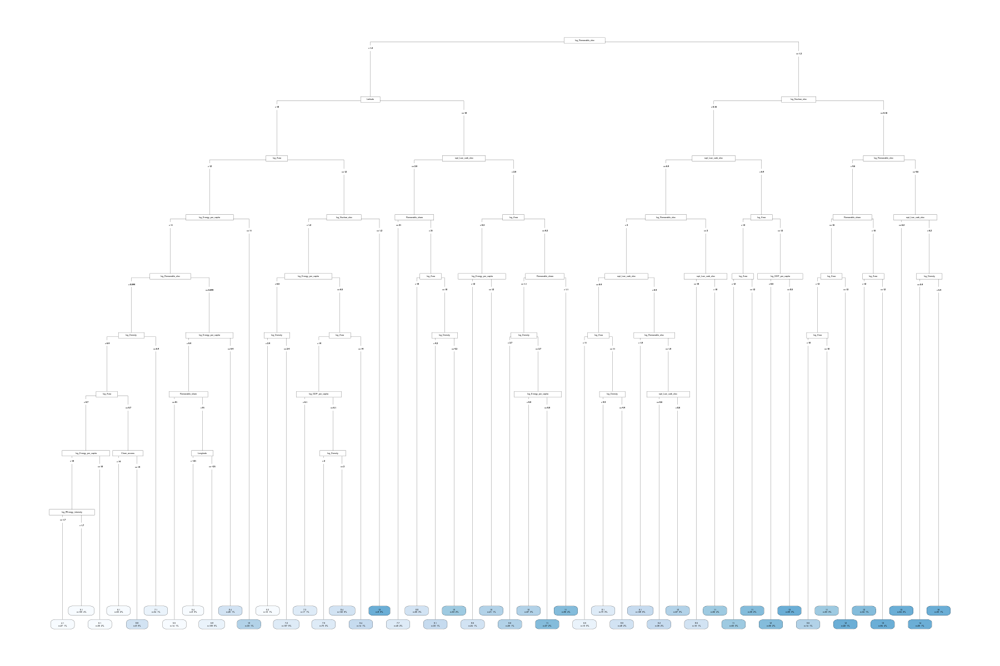

In [100]:
as.numeric(attributes(which.min(CVerr))$names)
tree.reg=rpart(Y_train~.,data=X_train_quanti,control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))
rpart.plot(tree.reg,type=5,extra=101)

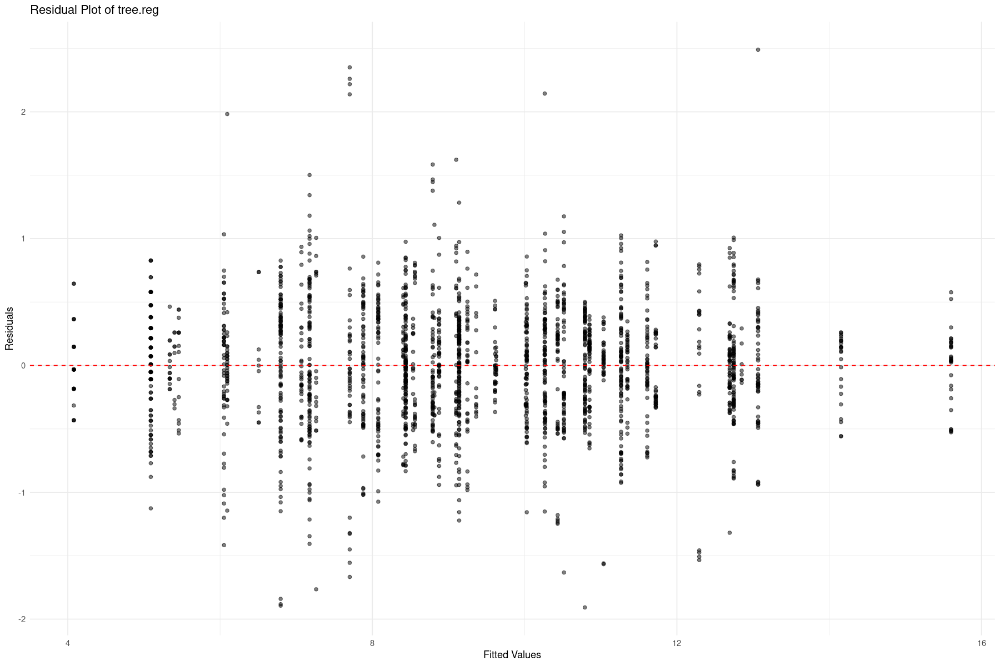

In [101]:
fit.tree=predict(tree.reg)
res.tree=fit.tree-Y_train

# Create a data frame for plotting
data_for_plot <- data.frame(Fitted = fit.tree, Residuals = res.tree)

# Plot using ggplot2
ggplot(data_for_plot, aes(x = Fitted, y = Residuals)) +
  geom_point(alpha = 0.5) +  # Using semi-transparent points
  geom_hline(yintercept = 0, color = "red", linetype = "dashed") +  # Red line at zero
  labs(x = "Fitted Values", y = "Residuals", title = "Residual Plot of tree.reg") +
  theme_minimal()

Elagage avec la librarie caret : 

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”


[1] "Meilleur paramètre cp : 0.00565135225171538"
[1] "Scores RMSE pour chaque configuration testée:"
            cp      RMSE  Rsquared       MAE     RMSESD RsquaredSD      MAESD
1  0.005521767 0.8310510 0.8786524 0.6450927 0.03222701 0.01136860 0.02528551
2  0.005615519 0.8310510 0.8786524 0.6450927 0.03222701 0.01136860 0.02528551
3  0.005651352 0.8310510 0.8786524 0.6450927 0.03222701 0.01136860 0.02528551
4  0.006488329 0.8724093 0.8661515 0.6797947 0.04603459 0.01548109 0.03090775
5  0.007430111 0.9204059 0.8512471 0.7151974 0.02519027 0.01228798 0.02069283
6  0.007826798 0.9244526 0.8499340 0.7182211 0.02676646 0.01237660 0.02447484
7  0.007982777 0.9311441 0.8476914 0.7229475 0.03480141 0.01402798 0.03239124
8  0.008493875 0.9544778 0.8401584 0.7451603 0.04040848 0.01466416 0.04010665
9  0.009306403 0.9892887 0.8286088 0.7703649 0.06781915 0.01974661 0.05660662
10 0.010317837 1.0056111 0.8231767 0.7825963 0.05460889 0.01334001 0.05092074
11 0.010479882 1.0056111 0.8231767 0.782

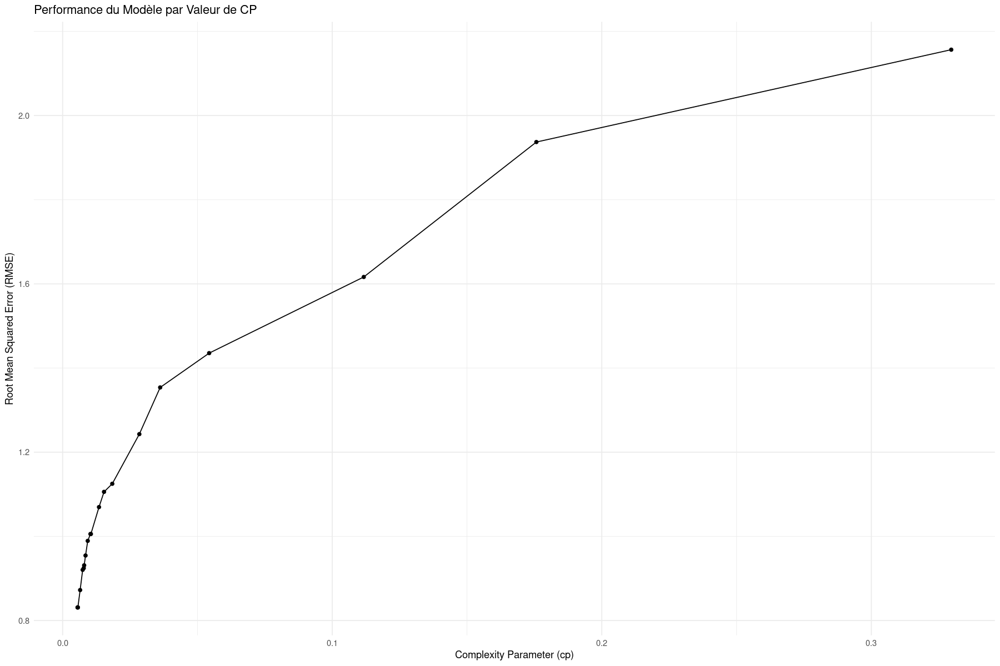

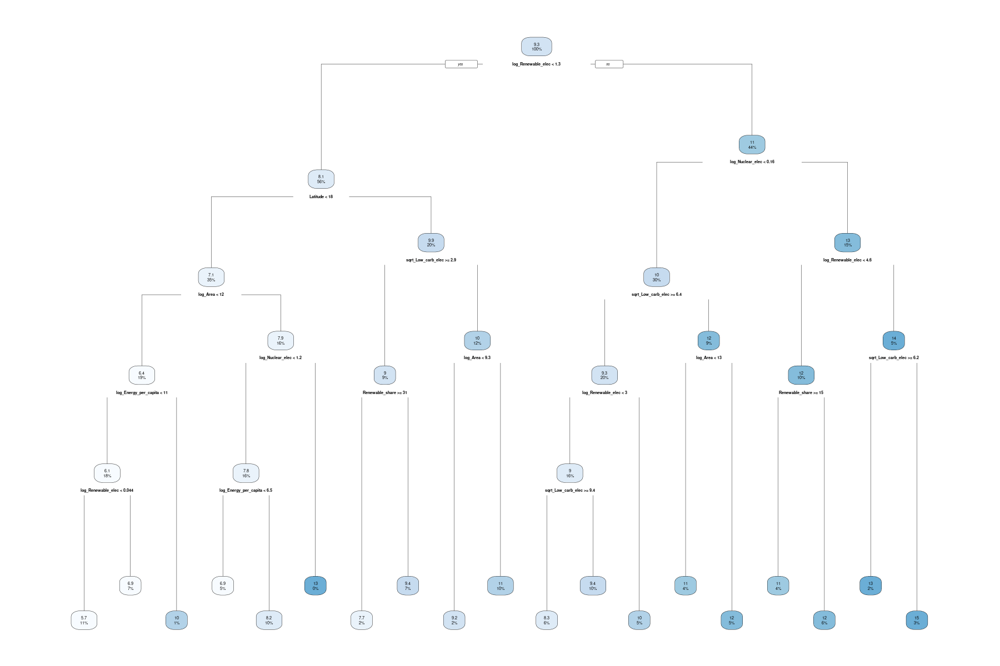

In [102]:
# Define control parameters for cross-validation
ctrl <- trainControl(method = "cv",
                     number = 5,
                     savePredictions = "final",
                     summaryFunction = defaultSummary)  # 'defaultSummary' computes RMSE, R-squared, etc.

# Prepare a new data frame for the model
model_data <- cbind(X_train_quanti, Y_train = Y_train)

# Training the model with RMSE as the primary metric
treecaret <- train(Y_train ~ ., data = model_data, method = "rpart",
                   trControl = ctrl, tuneLength = 20, metric = "RMSE")

# Display the best cp parameter and RMSE scores
print(paste("Meilleur paramètre cp :", toString(treecaret$bestTune)))
print("Scores RMSE pour chaque configuration testée:")
print(treecaret$results)

# Plot RMSE performance over different cp values
ggplot(treecaret$results, aes(x = cp, y = RMSE)) +
  geom_line() +
  geom_point() +
  theme_minimal() +
  labs(title = "Performance du Modèle par Valeur de CP",
       x = "Complexity Parameter (cp)",
       y = "Root Mean Squared Error (RMSE)")

# Plot the final model
rpart.plot(treecaret$finalModel)

## 2.5 Modélisation par forêt aléatoire

La modélisation par forêt aléatoire consiste à entraîner plusieurs arbres de décision indépendants sur des sous-ensembles aléatoires de données d'entraînement, puis à combiner leurs prédictions pour obtenir une prédiction finale. Pour chaque arbre de décision, un sous-ensemble aléatoire des données d'entraînement est sélectionné. Cela garantit la diversité des arbres. Chaque arbre de décision est construit en choisissant de manière répétée le meilleur attribut pour diviser les données. Une fois que tous les arbres ont été construits, les prédictions de chaque arbre sont combinées pour obtenir une prédiction finale.

In [103]:
#install.packages("randomForest")
library(randomForest)

randomForest 4.7-1.1

Type rfNews() to see new features/changes/bug fixes.


Attachement du package : ‘randomForest’


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


L'objet suivant est masqué depuis ‘package:gridExtra’:

    combine


L'objet suivant est masqué depuis ‘package:ggplot2’:

    margin




In [104]:
## Version 1
rf.reg = randomForest(Y_train ~ ., 
                      data = X_train_quanti, 
                      #xtest = X_test_quanti, 
                      #ytest = Y_test,
                      ntree = 200, 
                      nodesize = 2,  # Equivalent à min_samples_split = 2
                      mtry = 8,
                      do.trace = FALSE, #TRUE
                      importance = TRUE)

print(rf.reg)


Call:
 randomForest(formula = Y_train ~ ., data = X_train_quanti, ntree = 200,      nodesize = 2, mtry = 8, do.trace = FALSE, importance = TRUE) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.01786483
                    % Var explained: 99.69


In [105]:
predictions_rf <- predict(rf.reg, X_train_quanti)
residuals <- Y_train - predictions_rf
SS_res <- sum(residuals^2)
mean_Y_train <- mean(Y_train)
SS_tot <- sum((Y_train - mean_Y_train)^2)
R_squared <- 1 - (SS_res / SS_tot)
MSE <- SS_res / length(residuals)
RMSE <- sqrt(MSE)

paste("Mean Squared Error (MSE):", MSE)
paste("Root Mean Squared Error (RMSE):", RMSE)
paste("Score de validation croisée (R^2):", R_squared)

# 'Score de validation croisée (R^2): 0.999561357977596'

[1] "Mean Squared Error (MSE): 0.00248474780542221"

[1] "Root Mean Squared Error (RMSE): 0.0498472447124434"

[1] "Score de validation croisée (R^2): 0.999563041453492"

In [106]:
## Version 2
k <- 5
folds <- sample(1:k, nrow(X_train_quanti), replace = TRUE)
results <- data.frame(RMSE = double(k), R2 = double(k))

# Validation croisée
for(i in 1:k){

  train_data <- X_train_quanti 
  test_data <- X_test_quanti 
  train_Y <- Y_train 
  test_Y <- Y_test 

  # Entraînement du modèle
  rf_model <- randomForest(x = train_data, y = train_Y, ntree = 200, nodesize = 2,mtry=8)


  predictions <- predict(rf_model, test_data)
  results$RMSE[i] <- sqrt(mean((predictions - test_Y)^2))
  results$R2[i] <- summary(lm(predictions ~ test_Y))$r.squared
}
mean_rmse <- mean(results$RMSE)
mean_r2 <- mean(results$R2)

cat("Moyenne RMSE:", mean_rmse, "\n")
cat("Moyenne R²:", mean_r2, "\n")

Moyenne RMSE: 0.1373565 
Moyenne R²: 0.9968201 


Le résultat obtenu indique une très bonne adaptation aux données ainsi qu'une robustesse et une généralisation du modèle. Comparativement aux autres modèles présentés précédemment, la forêt aléatoire présente la meilleure performance globale. Ce résultat montre que l'approche d'ensemble, combinant les prédictions de nombreux arbres, réussit particulièrement bien à capter les complexités des données sans surajustement, grâce à la diversité des arbres et à la puissance de l'agrégation de leurs résultats.

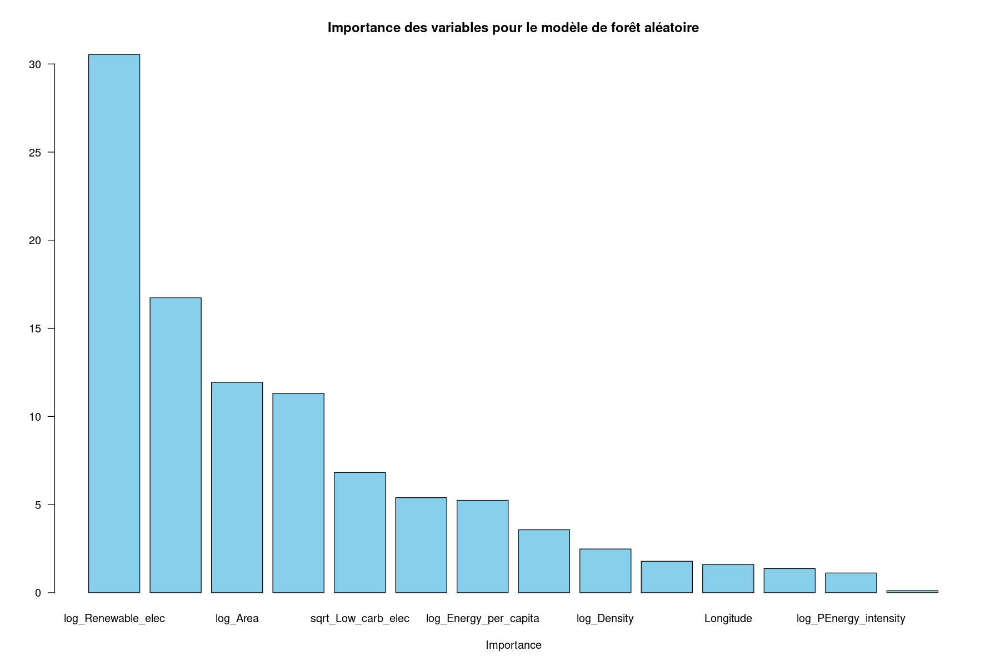

In [107]:
# Obtenir l'importance des variables
rf_model <- randomForest(x = X_train_quanti, y = Y_train, ntree = 200, nodesize = 2, mtry=8)
importance_vals <- importance(rf_model)

# Créer un data frame pour stocker les importances et les noms des variables
importance_df <- data.frame(
  Feature = rownames(importance_vals),
  Importance = importance_vals[, 1]/sum(importance_vals[, 1]) * 100  # La première colonne contient l'importance moyenne
)

# Trier les variables par importance
importance_df <- importance_df[order(importance_df$Importance, decreasing = TRUE), ]

# Créer un graphique
barplot(
  importance_df$Importance,
  names.arg = importance_df$Feature,
  horiz = FALSE,
  las = 1,
  col = "skyblue",
  xlab = "Importance",
  main = "Importance des variables pour le modèle de forêt aléatoire"
)

Ce graphique en bar représente la proportion d'importance des variables de notre échantillon d'entraînement sur la modélisation par forêt aléatoire. On remarque que la variable sur la part d'énergie renouvelable est celle qui a la contribution la plus importante pour le modèle. Juste après, la variable iniquant la latitude des pays apporte environ 20% des informations. L'électricité apportée à partir d'une source nucléaire est également assez significative. A l'inverse, d'autres variables comme la croissance ou l'accès à l'électricité ont peu d'importance pour le modèle de forêt aléatoire.

## 2.7 Modélisation par forêt aléatoire avec les données qualitatives et quantitatives

Nous allons maintenant ajouter les données qualitatives (les pays et différentes année) qui ont jusqu'à maintenant été mise de coté dans l'étude. Pour éviter de multiplier les valeurs différentes, nous allons faire des regroupements au sein de ses données qualitatives. Nous allons utiliser la meilleure forêt aléatoire suggérée par la recherche sur grille.

### 2.7.1 Ajout de la variable 'Year'

On va refaire une modélisation par forêt aléatoire en ajoutant la variables Year que nous allons regrouper en 4 groupes différents : les années de 2000 à 2004, celles de 2005 à 2009, celles de 2010 à 2014, et enfin celles de 2015 à 2020, sous formes de données catégoriques.

In [108]:
# Supprimer la colonne 'Entity' des données d'entraînement et de test
#print(names(X_test))
X_train_year_group <- subset(X_train, select = -Entity)
X_test_year_group <- subset(X_test, select = -Entity) #Entity introuvable ?


# Regrouper les années par catégories
bins <- c(2000, 2004, 2009, 2014, 2020)
labels <- c("2000-2004", "2005-2009", "2010-2014", "2015-2020")

In [109]:
# Convertir la variable "Year" en numérique
X_train_year_group$Year <- as.numeric(as.character(X_train_year_group$Year))
X_test_year_group$Year <- as.numeric(as.character(X_test_year_group$Year))

# Ensuite, vous pouvez utiliser la fonction cut()
X_train_year_group$Year <- cut(X_train_year_group$Year, breaks = bins, labels = labels, right = FALSE)
X_test_year_group$Year <- cut(X_test_year_group$Year, breaks = bins, labels = labels, right = FALSE)

# Encoder les variables avec des valeurs numériques (1 et 0)
X_train_encoded <- model.matrix(~Year - 1, data = X_train_year_group)
X_train_year_group <- cbind(X_train_year_group[, -which(names(X_train_year_group) %in% "Year")], X_train_encoded)

X_test_encoded <- model.matrix(~Year - 1, data = X_test_year_group)
X_test_year_group <- cbind(X_test_year_group[, -which(names(X_test_year_group) %in% "Year")], X_test_encoded)

# Renommer les colonnes
colnames(X_train_year_group) <- c("2000-2004", "2005-2009", "2010-2014", "2015-2020")
colnames(X_test_year_group) <- c("2000-2004", "2005-2009", "2010-2014", "2015-2020")

In [110]:
# Avec perf_cross_validation qui utilise caret()
#perf_cross_validation("rf", X_train_year, Y_train, cv = 5, scoring = "Rsquared")

In [111]:
#avec la fonction randomForest()
library(randomForest)

rf_model <- randomForest(Y_train ~ ., data = X_train_year, ntree = 200, nodesize = 2, mtry = 8)
print(rf_model)


Call:
 randomForest(formula = Y_train ~ ., data = X_train_year, ntree = 200,      nodesize = 2, mtry = 8) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.02380461
                    % Var explained: 99.58


In [112]:
predictions <- predict(rf_model, X_train_year)

# Calcul des résidus
residuals <- Y_train - predictions

# Somme des carrés des résidus
SS_res <- sum(residuals^2)

# Moyenne des observations
mean_Y_train <- mean(Y_train)

# Somme des carrés totale
SS_tot <- sum((Y_train - mean_Y_train)^2)

# Calcul de R^2
R_squared <- 1 - (SS_res / SS_tot)

# Calcul du Mean Squared Error (MSE)
MSE <- SS_res / length(residuals)

# Calcul du RMSE
RMSE <- sqrt(MSE)

# Affichage du MSE
paste("Mean Squared Error (MSE):", MSE)

# Affichage du RMSE
paste("Root Mean Squared Error (RMSE):", RMSE)

# Affichage du R^2
paste("Score moyen de validation croisée (R^2):", R_squared)

[1] "Mean Squared Error (MSE): 0.00342771899875891"

[1] "Root Mean Squared Error (RMSE): 0.0585467249191524"

[1] "Score moyen de validation croisée (R^2): 0.999397214031836"

In [113]:
paste( 0.999561357977596-0.999538455677027)

[1] "2.29023005690054e-05"

On remarque que l'ajout de cette variable Year sous forme de 4 catégories amène une amélioration des résultats. . Cependant, il faut nuancer ces valeurs et la comparaison avec nos précédents résultats. En effet, nous n'avons pas le même jeu de données d'entraînement. La comparaison ne devrait pas avoir lieu dans ces conditions.

Attention quand on relance les données, les résultats sont différents !!!

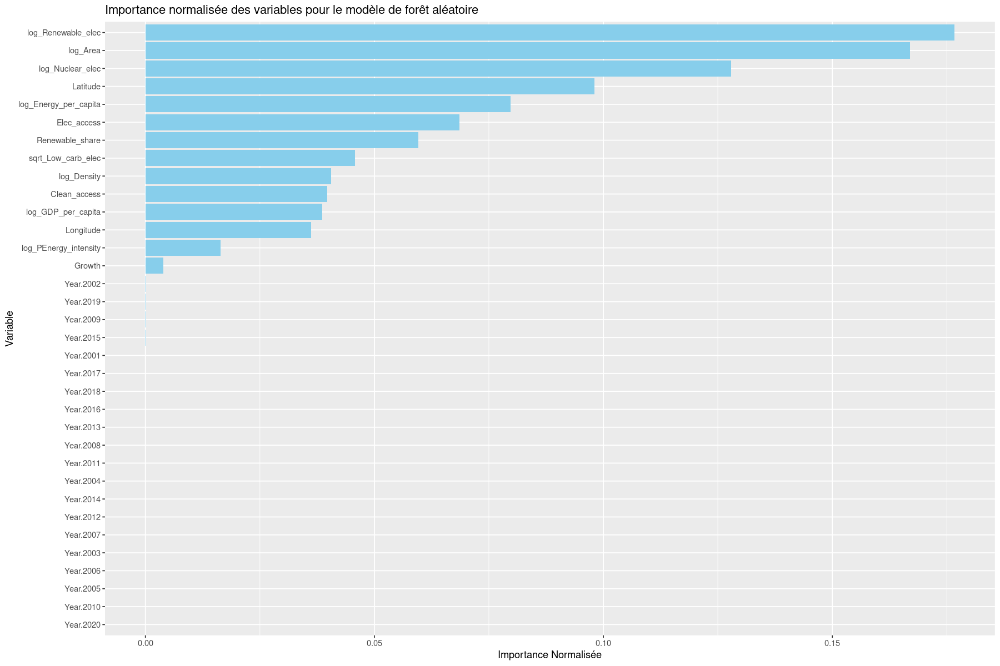

In [114]:
# Obtention de l'importance des variables basée sur l'impureté des noeuds
importances <- importance(rf_model, type=2)  # type=2 pour IncNodePurity

# Création d'un data frame pour stocker les importances et les noms des variables
importance_df <- data.frame(Feature = rownames(importances), Importance = importances[, "IncNodePurity"])

# Normalisation des importances pour qu'elles somment à 1
importance_df$Importance <- importance_df$Importance / sum(importance_df$Importance)

# Tri des variables par importance
importance_df <- importance_df[order(-importance_df$Importance), ]

# Tracé du graphique
ggplot(importance_df, aes(x = reorder(Feature, Importance), y = Importance)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  coord_flip() +  # Inversion de l'axe y pour afficher les variables les plus importantes en haut
  labs(title = "Importance normalisée des variables pour le modèle de forêt aléatoire",
       x = "Variable",
       y = "Importance Normalisée")

On observe que les variables ajoutées sous forme d'années catégorisées ne contribuent pas de manière notable à la modélisation. Les variables importantes sont similaires à celles importantes pour la forêt aléatoire précédente. Nous avons vu dans l'analyse de la variable CO2dans a première partie, que la valeur du CO2 augmentait légèrement au cours des années, même si elle comportait quelques outliers. Il est possible que les années n'apportent donc pas une grande information supplémentaire pour la modélisation du CO2. L'ajout de variables supplémentaires peut augmenter la complexité du modèle, ce qui peut potentiellement conduire à un surajustement aux données d'entraînement. Il est important de surveiller la performance du modèle sur des données de validation ou de test pour s'assurer qu'il généralise bien aux données non vues et qu'il n'y a pas de surajustement.

### 2.7.2 Ajout de la variable 'Entity' en regroupant par continent

Nous pouvons également étudier les performances de la forêt aléatoire en ajoutant les noms des pays. Compte tenu du nombre conséquent de pays différents que nous avons (176 pays), nous avons mis en place plusieurs stratégies de regroupements. On commence par récupérer la liste des pays, puis on construit un regroupement par 5 continents (Europe, Amérique, Afrique, Asie et Océanie) ci-dessous.

In [115]:
liste_elements_uniques <- unique(dff$Entity)

In [116]:
library(dplyr)

# Supposons que X_train et X_test sont vos dataframes en R
# On retire la colonne 'Year'
X_train_entity <- X_train[, !names(X_train) %in% 'Year']
X_test_entity <- X_test[, !names(X_test) %in% 'Year']

# Définir les groupes de pays qui donnent les continents
groupes <- list(
    Europe = c(
        "Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", 
        "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", "Estonia", 
        "Finland", "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", 
        "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", 
        "Malta", "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", 
        "Norway", "Poland", "Portugal", "Romania", "Russia", "San Marino", 
        "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland", 
        "Turkey", "Ukraine", "United Kingdom", "Vatican City"
    ),
    Amérique = c(
        "Antigua and Barbuda", "Argentina", "Bahamas", "Barbados", "Belize", 
        "Bolivia", "Brazil", "Canada", "Chile", "Colombia", "Costa Rica", 
        "Cuba", "Dominica", "Dominican Republic", "Ecuador", "El Salvador", 
        "Grenada", "Guatemala", "Guyana", "Haiti", "Honduras", "Jamaica", 
        "Mexico", "Nicaragua", "Panama", "Paraguay", "Peru", "Saint Kitts and Nevis", 
        "Saint Lucia", "Saint Vincent and the Grenadines", "Suriname", "Trinidad and Tobago", 
        "United States", "Uruguay", "Venezuela","French Guiana", "Puerto Rico","Bermuda","Cayman Islands"
    ),
    Asie = c(
        "Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", 
        "Bhutan", "Brunei", "Cambodia", "China", "Cyprus", "Georgia", 
        "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", 
        "Jordan", "Kazakhstan", "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", 
        "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal", "North Korea", 
        "Oman", "Pakistan", "Palestine", "Philippines", "Qatar", "Saudi Arabia", 
        "Singapore", "South Korea", "Sri Lanka", "Syria", "Taiwan", "Tajikistan", 
        "Thailand", "Timor-Leste", "Turkey", "Turkmenistan", "United Arab Emirates", 
        "Uzbekistan", "Vietnam", "Yemen","Aruba"
    ),
    Afrique = c(
        "Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", 
        "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros", 
        "Democratic Republic of the Congo", "Djibouti", "Egypt", "Equatorial Guinea", 
        "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea", 
        "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", "Libya", 
        "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", "Morocco", 
        "Mozambique", "Namibia", "Niger", "Nigeria", "Republic of the Congo", 
        "Rwanda", "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", 
        "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", 
        "Tunisia", "Uganda", "Zambia", "Zimbabwe","Congo"
    ),
    Océanie = c(
        "Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", 
        "Nauru", "New Zealand", "Palau", "Papua New Guinea", "Samoa", 
        "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu", "New Caledonia"
    )
)

# Remplacer les valeurs selon les groupes
replace_continent <- function(data) {
  for (continent in names(groupes)) {
    data$Entity <- ifelse(data$Entity %in% groupes[[continent]], continent, data$Entity)
  }
  data
}

X_train_entity <- replace_continent(X_train_entity)
X_test_entity <- replace_continent(X_test_entity)

# Encoder les variables avec des valeurs numériques (1 et 0) via model.matrix
X_train_encoded <- model.matrix(~ Entity - 1, data = X_train_entity)
X_test_encoded <- model.matrix(~ Entity - 1, data = X_test_entity)

# Ajouter les encoded data back to the original data frames (en supposant qu'il n'y a pas d'autres colonnes 'Entity')
X_train_entity <- cbind(X_train_entity[, !names(X_train_entity) %in% 'Entity'], X_train_encoded)
X_test_entity <- cbind(X_test_entity[, !names(X_test_entity) %in% 'Entity'], X_test_encoded)

In [117]:
forest_model <- randomForest(Y_train ~ ., data = X_train_entity, ntree = 200, nodesize = 2, mtry = 8)
print(forest_model)


Call:
 randomForest(formula = Y_train ~ ., data = X_train_entity, ntree = 200,      nodesize = 2, mtry = 8) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.3769
                    % Var explained: 93.37


In [118]:
predictions <- predict(forest_model, X_train_entity)

# Calcul des résidus
residuals <- Y_train - predictions

# Somme des carrés des résidus
SS_res <- sum(residuals^2)

# Moyenne des observations
mean_Y_train <- mean(Y_train)

# Somme des carrés totale
SS_tot <- sum((Y_train - mean_Y_train)^2)

# Calcul de R^2
R_squared <- 1 - (SS_res / SS_tot)

# Calcul du Mean Squared Error (MSE)
MSE <- SS_res / length(residuals)

# Calcul du RMSE
RMSE <- sqrt(MSE)

# Affichage du MSE
paste("Mean Squared Error (MSE):", MSE)

# Affichage du RMSE
paste("Root Mean Squared Error (RMSE):", RMSE)

# Affichage du R^2
paste("Score moyen de validation croisée (R^2):", R_squared)

[1] "Mean Squared Error (MSE): 0.313445073799094"

[1] "Root Mean Squared Error (RMSE): 0.559861655946444"

[1] "Score moyen de validation croisée (R^2): 0.944878710202101"

L'intégration de l'encodage des pays par continents dans notre modèle de forêt aléatoire a légèrement amélioré la performance par rapport à votre précédente forêt aléatoire sans cet encodage. Avec le même choix d'hyperparamètres, le score moyen de validation croisée a diminué : 0.945 actuellement contre 0.993 avec les pays et 0.999 avec uniquement les variables quantitatives. On a un faible gain, mais qui indique une amélioration de la précision du modèle.

En ajoutant un encodage des pays, nous n'avons pas le même jeu de données d'entraînement. La comparaison avec les autres méthodes ne se fait pas dans les conditions adéquates.

### 2.7.3 Ajout de la variable 'Entity' en regroupant par zones géographiques et économiques

Une autre stratégie de regroupement des pays peut être par critère de développement. En effet, on peut imaginer que des pays très développés pourraient avoir tendnace à valoriser certaines types de production d'électricité dans leur mix énergétique, et que leurs populations pourraient avoir des modes de vies polluants. A l'invrese, des pays en voie de développement pourraient avoir tendance à êre plus économes dans leurs habitudes de vie.

Nous nous sommes basés sur un rapport de l'ONU : "The Millennium Development Goals Report", dont la carte de répartition des pays est disponible à l'adresse suivante : https://1.bp.blogspot.com/-o7Cc2a3wQUQ/UCnQYx_tSUI/AAAAAAAACIA/s2k3SkjT7S8/s1600/10+bio-r%C3%A9gions.jpg

In [119]:
library(dplyr)
library(tidyr)
library(caret)  # pour le one-hot encoding avec dummyVars

X_train_entity_geo_eco <- X_train[, !names(X_train) %in% 'Year']
X_test_entity_geo_eco <- X_test[, !names(X_test) %in% 'Year']

# Définition complète des groupes de pays
groupes_geography_economy <- list(
  Developed_regions = c("Albania", "Andorra", "Austria", "Belgium", "Bosnia and Herzegovina", 
                        "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", "Estonia", 
                        "Finland", "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", 
                        "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", 
                        "Malta", "Monaco", "Montenegro", "Netherlands", "North Macedonia", 
                        "Norway", "Poland", "Portugal", "Romania", "San Marino", 
                        "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland", 
                        "Turkey", "United Kingdom", "Vatican City", "Canada", "United States", 
                        "Japan", "Australia", "New Zealand", "Cyprus"),
  CIS = c("Belarus", "Moldova", "Russia", "Ukraine", "Armenia", "Azerbaijan",
          "Georgia",  "Kazakhstan", "Kyrgyzstan", "Tajikistan", "Turkmenistan", "Uzbekistan"),
  Latin_America_and_Caribbean = c("Antigua and Barbuda", "Argentina", "Bahamas", "Barbados", "Belize", 
                                  "Bolivia", "Brazil", "Chile", "Colombia", "Costa Rica", 
                                  "Cuba", "Dominica", "Dominican Republic", "Ecuador", "El Salvador", 
                                  "Grenada", "Guatemala", "Guyana", "Haiti", "Honduras", "Jamaica", 
                                  "Mexico", "Nicaragua", "Panama", "Paraguay", "Peru", "Saint Kitts and Nevis", 
                                  "Saint Lucia", "Saint Vincent and the Grenadines", "Suriname", "Trinidad and Tobago",
                                  "Uruguay", "Venezuela", "French Guiana", "Puerto Rico", "Bermuda", "Cayman Islands"),
  South_Eastern_Asia = c("Brunei", "Cambodia", "Indonesia",  "Laos", "Malaysia",  "Myanmar", "Philippines",
                         "Singapore", "Thailand", "Timor-Leste", "Vietnam"),
  Eastern_Asia = c("China", "Mongolia", "North Korea", "South Korea", "Taiwan"),
  Southern_Asia = c("Afghanistan", "Bangladesh", "Bhutan", "India", "Iran", "Maldives", "Nepal", 
                    "Pakistan",  "Sri Lanka"),
  Western_Asia = c("Bahrain", "Iraq", "Israel", "Jordan", "Kuwait", "Lebanon", "Oman", "Palestine", 
                   "Qatar", "Saudi Arabia",  "Syria", "Turkey", "United Arab Emirates", "Yemen", "Aruba"),
  Northern_Africa = c("Algeria", "Egypt", "Libya", "Morocco", "Tunisia"),
  Sub_Saharan_Africa = c("Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", 
                         "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros", 
                         "Democratic Republic of the Congo", "Djibouti", "Equatorial Guinea", 
                         "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea", 
                         "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", 
                         "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", 
                         "Mozambique", "Namibia", "Niger", "Nigeria", "Republic of the Congo", 
                         "Rwanda", "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", 
                         "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo",
                         "Uganda", "Zambia", "Zimbabwe", "Congo"),
  Oceania = c("Fiji", "Kiribati", "Marshall Islands", "Micronesia", 
              "Nauru", "Palau", "Papua New Guinea", "Samoa", 
              "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu", "New Caledonia")
)

# Fonction pour remplacer les valeurs des pays par les groupes
replace_group <- function(data) {
  for (group_name in names(groupes_geography_economy)) {
    data$Entity <- ifelse(data$Entity %in% groupes_geography_economy[[group_name]], group_name, data$Entity)
  }
  data
}

# Appliquer la fonction de remplacement
X_train_entity_geo_eco <- replace_group(X_train_entity_geo_eco)
X_test_entity_geo_eco <- replace_group(X_test_entity_geo_eco)

# One-hot encoding
X_train_encoded <- model.matrix(~ Entity - 1, data = X_train_entity_geo_eco)
X_test_encoded <- model.matrix(~ Entity - 1, data = X_test_entity_geo_eco)

# Fusion des data.frames avec les variables encodées
X_train_entity_geo_eco <- cbind(X_train_entity_geo_eco[, !names(X_train_entity_geo_eco) %in% 'Entity'], X_train_encoded)
X_test_entity_geo_eco <- cbind(X_test_entity_geo_eco[, !names(X_test_entity_geo_eco) %in% 'Entity'], X_test_encoded)


Attachement du package : ‘tidyr’


Les objets suivants sont masqués depuis ‘package:Matrix’:

    expand, pack, unpack


L'objet suivant est masqué depuis ‘package:reshape2’:

    smiths




In [120]:
forest_model <- randomForest(Y_train ~ ., data = X_train_entity_geo_eco, ntree = 200, nodesize = 2, mtry = 8)
print(forest_model)


Call:
 randomForest(formula = Y_train ~ ., data = X_train_entity_geo_eco,      ntree = 200, nodesize = 2, mtry = 8) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.3774722
                    % Var explained: 93.36


In [121]:
predictions <- predict(forest_model, X_train_entity_geo_eco)

# Calcul des résidus
residuals <- Y_train - predictions

# Somme des carrés des résidus
SS_res <- sum(residuals^2)

# Moyenne des observations
mean_Y_train <- mean(Y_train)

# Somme des carrés totale
SS_tot <- sum((Y_train - mean_Y_train)^2)

# Calcul de R^2
R_squared <- 1 - (SS_res / SS_tot)

# Calcul du Mean Squared Error (MSE)
MSE <- SS_res / length(residuals)

# Calcul du RMSE
RMSE <- sqrt(MSE)

# Affichage du MSE
paste("Mean Squared Error (MSE):", MSE)

# Affichage du RMSE
paste("Root Mean Squared Error (RMSE):", RMSE)

# Affichage du R^2
paste("Score moyen de validation croisée (R^2):", R_squared)

[1] "Mean Squared Error (MSE): 0.323463005687926"

[1] "Root Mean Squared Error (RMSE): 0.568738081798578"

[1] "Score moyen de validation croisée (R^2): 0.943116993802711"

On observe des performances très proches du découpage par continent mis en place précédemment. Même si quelques différences sont notables, cette catégorisation se raproche du regroupement par continents, ce qui pourrait expliquer la similitude des résultats.

### 2.7.4 Ajout de la variable 'Entity' avec les pays les plus émetteurs

Enfin, nous nous sommes basés sur notre étude des 5 pays les plus émetteurs. Nous avons décidé de créer une catégorie par pays figurant sur cette liste, et une sixième catégorie comprenant tous les autres pays.

In [122]:
# On retire la colonne 'Year'
X_train_entity_polluant <- X_train[, !names(X_train) %in% 'Year']
X_test_entity_polluant <- X_test[, !names(X_test) %in% 'Year']

# Liste des pays à ne pas remplacer
pays_a_garder <- c("United States", "China", "India", "Japan", "Germany")

# Remplacer tous les pays sauf ceux de la liste par "Autre"
X_train_entity_polluant$Entity <- ifelse(X_train_entity_polluant$Entity %in% pays_a_garder, 
                                         X_train_entity_polluant$Entity, "Autre")

# Afficher pour vérification
#print(head(X_train_entity_polluant, 50))
#print(unique(X_train_entity_polluant$Entity))

# One-hot encoding
dummy <- dummyVars("~ Entity", data = X_train_entity_polluant, fullRank = FALSE)
X_train_encoded <- predict(dummy, X_train_entity_polluant)
X_train_entity_polluant <- data.frame(X_train_entity_polluant[, !names(X_train_entity_polluant) %in% 'Entity'], X_train_encoded)

# Répéter pour X_test
X_test_entity_polluant$Entity <- ifelse(X_test_entity_polluant$Entity %in% pays_a_garder, 
                                        X_test_entity_polluant$Entity, "Autre")

dummy_test <- dummyVars("~ Entity", data = X_test_entity_polluant, fullRank = FALSE)
X_test_encoded <- predict(dummy_test, X_test_entity_polluant)
X_test_entity_polluant <- data.frame(X_test_entity_polluant[, !names(X_test_entity_polluant) %in% 'Entity'], X_test_encoded)

In [123]:
forest_model_top5 <- randomForest(Y_train ~ ., data = X_train_entity_polluant, ntree = 200, nodesize = 2, mtry = 8)
print(forest_model_top5)


Call:
 randomForest(formula = Y_train ~ ., data = X_train_entity_polluant,      ntree = 200, nodesize = 2, mtry = 8) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 8

          Mean of squared residuals: 0.01760343
                    % Var explained: 99.69


In [124]:
predictions <- predict(forest_model_top5, X_train_entity_polluant)

# Calcul des résidus
residuals <- Y_train - predictions

# Somme des carrés des résidus
SS_res <- sum(residuals^2)

# Moyenne des observations
mean_Y_train <- mean(Y_train)

# Somme des carrés totale
SS_tot <- sum((Y_train - mean_Y_train)^2)

# Calcul de R^2
R_squared <- 1 - (SS_res / SS_tot)

# Calcul du Mean Squared Error (MSE)
MSE <- SS_res / length(residuals)

# Calcul du RMSE
RMSE <- sqrt(MSE)

# Affichage du MSE
paste("Mean Squared Error (MSE):", MSE)

# Affichage du RMSE
paste("Root Mean Squared Error (RMSE):", RMSE)

# Affichage du R^2
paste("Score moyen de validation croisée (R^2):", R_squared)

[1] "Mean Squared Error (MSE): 0.00245062339905017"

[1] "Root Mean Squared Error (RMSE): 0.0495037715638937"

[1] "Score moyen de validation croisée (R^2): 0.999569042445213"

On note une légère amélioration d'environ 4% par rapport aux découpages précédents. Cela peut s'expliquer par le fait que ce découpage est aussi corrélé avec d'autres informations importantes comme les émissins de CO2 (étudié précédemment). C'est le modèle qui nous donne les meilleures performances.

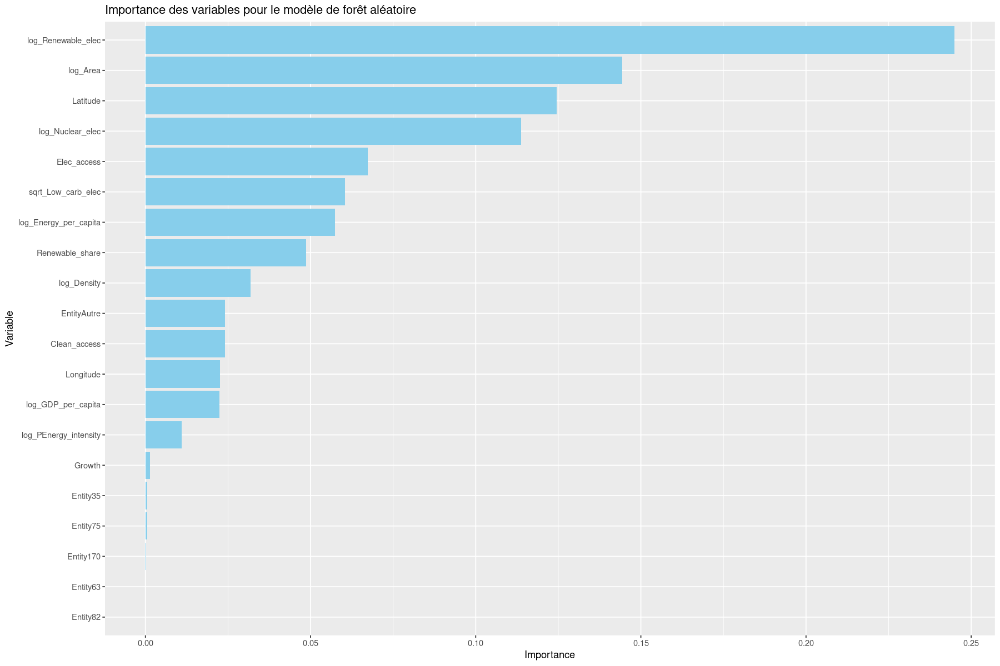

In [125]:
# Obtention de l'importance des variables basée sur l'impureté des noeuds
importances <- importance(forest_model_top5, type=2)  # type=2 pour IncNodePurity

# Création d'un data frame pour stocker les importances et les noms des variables
importance_df <- data.frame(Feature = rownames(importances), Importance = importances[, "IncNodePurity"])

# Normalisation des importances pour qu'elles somment à 1
importance_df$Importance <- importance_df$Importance / sum(importance_df$Importance)

# Tri des variables par importance
importance_df <- importance_df[order(-importance_df$Importance), ]

# Tracé du graphique
ggplot(importance_df, aes(x = reorder(Feature, Importance), y = Importance)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  coord_flip() +  # Inversion de l'axe y pour afficher les variables les plus importantes en haut
  labs(title = "Importance des variables pour le modèle de forêt aléatoire",
       x = "Variable",
       y = "Importance")

On remarque que les 5 pays les plus émetteurs ne sont pa sceux qui ont le plus d'importance pour le modèle. En revanche, les 171 pays "autres" portent environ 5% de l'information pour la modélisation. Cela s'explique par la quantité conséquente des pays dans cette catégorie. On aurait donc pu faire deux catégories de pays : une catégorie "top5" avec les 5 pays les plus émetteurs et la même catégorie "autre".

## 2.8 Boosting

Le boosting est une technique d'apprentissage automatique qui combine plusieurs modèles d'apprentissage faibles pour créer un modèle fort. Contrairement aux méthodes telles que les forêts aléatoires qui utilisent des modèles parallèles et les combinent, le boosting construit les modèles séquentiellement, en se concentrant sur les données que les modèles précédents n'ont pas bien appris.

In [126]:
#install.packages("gbm")

In [127]:
#install.packages("pROC")

In [128]:
library(gbm)

Loaded gbm 2.1.9

This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3



les hyperparamètres utilisés sont les suivants :

* Nombre d'itérations (n.trees) : C'est le nombre d'itérations ou de modèles à construire dans le processus de boosting. Dans ce code, il est défini à 5000. Un nombre plus élevé d'itérations peut conduire à un meilleur ajustement, mais peut également augmenter le risque de surajustement.

* Taux d'apprentissage (shrinkage) : C'est un facteur qui contrôle la contribution de chaque modèle à l'ensemble final. Dans ce code, il est défini à 0.1. Un taux d'apprentissage plus faible signifie que chaque modèle contribue moins aux prédictions finales, ce qui peut conduire à une convergence plus lente mais à de meilleures performances en général.

* Profondeur maximale des arbres (n.minobsinnode) : Si l'algorithme de boosting utilise des arbres de décision comme modèles de base, la profondeur maximale des arbres peut être un hyperparamètre important pour contrôler la complexité des modèles individuels. Dans ce code, elle est définie à 3.

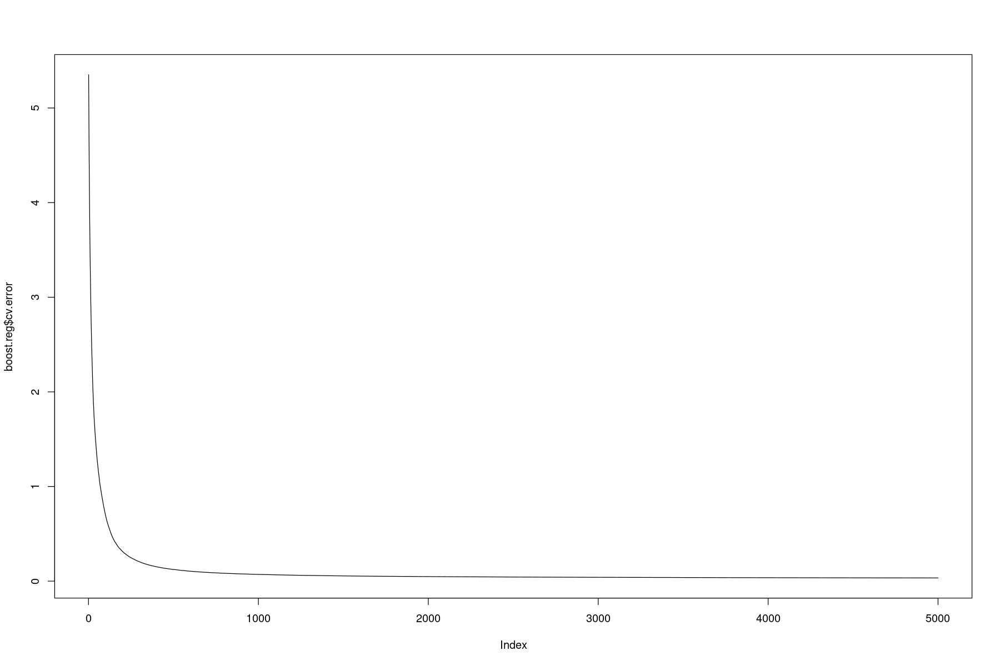

In [129]:
boost.reg = gbm(Y_train ~ ., data = X_train_quanti, distribution = "gaussian", n.trees = 5000, 
    cv.folds = 5, n.minobsinnode = 3, shrinkage = 0.1, verbose = FALSE)
# fixer verbose à FALSE pour éviter trop de sorties
plot(boost.reg$cv.error, type = "l")

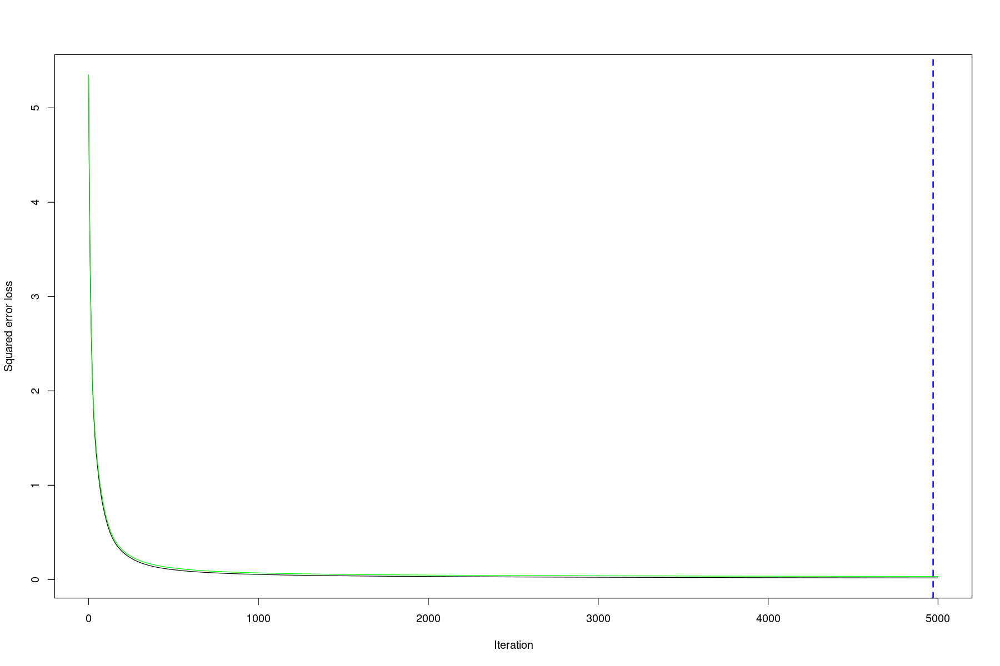

In [130]:
 # nombre optimal d'itérations par valiation croisée
best.iter=gbm.perf(boost.reg,method="cv")

In [131]:
# Prédictions sur les données de test
predictions <- predict(boost.reg, newdata = X_test_quanti)

# Calcul des résidus avec les vraies valeurs de Y_test
residuals <- Y_test - predictions

# Somme des carrés des résidus
SS_res <- sum(residuals^2)

# Moyenne des observations de Y_test
mean_Y_test <- mean(Y_test)

# Somme des carrés totale basée sur Y_test
SS_tot <- sum((Y_test - mean_Y_test)^2)

# Calcul de R^2 avec les données de test
R_squared <- 1 - (SS_res / SS_tot)

# Calcul du Mean Squared Error (MSE)
MSE <- SS_res / length(residuals)

# Calcul du RMSE
RMSE <- sqrt(MSE)

# Affichage du MSE
paste("Mean Squared Error (MSE):", MSE)

# Affichage du RMSE
paste("Root Mean Squared Error (RMSE):", RMSE)

# Affichage du R^2
paste("Score moyen de validation croisée (R^2):", R_squared)

Using 4971 trees...




[1] "Mean Squared Error (MSE): 0.0393301736943532"

[1] "Root Mean Squared Error (RMSE): 0.198318364490919"

[1] "Score moyen de validation croisée (R^2): 0.993035733786919"

In [132]:
print(0.999561357977596-0.992446642030986) #comparaison avec le R2 obtenu par RandomForest

[1] 0.007114716


L'erreur de généralisation obtenue est très proche de celle donnée par la meilleure forêt aléatoire. Le score moyen de validation croisée est de 0.992446 qui est inférieur de 0.0071
à celui du meilleur modèle de forêt aléatoire. Ce modèle est très performant sur ce critère. La combinaison de plusieurs modèles simples semble efficace.

## 2.9 Réseaux de neuronnes

Un réseau de neurones artificiels est composé de plusieurs couches de neurones interconnectés, chaque neurone étant une unité de traitement élémentaire. Le réseau de neurones commence par une couche d'entrée, recevant les données d'entrée. Il y a ensuite une ou plusieurs couches cachées, chacune composée de neurones qui effectuent des opérations linéaires et non linéaires sur les données d'entrée. Puis, on rencontre une couche de sortie qui génère les prédictions du modèle.

In [133]:
library(nnet)

In [134]:
head(X_train_quanti)

,Elec_access,Clean_access,Renewable_share,log_Nuclear_elec,log_Renewable_elec,sqrt_Low_carb_elec,log_Energy_per_capita,log_PEnergy_intensity,Growth,log_GDP_per_capita,log_Density,log_Area,Latitude,Longitude
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,14.73851,9.50,36.66,0,0.4885800,8.247501,5.442280,0.8754687,8.832278,5.255847,4.110874,13.38815,33.93911,67.70995
5,20.06497,10.90,44.24,0,0.4446858,7.995083,5.324137,0.7884574,1.414118,5.358387,4.110874,13.38815,33.93911,67.70995
6,25.39089,12.20,33.88,0,0.4637340,8.027506,5.533663,0.8796267,11.229715,5.493190,4.110874,13.38815,33.93911,67.70995
7,30.71869,13.85,31.89,0,0.4946962,8.785811,5.721691,0.9162907,5.357403,5.578724,4.110874,13.38815,33.93911,67.70995
8,36.05101,15.30,28.78,0,0.5596158,8.941329,5.872906,0.9282193,13.826320,5.888028,4.110874,13.38815,33.93911,67.70995
10,46.74005,18.40,16.53,0,0.5766134,9.163990,6.883512,1.1786550,21.390528,6.082832,4.110874,13.38815,33.93911,67.70995


In [135]:
nnet.reg = nnet(Y_train ~., data=X_train_quanti,size=5,decay=1,linout=TRUE,maxit=5000)
summary(nnet.reg)

# weights:  81
initial  value 250470.435638 
iter  10 value 12313.530677
iter  20 value 10962.414200
iter  30 value 9126.933471
iter  40 value 8316.019189
iter  50 value 7567.422601
iter  60 value 7140.583733
iter  70 value 6805.023211
iter  80 value 6159.611651
iter  90 value 5042.288304
iter 100 value 3846.678585
iter 110 value 2805.650487
iter 120 value 2270.777717
iter 130 value 1715.686714
iter 140 value 1360.902500
iter 150 value 1039.112012
iter 160 value 812.459521
iter 170 value 729.923283
iter 180 value 688.370176
iter 190 value 660.320976
iter 200 value 629.702487
iter 210 value 623.603281
iter 220 value 621.167792
iter 230 value 614.742786
iter 240 value 609.682892
iter 250 value 602.515010
iter 260 value 594.761370
iter 270 value 589.084327
iter 280 value 585.888388
iter 290 value 583.847185
iter 300 value 581.693805
iter 310 value 579.023930
iter 320 value 574.277814
iter 330 value 571.422959
iter 340 value 570.094518
iter 350 value 569.557169
iter 360 value 569.178027
it

a 14-5-1 network with 81 weights
options were - linear output units  decay=1
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
   6.29    0.00    0.00    0.01   -0.07   -0.13    0.14   -0.17   -0.46    0.00 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 
  -0.13   -0.17   -0.26    0.00    0.00 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
  -0.01    0.01   -0.01    0.09    0.64    0.09   -0.12    0.08    0.13    0.00 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 
  -0.60   -1.14   -0.28    0.12    0.00 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
   0.36   -0.03    0.05   -0.05    0.19   -1.08    0.68    0.47   -0.11    0.06 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 
  -0.49   -0.57   -0.26    0.09    0.01 
  b->h4  i1->h4  i2->h4  i3->h4  i4->h4  i5->h4  i6->h4  i7->h4  i8->h4  i9->h4 
   5.79    0.00   -0.01    0.00   -0.16   -0.06   -0.13   -0.12    0.30    0.00 
i10->h4 i11->h4 i12->h4 i13->

In [136]:
library(e1071)

In [137]:
library(MASS)

In [138]:
str(X_train_quanti)
str(Y_train)

'data.frame':	2296 obs. of  14 variables:
 $ Elec_access          : num  14.7 20.1 25.4 30.7 36.1 ...
 $ Clean_access         : num  9.5 10.9 12.2 13.8 15.3 ...
 $ Renewable_share      : num  36.7 44.2 33.9 31.9 28.8 ...
 $ log_Nuclear_elec     : num  0 0 0 0 0 0 0 0 0 0 ...
 $ log_Renewable_elec   : num  0.489 0.445 0.464 0.495 0.56 ...
 $ sqrt_Low_carb_elec   : num  8.25 8 8.03 8.79 8.94 ...
 $ log_Energy_per_capita: num  5.44 5.32 5.53 5.72 5.87 ...
 $ log_PEnergy_intensity: num  0.875 0.788 0.88 0.916 0.928 ...
 $ Growth               : num  8.83 1.41 11.23 5.36 13.83 ...
 $ log_GDP_per_capita   : num  5.26 5.36 5.49 5.58 5.89 ...
 $ log_Density          : num  4.11 4.11 4.11 4.11 4.11 ...
 $ log_Area             : num  13.4 13.4 13.4 13.4 13.4 ...
 $ Latitude             : num  33.9 33.9 33.9 33.9 33.9 ...
 $ Longitude            : num  67.7 67.7 67.7 67.7 67.7 ...
 num [1:2296] 7.11 6.94 7.35 7.47 7.48 ...


In [139]:
#plot(tune.nnet(Y_train ~ .,data = X_train_quanti, size=4,maxit=500,linout=TRUE)) #ne fctionne pas
#plot(tune.nnet(Y_train ~ .,data = X_train,size=4:5,decay=1:10)) #ne fonctionne pas


In [140]:
 gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.5, 1.5)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

# weights:  81
initial  value 224810.194208 
iter  10 value 10936.103564
iter  20 value 10428.892409
iter  30 value 10287.003872
iter  40 value 10197.982572
iter  50 value 9956.255028
iter  60 value 8914.553688
iter  70 value 8594.620177
iter  80 value 8497.533958
iter  90 value 6949.253135
iter 100 value 5748.630348
iter 110 value 5359.661484
iter 120 value 4870.237471
iter 130 value 4477.373144
iter 140 value 4180.978477
iter 150 value 4071.577444
iter 160 value 3343.194271
iter 170 value 3006.685381
iter 180 value 2797.042831
iter 190 value 2419.125899
iter 200 value 2281.616729
iter 210 value 1930.709488
iter 220 value 1667.155437
iter 230 value 1447.315538
iter 240 value 1255.399039
iter 250 value 1107.102304
iter 260 value 939.454148
iter 270 value 864.977721
iter 280 value 796.468909
iter 290 value 612.375384
iter 300 value 445.349909
iter 310 value 396.162779
iter 320 value 373.558105
iter 330 value 349.609205
iter 340 value 338.942868
iter 350 value 335.442006
iter 360 value 3

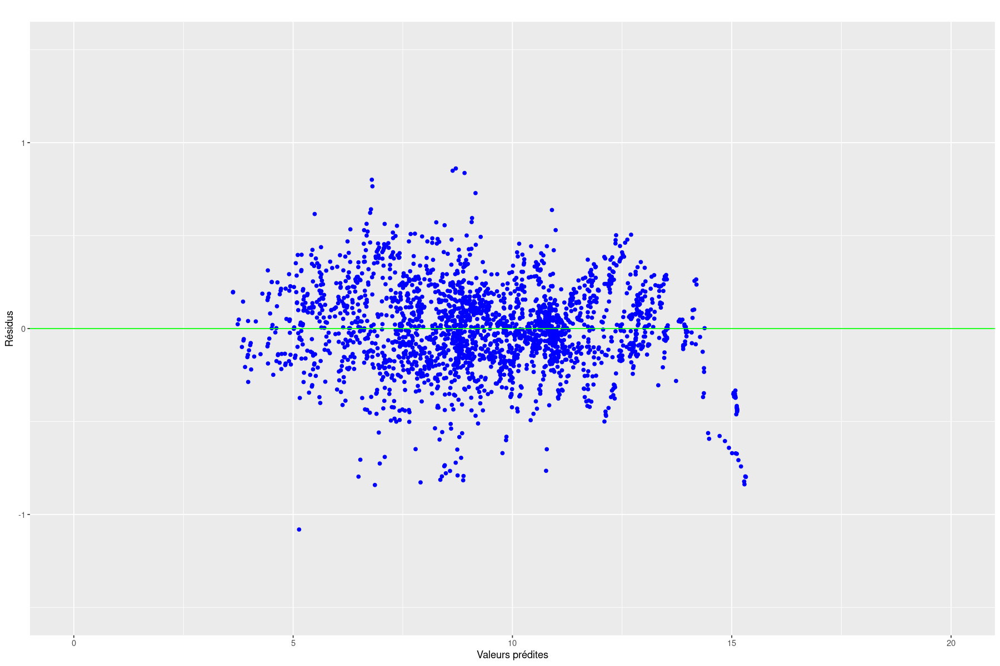

In [141]:
nnet.reg = nnet(Y_train~.,data=X_train_quanti,size=5,decay=1,linout=TRUE,maxit=5000)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=X_train_quanti)
res.nnetr=fit.nnetr-Y_train
gplot.res(fit.nnetr,res.nnetr,titre="")

In [142]:
 # Calcul des prévisions
pred.nnetr = predict(nnet.reg,newdata=X_test_quanti)
# Erreur quadratique moyenne de prévision
mse <- sum((pred.nnetr-Y_test)^2)/length(Y_test)
print(mse)

[1] 0.07112286


In [143]:
predictions <- predict(nnet.reg, newdata = X_test_quanti)
residuals <- Y_test - predictions
SS_res <- sum(residuals^2)
mean_Y_test <- mean(Y_test)
SS_tot <- sum((Y_test - mean_Y_test)^2)
R_squared <- 1 - (SS_res / SS_tot)
MSE <- SS_res / length(residuals)

RMSE <- sqrt(MSE)
paste("Mean Squared Error (MSE):", MSE)
paste("Root Mean Squared Error (RMSE):", RMSE)
paste("Score moyen de validation croisée (R^2):", R_squared)

[1] "Mean Squared Error (MSE): 0.0711228616425329"

[1] "Root Mean Squared Error (RMSE): 0.266688698002995"

[1] "Score moyen de validation croisée (R^2): 0.987406144041875"

## 2.10 Récapitulatif et comparaisons des différentes méthodes de modélisation

### 2.10.1 Récapitulatif des résultats obtenus et comparaisons

In [144]:
recap <- data.frame(
  Méthode = c("Modèle linéaire sans sélection de variable", "Modèle linéaire Backward", "Modèle linéaire Forward", "Régression linéaire avec sélection de variable - LASSO", "Régression linéaire avec régularisation par Ridge", "SVR noyau linéaire", "SVR noyau radial", "Arbre optimal", "Forêt aléatoire (données quantitatives)", "Forêt aléatoire (top5 pays émetteurs)", "Boosting", "Réseau de neuronnes"),
  Modèle = c("lm", "x", "x","x","x","x","x","x","x","x","x","x"),
  `Score moyen de validation croisée R2` = c(0.9820, 0.9824, 0.9824,0.9826,0.9825,0.9814,0.9959,0.8840,0.9970,0.9995,0.9949,"X")
)
recap

# Resultat à vérifier pour l'arbre optimal

Méthode,Modèle,Score.moyen.de.validation.croisée.R2
<chr>,<chr>,<chr>
Modèle linéaire sans sélection de variable,lm,0.982
Modèle linéaire Backward,x,0.9824
Modèle linéaire Forward,x,0.9824
Régression linéaire avec sélection de variable - LASSO,x,0.9826
Régression linéaire avec régularisation par Ridge,x,0.9825
SVR noyau linéaire,x,0.9814
SVR noyau radial,x,0.9959
Arbre optimal,x,0.884
Forêt aléatoire (données quantitatives),x,0.997


In [145]:
#test : 
# reg linéaire sans selection de variable : 0.9820
# Mod linéaire backward : 0.9824
# mod lineaire forward : 0.9824
# LASSO : 0.9826 v1 / 0.9828 avec X_train_year
# RIDGE : 0.9825 v1 / 0.9828 v2
# SVM linaire : 0.9814174 
# SVM radial : 0.9959796 
# Random Forest : R²: 0.9970

<span style="color:red">
To do
</span>

### 2.10.2 Intérêt des méthodes non linéaires

Le tableau montre les scores moyens de validation croisée pour différentes méthodes de modélisation. La validation croisée est une technique robuste pour évaluer la performance des modèles de machine learning car elle permet de limiter les problèmes de surajustement et d'obtenir une estimation plus fiable de la performance du modèle sur des données inédites.

* Consistance des modèles linéaires :\
Les scores des modèles linéaires sont identiques qu'il y ait eu sélection de variables ou non. Cela peut indiquer que les variables supprimées dans les approches avec sélection de variables n'apportent pas d'informations supplémentaires significatives pour la prédiction. Ou bien, cela peut aussi suggérer que les variables conservées sont suffisamment informatives et que la suppression des autres variables n'affecte pas la capacité prédictive du modèle. De plus, compte tenu du faible nombre de variables quantitatives non concervées en Backward et du fait que toutes les variables quantitatives ont été conservées en Forward, on a des résultats très similaires.

* Comparaison avec des modèles non linéaires :\
Le modèle d'arbre optimal a un score légèrement inférieur aux modèles linéaires, ce qui est assez inhabituel car les arbres de décision sont généralement plus flexibles et capturent mieux la non-linéarité des données. Cela pourrait suggérer que nos données sont bien modélisées par une relation linéaire ou que le paramètre max_depth de l'arbre a été mal ajusté (trop ou pas assez profond). La forêt aléatoire présente le meilleur score, ce qui n'est pas surprenant puisque c'est un modèle d'ensemble robuste qui peut gérer à la fois la non-linéarité et les interactions complexes entre les variables.

* Intérêt des méthodes linéaires :\
Les méthodes linéaires sont intéressantes pour leur simplicité, leur rapidité de calcul et leur interprétabilité. Si elles fournissent des scores de validation croisée similaires à des modèles plus complexes, cela pourrait être une indication que la complexité supplémentaire des autres modèles n'est pas nécessaire. Un autre avantage des modèles linéaires est leur facilité de déploiement et d'explication dans des contextes professionnels où il est essentiel de comprendre comment les prédictions sont générées. Cependant, un arbre optimal et encore plus une forêt alétoire permettent de capturer des relations non linéaires entre les variables de notre jeu de données, ce qui explique les meilleurs résultats sur la moyenne des scores de validation croisée.

## 2.11 Application à l'échantillon de test

### 2.11.1 - Définition de la fonction d'évaluation de performance des modèles

Dans cette partie, nous allons récupérer tous nos modèles implémentés dans la sous-partie précédente. Nous allons les appliquer sur notre échantillon test issu de la division aléatoire du jeu de données, et nous allons comparer les performances de nos modèles selon les critères définis dans le cours et rappelés ci-dessous. De plus, nous allons étudier la validité de nos modèles à l'aide la représentation des résidus et un graphe QQ-plot. Nous allons créer une fonction que nous appelerons pour tous nos modèles.

In [155]:
performance <- function(X_test, Y_test, Y_pred) {
  # Calcul de RMSE
  rmse <- sqrt(mean((Y_test - Y_pred)^2))
  cat("RMSE:", rmse, "\n")
  
  # Calcul de MAE
  mae <- mean(abs(Y_test - Y_pred))
  cat("MAE:", mae, "\n")
  
  # Calcul du R²
  r2 <- caret::R2(Y_pred, Y_test)
  cat("R²:", r2, "\n")
  
  # Calcul du R² ajusté
  n <- nrow(X_test)  # Nombre d'échantillons dans l'ensemble de test
  p <- ncol(X_test)  # Nombre de variables explicatives
  r2_adj <- 1 - (1 - r2) * (n - 1) / (n - p - 1)
  cat("R² ajusté:", r2_adj, "\n")
}

In [152]:
library(ggplot2)
library(ggfortify)

In [156]:
graphe_residus <- function(Y_test, Y_pred) {
  residus <- Y_test - Y_pred
  data <- data.frame(Y_pred, residus)
  
  # Scatter plot des résidus
  p1 <- ggplot(data, aes(x = Y_pred, y = residus)) +
    geom_point(color = "blue") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
    labs(title = "Graphique de résidus", x = "Valeurs prédites", y = "Résidus") +
    theme_minimal()
  
  # QQ plot des résidus
  qq_data <- qqnorm(residus, plot.it = FALSE)
  qq_data <- data.frame(theoretical = qq_data$x, sample = qq_data$y)
  
  p2 <- ggplot(qq_data, aes(sample = residus)) +
    stat_qq(color = "black") +
    stat_qq_line(color = "red") +
    labs(title = "QQ plot des résidus", x = "Quantiles théoriques", y = "Quantiles de l'échantillon") +
    theme_minimal()
  
  # Afficher les deux graphiques côte à côte
  grid.arrange(p1, p2, ncol = 2)
}

Nous décidons de créer une fonction de calcul d'erreur pour évaluer la performance de nos modèles selon les mêmes critères.

* RMSE (Erreur Quadratique Moyenne) : Le RMSE mesure l'écart moyen entre les valeurs prédites par votre modèle et les valeurs réelles dans l'unité de la variable cible. Plus le RMSE est faible, meilleure est la capacité prédictive du modèle

* Erreur Moyenne Absolue (MAE) : Cette métrique calcule la moyenne des valeurs absolues des écarts entre les prédictions du modèle et les valeurs réelles. Elle est moins sensible aux valeurs aberrantes que le RMSE.

* Coefficient de détermination (R²) : Le coefficient de détermination mesure la proportion de la variance de la variable dépendante qui est expliquée par le modèle. Il varie entre 0 et 1, où 1 indique un ajustement parfait.

* R² Ajusté : Le R² ajusté est une version ajustée du R² qui tient compte du nombre de variables dans le modèle et du nombre d'échantillons dans l'ensemble de données. Le R² ajusté est souvent utilisé pour comparer différents modèles, en tenant compte du risque de surajustement.

* L'accuracy, ou précision, est une mesure de performance utilisée pour évaluer les modèles de classification. Elle représente le nombre de prédictions correctes faites par le modèle par rapport au nombre total d'échantillons.

### 2.11.2 - Evaluation des performances sur les échantillons de test

[1] "Régression linéaire sans sélection de variable"
RMSE: 0.3542305 
MAE: 0.2558997 
R²: 0.9778397 
R² ajusté: 0.9772008 


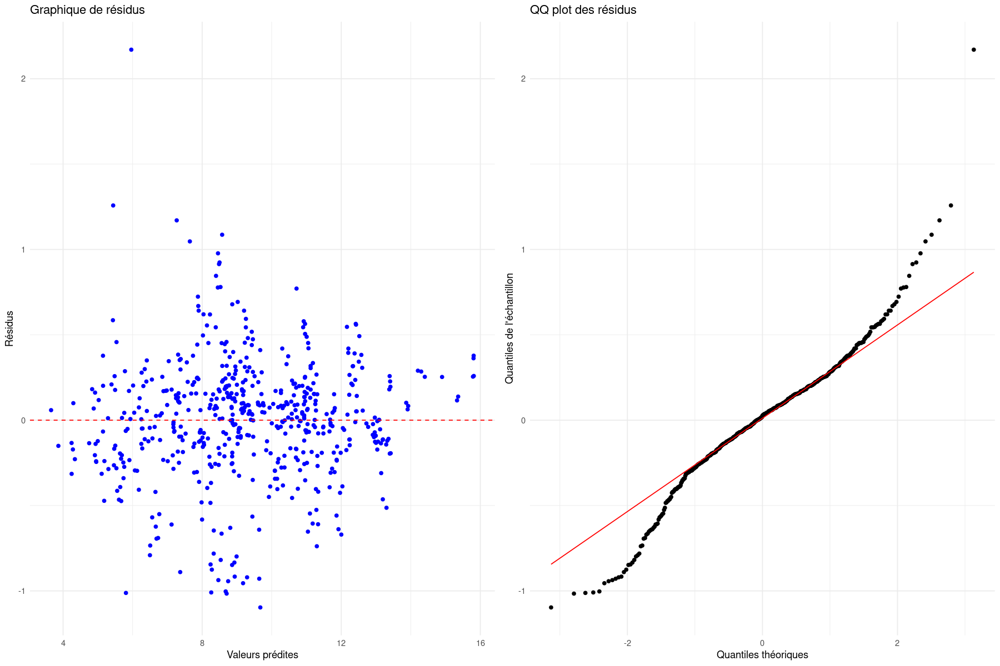

In [157]:
# Prédiction sur les données de test du modèle de régression linéaire sans sélection de variable
Y_pred_reg_no_select <- predict(model_reg_no_select, newdata = X_test[, !names(X_test) %in% c("Entity", "Year")])
print("Régression linéaire sans sélection de variable")
performance(X_test,Y_test,Y_pred_reg_no_select)
graphe_residus(Y_test,Y_pred_reg_no_select)

* RMSE (Erreur Quadratique Moyenne) : Le RMSE est de 0.317. Cela signifie que, en moyenne, les prédictions de votre modèle diffèrent d'environ 0.317 unités de la variable cible par rapport aux valeurs réelles. Plus le RMSE est faible, meilleure est la capacité prédictive du modèle.

* MAE (Erreur Absolue Moyenne) : Le MAE est de 0.235, cela signifie que, en moyenne, les prédictions de votre modèle diffèrent d'environ 0.235 unités de la variable cible par rapport aux valeurs réelles. Comme pour le RMSE, un MAE plus bas indique une meilleure précision du modèle.

* R² (Coefficient de Détermination) : Avec une valeur de R² de 0.982, cela signifie que notre modèle explique environ 98.20 % de la variance totale de la variable cible. Un R² plus élevé indique une meilleure capacité du modèle à expliquer la variance des données observées.

* R² Ajusté : Une valeur de R² ajusté de 0.981 signifie que notre modèle ajusté explique environ 98.10 % de la variance totale de la variable cible. Le R² ajusté est souvent utilisé pour comparer différents modèles, en tenant compte du risque de surajustement.

En conclusion, ces résultats suggèrent que le modèle de régression linéaire sans sélection de variable présente une très bonne performance de prédiction, avec un bon ajustement aux données et une capacité élevée à expliquer la variance de la variable cible. Nous allons maintenant comparer ces résultats en faisaint des modèles de régressions linéaires sur certianes variables judicieusement sélectionnées.

Sur le graphe des résidus, les points ne semblent pas suivre un motif aléatoire autour de la ligne horizontale à zéro, ce qui est idéal pour la régression linéaire. Il semble y avoir une certaine structure dans les résidus, notamment une forme en entonnoir où la variabilité des résidus augmente avec la valeur prédite. Cela suggère une hétéroscédasticité, où les erreurs ne sont pas uniformément distribuées à travers les valeurs prédites, ce qui est un signe que le modèle de régression linéaire pourrait ne pas être adapté à toutes les parties de l'ensemble de données.

Le QQ plot montre comment les quantiles des résidus de notre modèle se comparent à une distribution normale théorique. Les points suivent en grande partie la ligne rouge, indiquant que les résidus sont approximativement normalement distribués, mais avec quelques déviations, notamment dans les queues de distribution (décrochages aux extrémités gauche et droite). Ces déviations pourraient indiquer la présence d'outliers ou que les résidus ne suivent pas parfaitement une distribution normale, ce qui confirme l'analyse du graphe des résidus. La régression linéaire sans sélection de variable est donc un modèle performant mais perfectible.

[1] "Régression linéaire avec sélection de variable Backward"
RMSE: 0.3527768 
MAE: 0.2555 
R²: 0.9780281 
R² ajusté: 0.9773946 


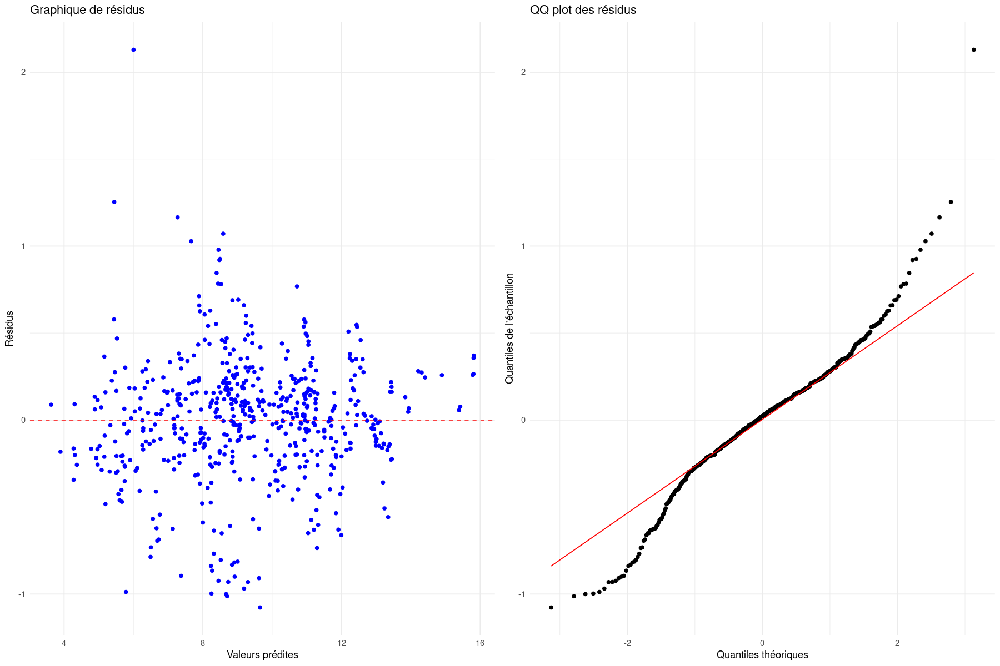

In [158]:
# Prédiction sur les données de test du modèle de régression linéaire avec sélection de variable (Backward et Forward)
# Prédiction sur le jeu d'entraînement (pour l'évaluation du modèle)
Y_pred_backward <- predict(model_backward,X_test_selected_backward)
print("Régression linéaire avec sélection de variable Backward")
performance(X_test,Y_test,Y_pred_backward)
graphe_residus(Y_test,Y_pred_backward)

[1] "Régression linéaire avec sélection de variable Forward"
RMSE: 0.3527768 
MAE: 0.2555 
R²: 0.9780281 
R² ajusté: 0.9773946 


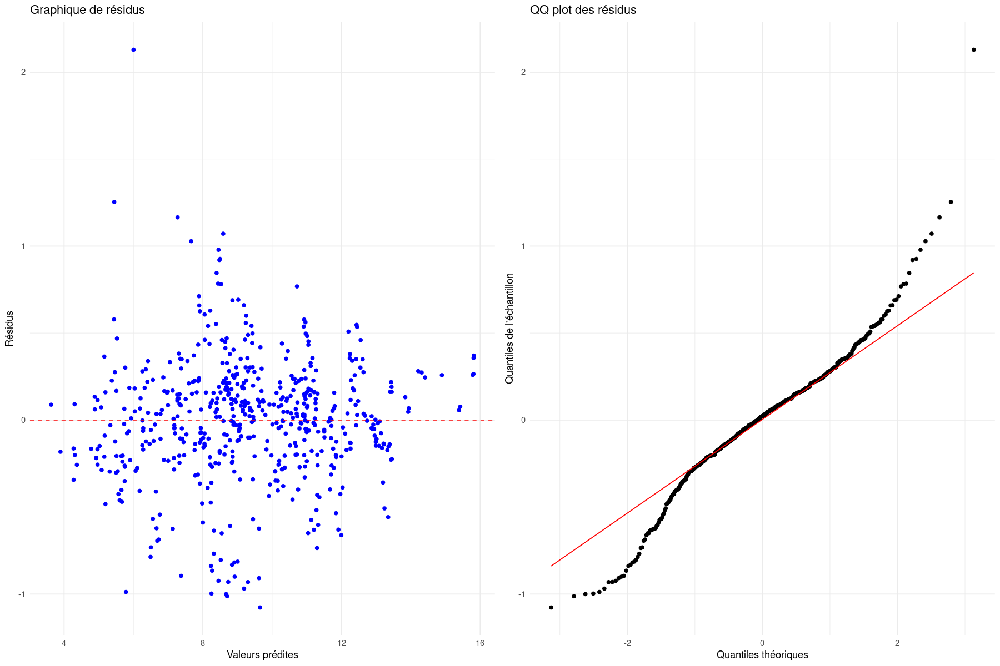

In [159]:
# Prédiction sur le jeu de test en utilisant seulement les variables sélectionnées
Y_pred_forward <- predict(model_forward,X_test_selected_forward)
print("Régression linéaire avec sélection de variable Forward")
performance(X_test,Y_test,Y_pred_forward)
graphe_residus(Y_test,Y_pred_forward)

**Pour le modèle de régression linéaire par sélection de variables Backward :**

RMSE : assez faible, bonne précision des prédictions du modèle.

MAE : relativement bas, les erreurs moyennes absolues sont faibles.

R² : valeur très légèrement inférieure au modèle de régression sans sélection de variable, mais restant très élevée.

R² ajusté : Très proche du R², le modèle généralise bien même après ajustement pour le nombre de prédicteurs dans le modèle.

Graphe des résidus : Les résidus semblent être bien distribués autour de la ligne zéro. Il y a une légère augmentation de la variance à mesure que les valeurs prédites augmentent. Ce phénomène peut indiquer une hétéroscédasticité, c'est-à-dire que la variance des résidus n'est pas constante. Il n’y a pas de tendance systématique claire qui suggérerait un biais dans le modèle, ce qui est positif.

QQ-plot : La majorité des points suit la droite rouge, ce qui indique que les résidus sont approximativement normalement distribués. Cependant, il y a quelques déviations, surtout dans les extrémités (queue droite surtout), ce qui pourrait indiquer la présence de valeurs aberrantes ou de points à effet de levier élevé. Les décrochages semblent moins importants que pour le modèle de régression sans sélection de variable.

**Pour le modèle de régression linéaire par sélection de variables Forward :**

Les deux modèles montrent des performances très similaires en termes de R² et de R² ajusté. Les légères améliorations observées dans le RMSE et le MAE du modèle forward sont minimes et pourraient ne pas être statistiquement significatives, mais indiquent tout de même une légère amélioration dans la précision des prédictions.

La distribution des résidus semble identique, le changement de méthode de sélection de variables n'a pas significativement affecté la distribution des erreurs. Le QQ plot pour le modèle forward montre un comprtement similaire, indiquant que la normalité des résidus est maintenue. Les similitudes entre les deux modèles s'expliquent par le nombre de variables conservées qui est très proche (12 et 11). Il n'y a pas de changement significatif entre le deux sélections.

Les diagnostics de résidus n'indiquant pas de problèmes majeurs pour l'un ou l'autre modèle, et les indices de performance étant presque identiques, le choix entre sélection forward et backward pourrait alors se baser sur d'autres critères, comme la simplicité de mise en œuvre ou les préférences en matière de sélection de variables.

[1] "Régression linéaire avec sélection de variable Lasso"
RMSE: 0.3541209 
MAE: 0.2555894 
R²: 0.9778539 
R² ajusté: 0.9772972 


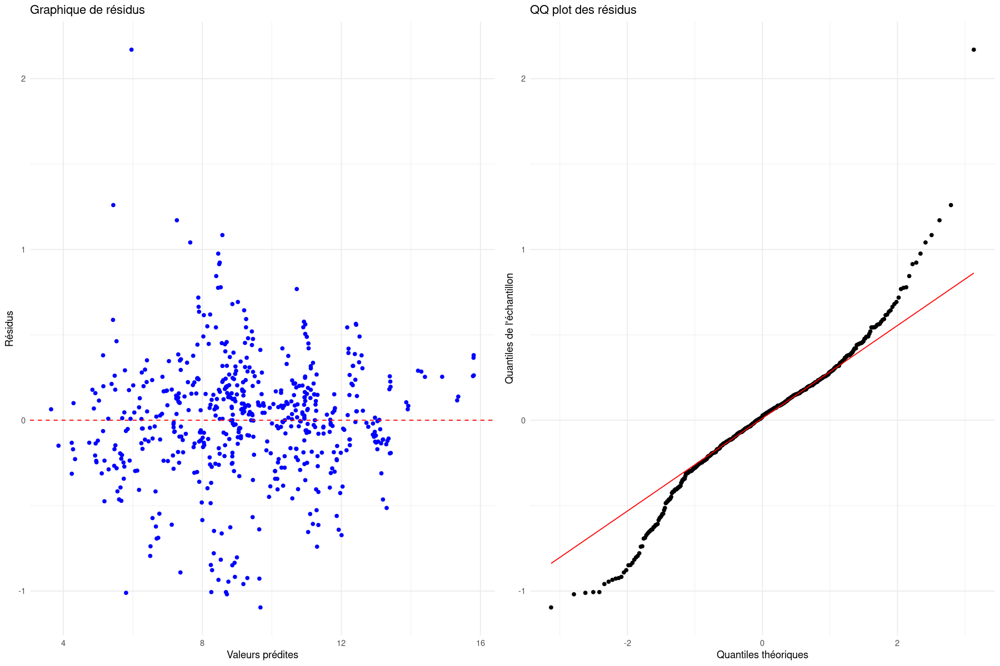

In [173]:
# Prédiction avec le modèle Lasso
Y_pred_lasso <- predict(model_lasso, as.matrix(X_test_quanti))

# Affichage des résultats
print("Régression linéaire avec sélection de variable Lasso")
performance(X_test_quanti, Y_test, Y_pred_lasso)
graphe_residus(Y_test, Y_pred_lasso)


Performances comparables avec les modèles de régression linéaire précédents : RMSE et MAE très similaires aux autres modèles linéaires, R² et R² ajusté sont également très proches. Les graphes des résidus et QQ-plots sont aussi similaires aux observations précédentes. Cela peut s'expliquer par les grandes similitudes entre les modèles de régression linéaire implémentés.

[1] "Régression linéaire avec régularisation par Ridge"
RMSE: 0.354121 
MAE: 0.2555801 
R²: 0.9778537 
R² ajusté: 0.9772152 


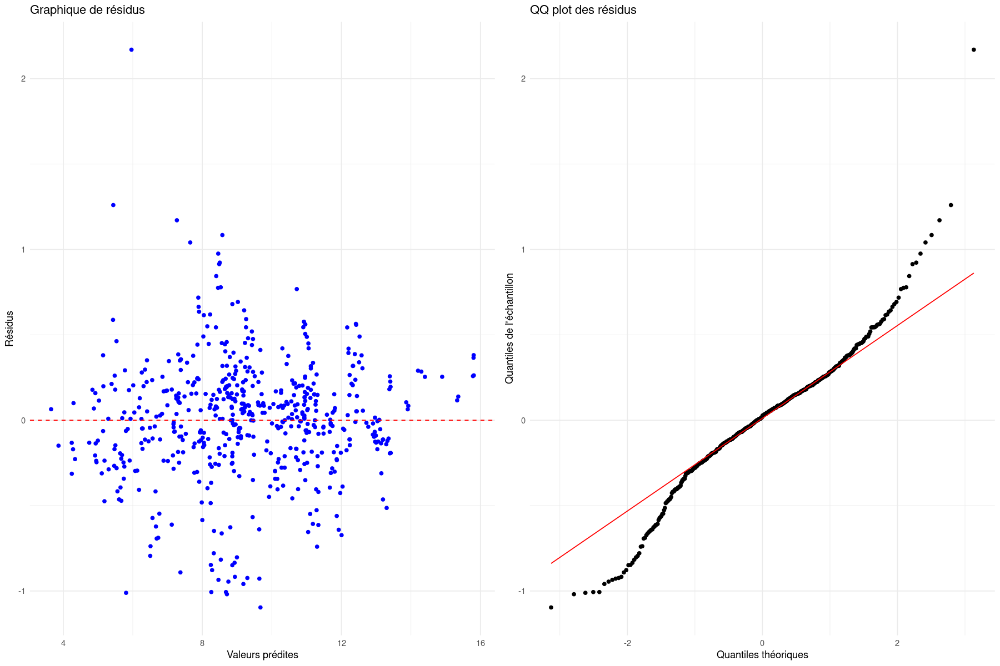

In [180]:
# Prédiction sur les données de test du modèle de régression linéaire avec sélection de variable LASSO
Y_pred_ridge <- predict(final_model_ridge,as.matrix(X_test_quanti))
print("Régression linéaire avec régularisation par Ridge")
performance(X_test,Y_test,Y_pred_ridge)
graphe_residus(Y_test,Y_pred_ridge)

Les performances du modèle Ridge sont très similaires à celles observées dans les modèles de régression linéaire sans ou avec sélection de variable Lasso, backward et forward. Le RMSE et le MAE sont légèrement améliorés par rapport aux deux modèles précédents, indiquant une précision marginale supplémentaire. Le R² et le R² ajusté sont également très proches, mais montrent une légère amélioration, surtout en ce qui concerne le R² ajusté comparé au modèle forward. Cette faible amélioration pourrait indiquer une légère amélioration dans l'explication de la variabilité de la variable dépendante en ajustant pour le nombre de prédicteurs.

Le graphique de résidus et le QQ plot pour le modèle Ridge semblent avoir des caractéristiques similaires à celles observées dans les modèles de sélection de variable (Lasso, backwards et forwards), sans signes apparents de nouvelles anomalies ou différences dans la distribution des résidus.

Nous allons redéfinir la fonction qui permet d'afficher les graphes des résidus. En effet, le QQ-plot n'est pas pertinent lorsque nous avons des modèles différents des régressions linéaires. Nous allons uniquement afficher le scatter plot pour les modèles suivants.

In [186]:
graphe_residus <- function(Y_test, Y_pred) {
  residus <- Y_test - Y_pred
  data <- data.frame(Y_pred, residus)
  
  # Scatter plot des résidus
  p1 <- ggplot(data, aes(x = Y_pred, y = residus)) +
    geom_point(color = "blue") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
    labs(title = "Graphique de résidus", x = "Valeurs prédites", y = "Résidus") +
    theme_minimal()

  
  # Afficher les deux graphiques côte à côte
  grid.arrange(p1)
}

[1] "SVR avec noyau linéaire"
RMSE: 0.3604645 
MAE: 0.2611365 
R²: 0.9770837 
R² ajusté: 0.9764231 


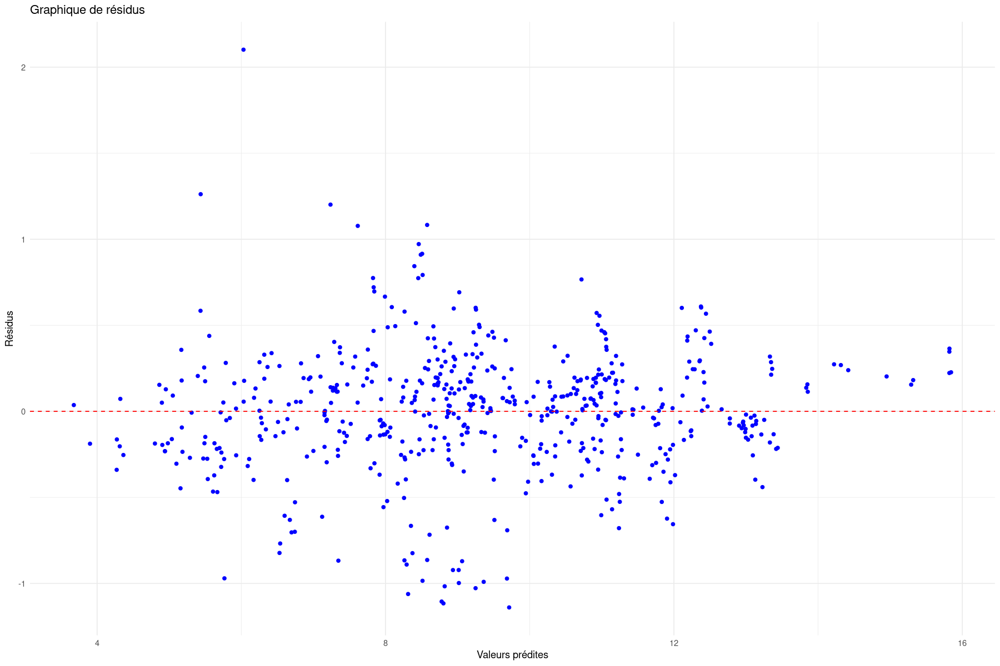

In [187]:
Y_pred_SVR_lin <- predict(model_SVR_lin,as.matrix(X_test_quanti))
print("SVR avec noyau linéaire")
performance(X_test,Y_test,Y_pred_SVR_lin)
graphe_residus(Y_test,Y_pred_SVR_lin)

[1] "SVR avec noyau radial"
RMSE: 0.2450904 
MAE: 0.08357066 
R²: 0.9893651 
R² ajusté: 0.9890585 


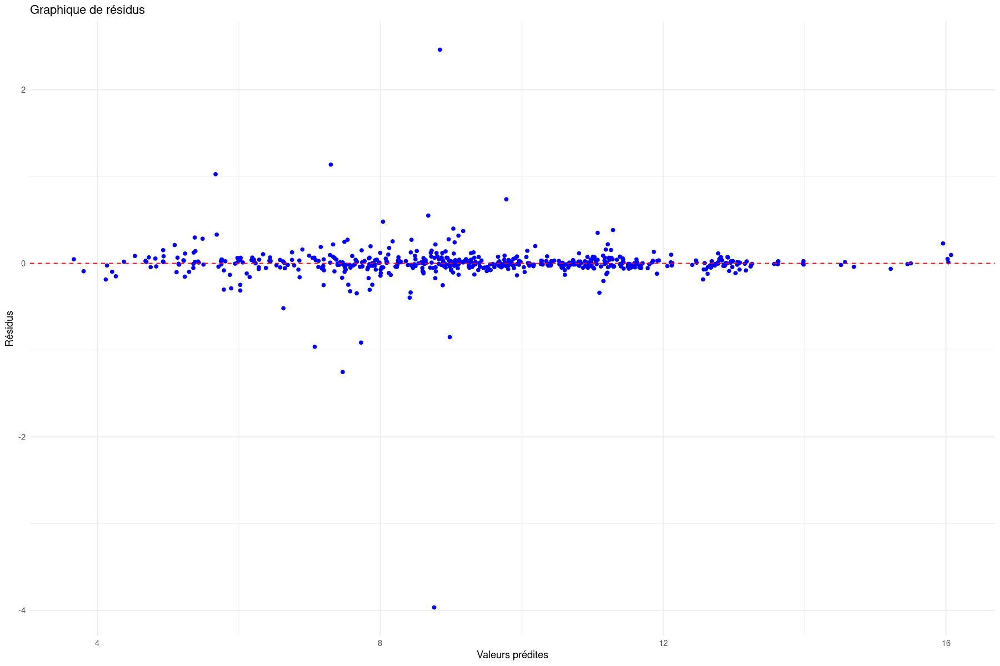

In [188]:
Y_pred_SVR_rad <- predict(model_SVR_rad,as.matrix(X_test_quanti))
print("SVR avec noyau radial")
performance(X_test,Y_test,Y_pred_SVR_rad)
graphe_residus(Y_test,Y_pred_SVR_rad)

* SVM avec noyau linéaire :

Ce modèle présente des performances légèrement inférieures en termes de R² et de R² ajusté par rapport aux modèles de régression linéaire et de régression avec régularisation Ridge, mais le R² reste très élevé, indiquant que le modèle explique toujours une grande part de la variance de la variable dépendante. Le RMSE est légèrement plus élevé, les prédictions du modèle SVM sont en moyenne légèrement moins précises que celles obtenues avec les modèles précédents. Le MAE est comparable, indiquant que les erreurs moyennes absolues sont très similaires.

Le graphique de résidus montre une dispersion aléatoire des résidus autour de la ligne zéro sans motif apparent ou tendance systématique. Cela suggère que le modèle ne présente pas de biais significatif dans les prédictions. La dispersion semble un peu plus large par rapport aux modèles précédents, indiquant une variance légèrement plus élevée dans les erreurs de prédiction.

* SVM avec noyau radial :

Ce modèle affiche une performance nettement inférieure aux autres modèles examinés auparavant. Le RMSE et le MAE sont beaucoup plus élevés, on a des erreurs de prédiction considérablement plus importantes en moyenne. Le R² et le R² ajusté sont significativement plus faibles, le modèle explique une part beaucoup moins importante de la variance de la variable dépendante. Cette baisse de performance peut s'expliuer par le fait que le smodèles de régression linéaire et la SVM avec noyau linéaire prédisent particulièrement bien les émissions de CO2. Un autre type de noyau est donc mois approprié.

Le graphique de résidus montre une dispersion des résidus bien plus grande et une concentration vers les valeurs prédites médianes. On a potentiellement une non-linéarité ou une hétéroscédasticité que le modèle ne parvient pas à capturer efficacement.

In [194]:
# ajouter graphe des résidus, arbres

In [195]:
# ajouter commentaire des résidus

[1] "Forêt aléatoire sur les données quantitatives"
RMSE: 0.1408905 
MAE: 0.08628053 
R²: 0.9966639 
R² ajusté: 0.9965677 


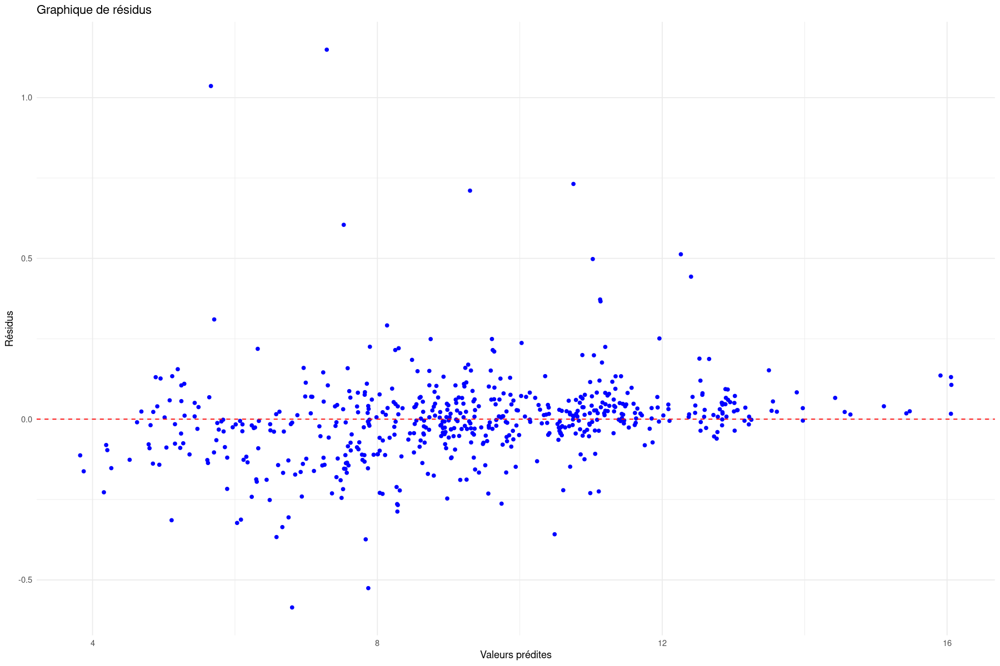

In [198]:
# Prédiction sur les données de test du modèle par forêt aléatoire
print("Forêt aléatoire sur les données quantitatives")
Y_pred_rf <- predict(rf.reg,X_test_quanti)
performance(X_test,Y_test,Y_pred_rf)
graphe_residus(Y_test,Y_pred_rf)

RMSE et MAE sont considérablement plus bas que dans tous les autres modèles, ce qui indique une meilleure précision de prédiction. R² et R² ajusté sont les plus élevés parmi tous les modèles discutés, montrant que ce modèle explique presque toute la variabilité des données.

Le graphique de résidus montre une concentration très serrée des points autour de la ligne zéro. Cette distribution indique que les prédictions sont extrêmement précises, avec peu de variance dans les erreurs de prédiction.

Le modèle de forêt aléatoire avec des variables quantitatives montre une performance supérieure, soulignant l'efficacité de cette méthode pour capturer des relations complexes dans les données sans nécessiter de transformation ou de catégorisation des variables qualitatives. Cette méthode offre à la fois une haute précision et une robustesse contre le surajustement, comme l'indiquent le R² et le R² ajusté extrêmement élevés.

Nous faisons le choix de ne conserver que la meilleure forêt aléatoire pour laquelle nous avons catégorisé les données sur les années et les pays. Sur l'étude des erreurs de généralisation, nous avons observé que la forêt aléatoire qu'on entraînait avec des données comprenant des catégorisations des 5 pays les plus émetteurs de CO2.


[1] "Forêt aléatoire sur les données avec les 5 pays les plus émetteurs de CO2"
RMSE: 0.1351827 
MAE: 0.08355208 
R²: 0.9969524 
R² ajusté: 0.9968646 


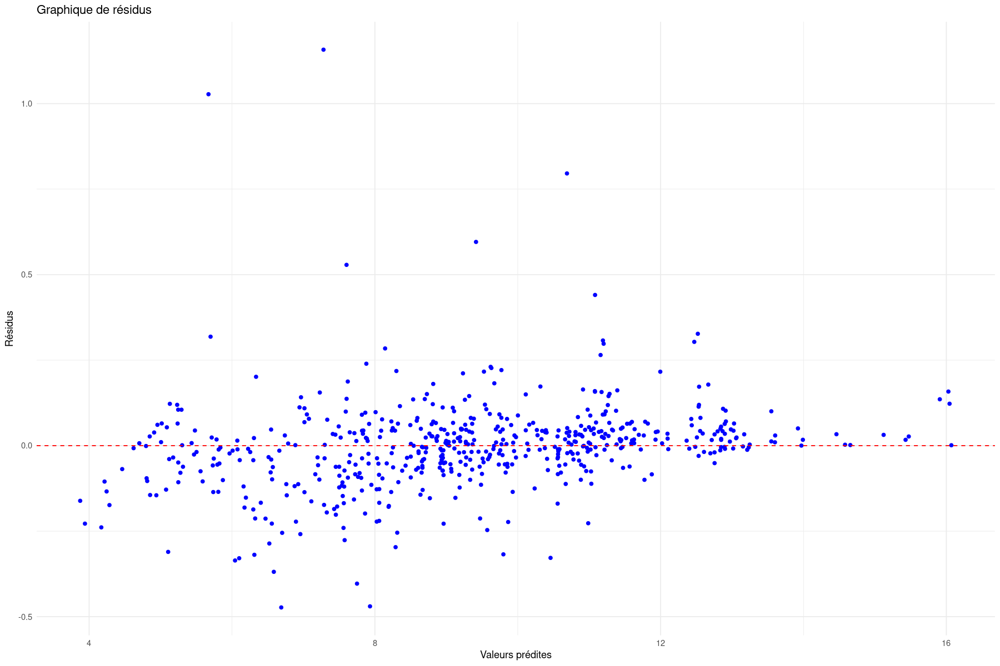

In [199]:
# Prédiction sur les données de test du modèle par forêt aléatoire
print("Forêt aléatoire sur les données avec les 5 pays les plus émetteurs de CO2")
Y_pred_rf_top5 <- predict(forest_model_top5,X_test_entity_polluant)
performance(X_test,Y_test,Y_pred_rf_top5)
graphe_residus(Y_test,Y_pred_rf_top5)

[1] "Boosting"


Using 4971 trees...




RMSE: 0.1983184 
MAE: 0.1373218 
R²: 0.9930724 
R² ajusté: 0.9928727 


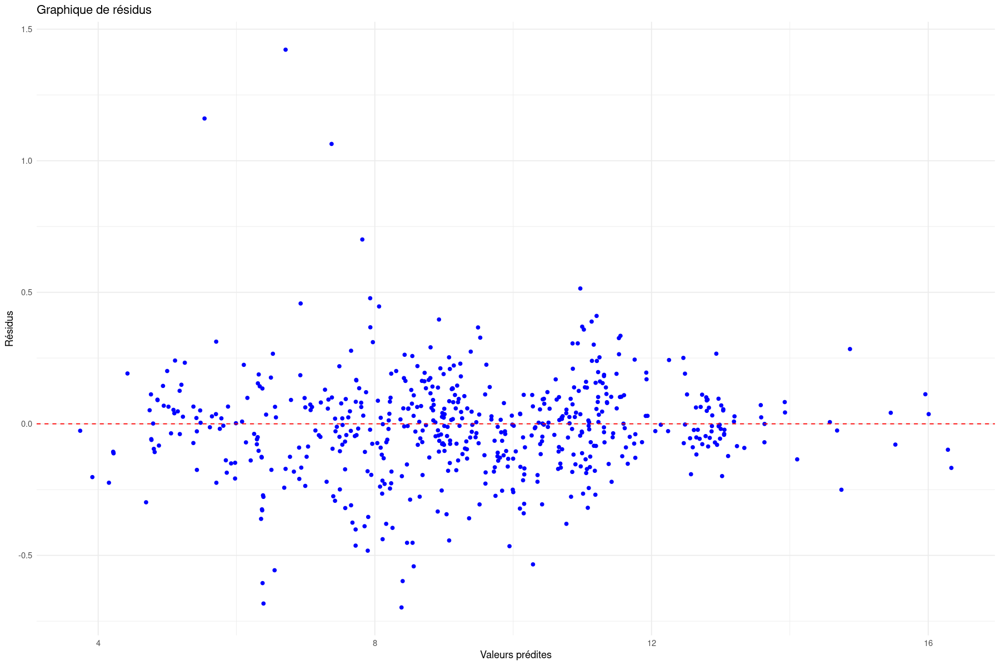

In [201]:
#graphe résidus boosting
print("Boosting")
Y_pred_boost <- predict(boost.reg,as.data.frame(X_test_quanti))
performance(X_test, Y_test, Y_pred_boost)
graphe_residus(Y_test, Y_pred_boost)


[1] "Réseau de neurones"
RMSE: 0.2666887 
MAE: 0.1897751 
R²: 0.9876036 
R² ajusté: 0.9872462 


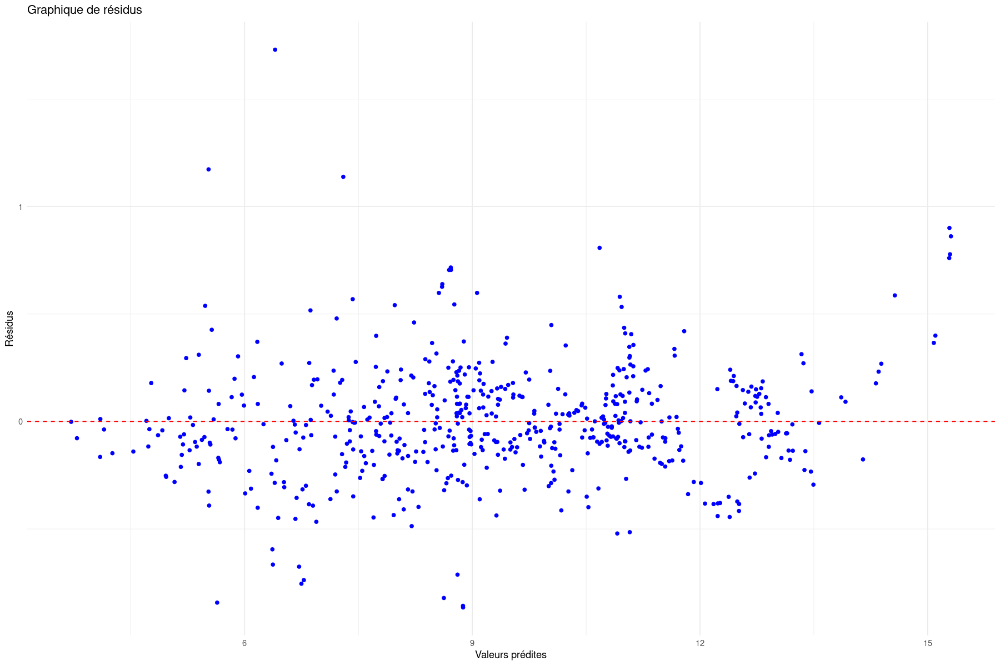

In [203]:
# Prédiction sur les données de test du modèle par réseau de neurones
print("Réseau de neurones")
Y_pred_nne_tf <- predict(nnet.reg,as.data.frame(X_test_quanti))
performance(X_test, Y_test, Y_pred_nne_tf)
graphe_residus(Y_test, Y_pred_nne_tf)


### 2.11.3 - Comparaison des résultats obtenus

In [208]:
recap <- data.frame(
  Méthode = c("Modèle linéaire sans sélection de variable", "Modèle linéaire Backward", "Modèle linéaire Forward", "Régression linéaire avec sélection de variable - LASSO", "Régression linéaire avec régularisation par Ridge", "SVR noyau linéaire", "SVR noyau radial", "Arbre optimal", "Forêt aléatoire (données quantitatives)", "Forêt aléatoire (top5 pays émetteurs)", "Boosting", "Réseau de neuronnes"),
  RMSE = c("x", "x", "x","x","x","x","x","x","x","x","x","x"),
  MAE = c("x", "x", "x","x","x","x","x","x","x","x","x","x"),
  R2 = c("x", "x", "x","x","x","x","x","x","x","x","x","x"),
  R2_ajusté = c("x", "x", "x","x","x","x","x","x","x","x","x","x")
)
recap

Méthode,RMSE,MAE,R2,R2_ajusté
<chr>,<chr>,<chr>,<chr>,<chr>
Modèle linéaire sans sélection de variable,x,x,x,x
Modèle linéaire Backward,x,x,x,x
Modèle linéaire Forward,x,x,x,x
Régression linéaire avec sélection de variable - LASSO,x,x,x,x
Régression linéaire avec régularisation par Ridge,x,x,x,x
SVR noyau linéaire,x,x,x,x
SVR noyau radial,x,x,x,x
Arbre optimal,x,x,x,x
Forêt aléatoire (données quantitatives),x,x,x,x


<span style="color:red">
To do text
</span>

### 2.11.4 - Retour à l'analyse exploratoire des données

Les résultats obtenus sont cohérents avec les observations faites lors de l'analyse exploratoire des données. Tout d'abord, par rapport aux modèles de régresion linéaire avec sélection de variable, nous avons que vu que les variables qui n'étaient pas retenues par Backward, Forward ou encore Lasso sont principalement la longitude, et la part d'énegie renouveable dans le mix énergétique. Dans l'analyse mutidimensionnelle, nous avions vu que la présence d'énergies renouvelables dans le mix énergétique d'un pays ne permettait pas de diminuer significativement ses émissions de CO2. De plus, nous avons remarqué que les coordonnées géographiques (latitude et longitude) n'avaient pas non plus d'influence significative.

Nous avons appliqué la sélection de variables par Lasso avec une catégorisation des années. Nous n'avons pas remarqué d'amélioration de nos erreurs de généralisation. De plus, sur le graphe montrant l'importance des variable spour le modèle, nous avons observé que les années n'apportaient pas ou peu d'information. Cela confirme l'analyse unidimensionnelle de la variable CO2 à modéliser que nous avions effectué. En effet, nous avions remarqué que les émissions de CO2 à l'échelle mondiale étaient globalement constantes au cours des années, même si des outliers aux valeurs très élevées avaient tendance à augmenter. Cela explique donc pouruqoi les années apportent peu d'information.

Enfin, nous avions étudié les pays les plus émetteurs de CO2. Nous avons pu observer que le modèle de forêt aléatoire était plus performant avec un découpage selon ces 5 pays les plus émetteurs et les autres pays. En comparaison avec un découpage par zones économiques ou par continents géographiques, les erreurs de généralisations étaient plus faibles. Cela confirme que les activités des pays jouent un rôle majeur dans les émissions de CO2. C'est pouruqoi cette catégorisation est la plus pertinente. De plus, la comparaison avec les autres découpages confirme à nouveau notre analyse exploratoire : les zones géographiques ou variables économiques apportent moins d'information.

Cependant, il faut nuancer qu'avec le retrait de la variable fossil_elec, certaines variables comme la densité, la part d'énergie renouvelable ou l'accès à l'électricité issue de combustiles propres étaient importantes pour des modèles comme l'arbre optimal. Cela peut s'expliquer par le fait que la variable fossil_elec est très fortement corrélée avec les émissions de CO2, écrasant alors les autres variables. De plus, avec les transformations logarithmiques, on a une renormalisation.

### 2.11.5 -  Visualisation des résultats obtenus

<span style="color:red">
To do
</span>

# 3 - Complétion des valeurs manquantes et recherche d'amélioration de la performance du meilleur modèle

## 3.2 - Complétion de valeurs manquantes dans le jeu de données

Cf Python, ne pas faire en R

## 3.3 - Utilisation d'un autre type de découpage entre les échantillons d'entraînement et de test après complétion de valeurs manquantes

# 4 - Conclusion sur le projet